In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Model evaluation and scoring
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score,
    make_scorer
)

# TimeSeries splitting and cross-validation
from sklearn.model_selection import TimeSeriesSplit, cross_validate, KFold

# Regression models
from sklearn.ensemble import (
    RandomForestRegressor,
    GradientBoostingRegressor,
    AdaBoostRegressor,
    HistGradientBoostingRegressor
)
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, Lasso, ElasticNet
from xgboost import XGBRegressor

# Other utilities
from itertools import combinations
from sklearn.ensemble import IsolationForest

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

# Set global seed for reproducibility
SEED = 123


# EDA

Processing Dhaka: Columns = ['month', 'year', 'CHIRPS', 'ERA5', 'PERSIANN', 'Rainfall']
Evaluation Metrics for Dhaka:

Metrics for CHIRPS:
  R²: 0.2328
  RMSE: 410.3915
  MAE: 245.5911

Metrics for ERA5:
  R²: 0.1627
  RMSE: 428.7340
  MAE: 258.3039

Metrics for PERSIANN:
  R²: 0.2853
  RMSE: 396.1010
  MAE: 230.5381


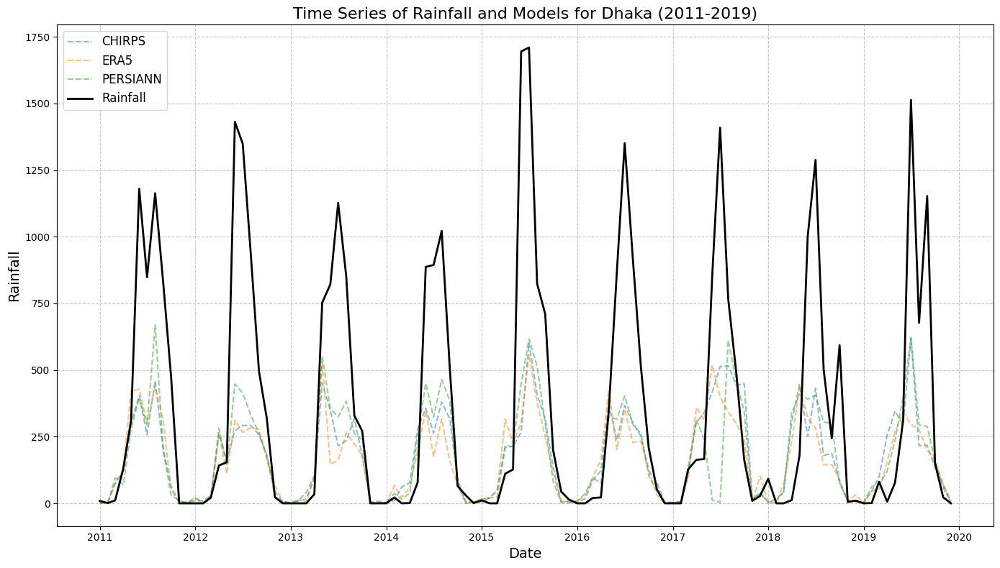

Processing Khetpura: Columns = ['month', 'year', 'CHIRPS', 'ERA5', 'PERSIANN', 'Rainfall']
Evaluation Metrics for Khetpura:

Metrics for CHIRPS:
  R²: 0.8232
  RMSE: 116.4651
  MAE: 74.7795

Metrics for ERA5:
  R²: 0.6177
  RMSE: 171.2775
  MAE: 98.1364

Metrics for PERSIANN:
  R²: 0.6846
  RMSE: 155.5737
  MAE: 79.3617


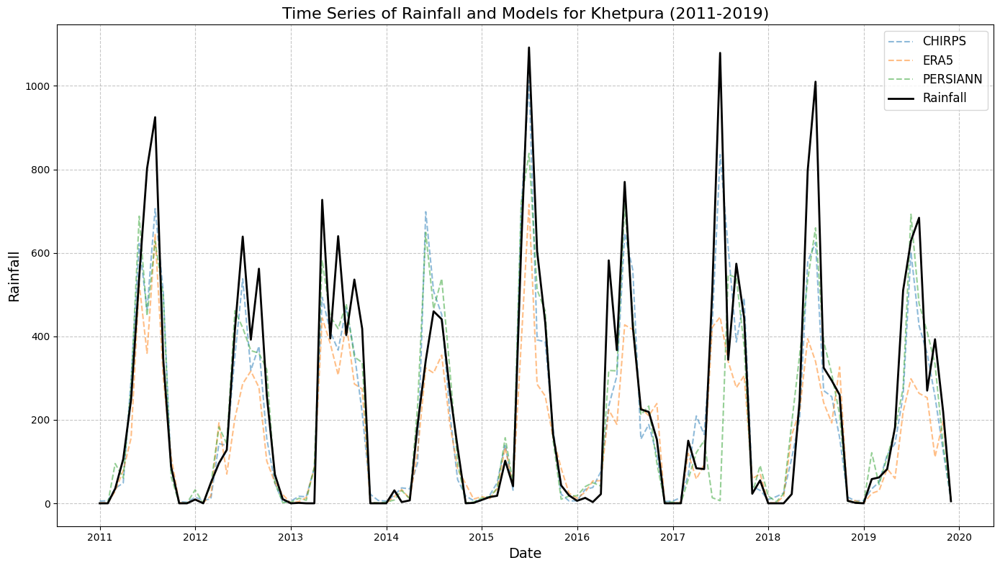

Processing Rangamati: Columns = ['month', 'year', 'CHIRPS', 'ERA5', 'PERSIANN', 'Rainfall']
Evaluation Metrics for Rangamati:

Metrics for CHIRPS:
  R²: 0.7700
  RMSE: 124.9562
  MAE: 80.1478

Metrics for ERA5:
  R²: 0.6233
  RMSE: 159.9046
  MAE: 89.1154

Metrics for PERSIANN:
  R²: 0.5333
  RMSE: 177.9886
  MAE: 85.6310


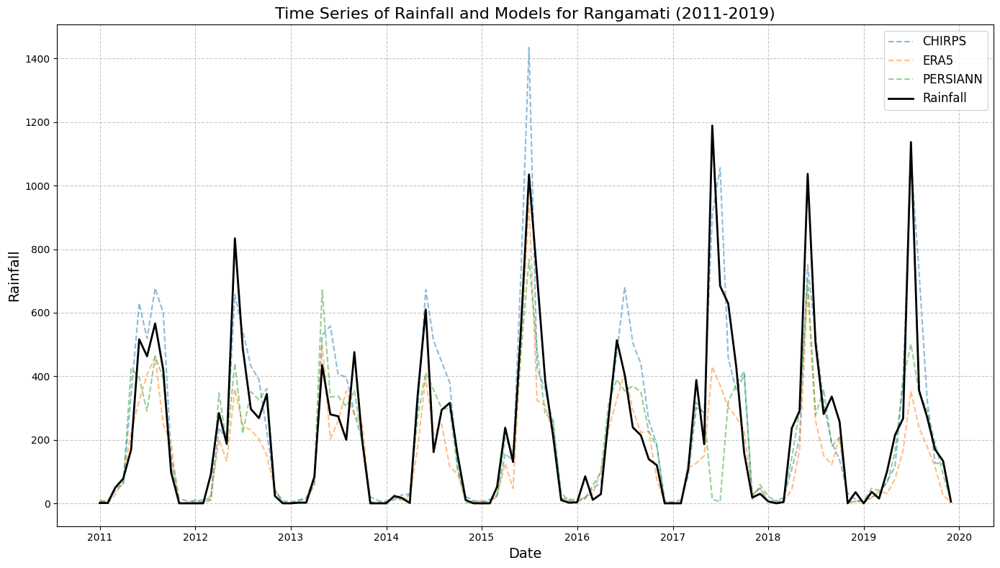

Processing Rangpur: Columns = ['month', 'year', 'CHIRPS', 'ERA5', 'PERSIANN', 'Rainfall']
Evaluation Metrics for Rangpur:

Metrics for CHIRPS:
  R²: 0.7509
  RMSE: 92.0926
  MAE: 51.9469

Metrics for ERA5:
  R²: 0.7064
  RMSE: 99.9674
  MAE: 61.6004

Metrics for PERSIANN:
  R²: 0.8046
  RMSE: 81.5481
  MAE: 51.3776


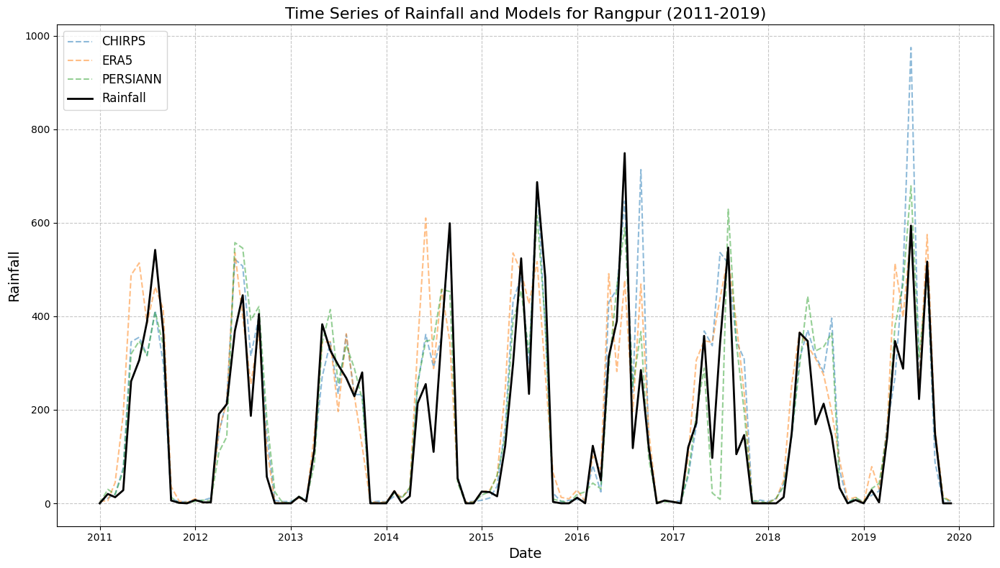

Processing Sreemangal: Columns = ['month', 'year', 'CHIRPS', 'ERA5', 'PERSIANN', 'Rainfall']
Evaluation Metrics for Sreemangal:

Metrics for CHIRPS:
  R²: 0.8334
  RMSE: 82.0132
  MAE: 53.3550

Metrics for ERA5:
  R²: 0.7201
  RMSE: 106.3123
  MAE: 68.9193

Metrics for PERSIANN:
  R²: 0.5443
  RMSE: 135.6519
  MAE: 74.0340


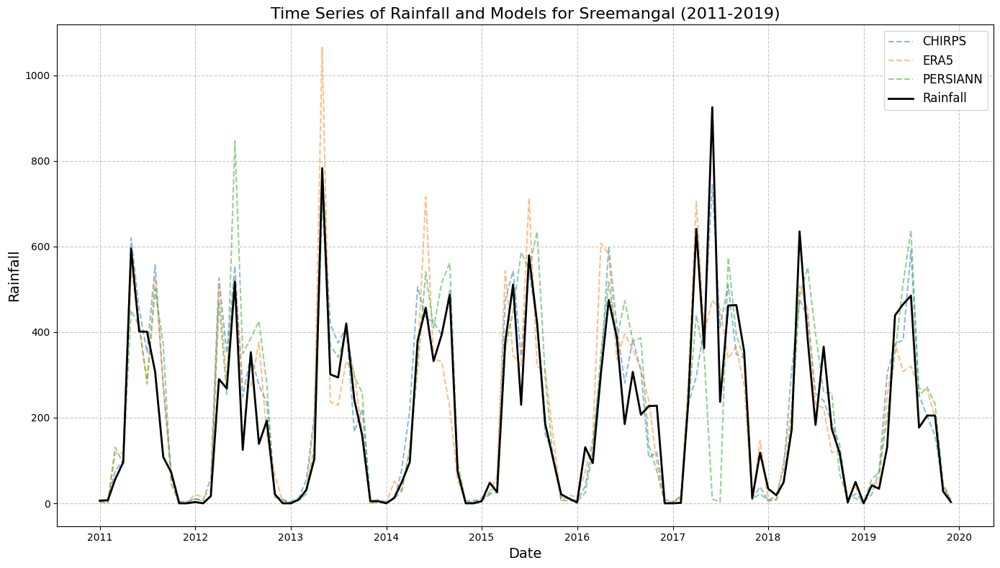

Processing Rajshahi: Columns = ['month', 'year', 'CHIRPS', 'ERA5', 'PERSIANN', 'Rainfall']
Evaluation Metrics for Rajshahi:

Metrics for CHIRPS:
  R²: 0.5978
  RMSE: 68.3964
  MAE: 39.9931

Metrics for ERA5:
  R²: 0.7120
  RMSE: 57.8793
  MAE: 39.2295

Metrics for PERSIANN:
  R²: 0.4415
  RMSE: 80.5984
  MAE: 48.8870


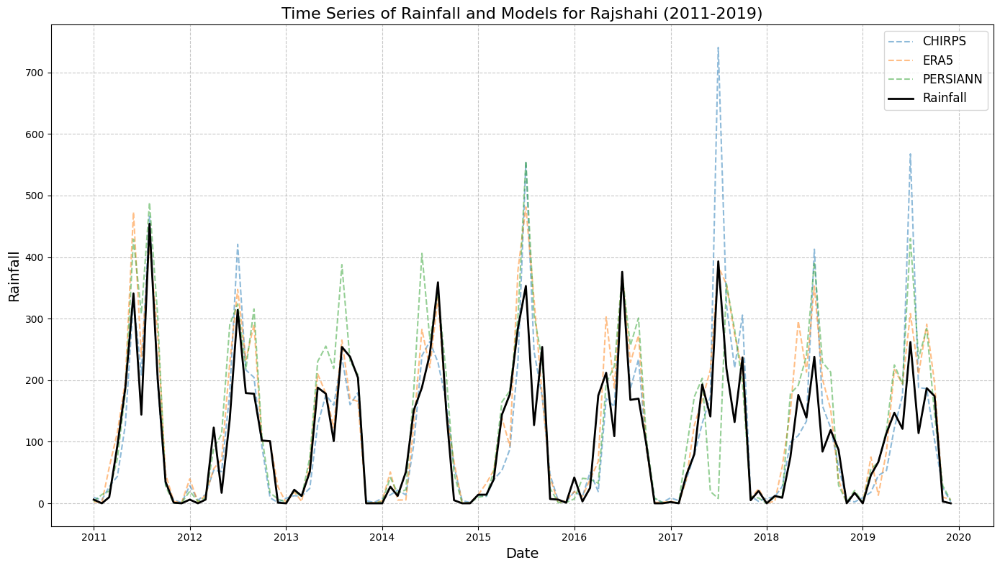

Processing Sylhet: Columns = ['month', 'year', 'CHIRPS', 'ERA5', 'PERSIANN', 'Rainfall']
Evaluation Metrics for Sylhet:

Metrics for CHIRPS:
  R²: 0.6175
  RMSE: 204.3079
  MAE: 127.4145

Metrics for ERA5:
  R²: 0.7546
  RMSE: 163.6371
  MAE: 100.0795

Metrics for PERSIANN:
  R²: 0.6351
  RMSE: 199.5658
  MAE: 117.6475


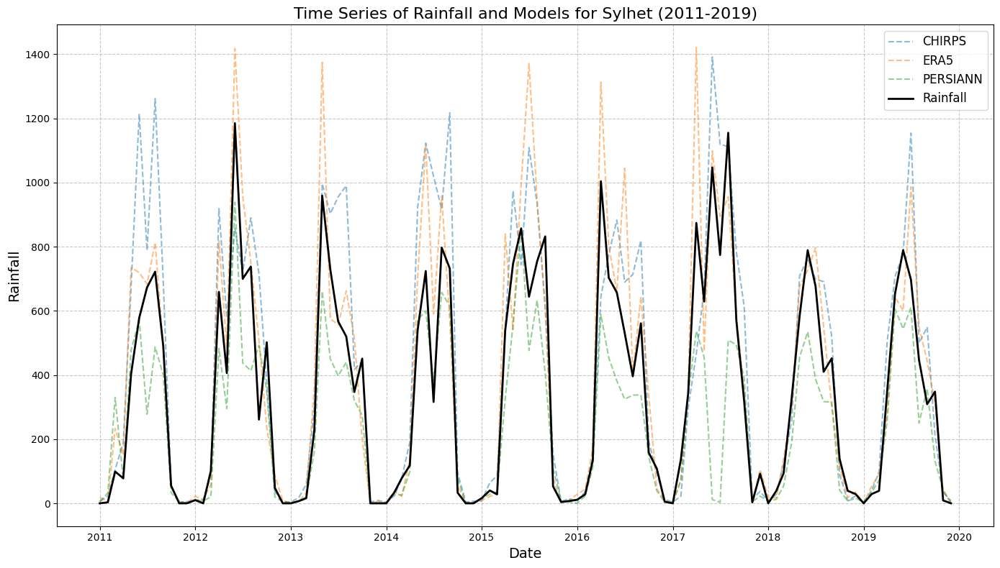

Processing Chittagong: Columns = ['month', 'year', 'CHIRPS', 'ERA5', 'PERSIANN', 'Rainfall']
Evaluation Metrics for Chittagong:

Metrics for CHIRPS:
  R²: 0.8118
  RMSE: 144.4654
  MAE: 83.1837

Metrics for ERA5:
  R²: 0.6659
  RMSE: 192.5156
  MAE: 97.1214

Metrics for PERSIANN:
  R²: 0.5987
  RMSE: 210.9707
  MAE: 100.3519


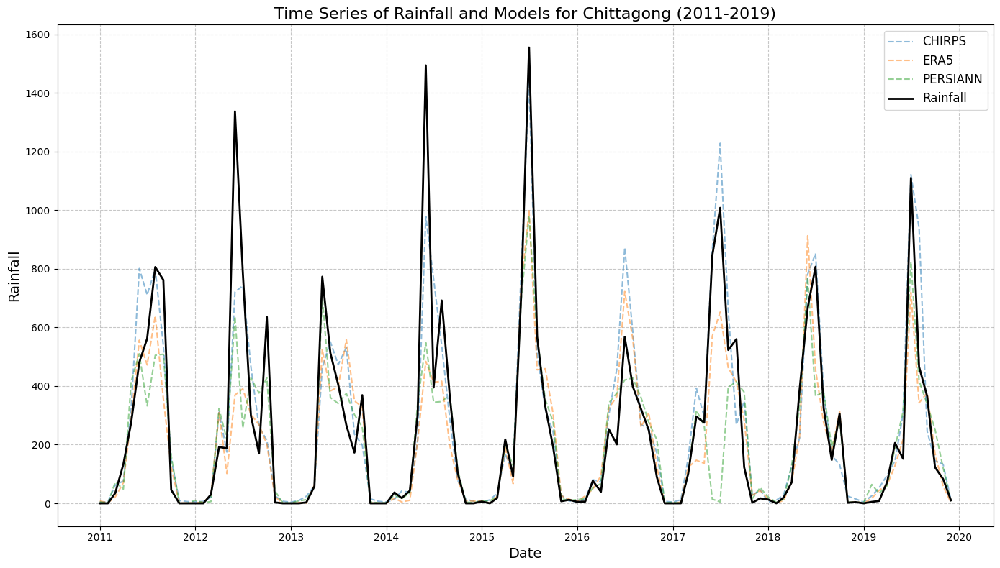

Processing Khulna: Columns = ['month', 'year', 'CHIRPS', 'ERA5', 'PERSIANN', 'Rainfall']
Evaluation Metrics for Khulna:

Metrics for CHIRPS:
  R²: 0.8786
  RMSE: 62.3905
  MAE: 41.2597

Metrics for ERA5:
  R²: 0.8040
  RMSE: 79.2585
  MAE: 54.6616

Metrics for PERSIANN:
  R²: 0.6578
  RMSE: 104.7276
  MAE: 59.2967


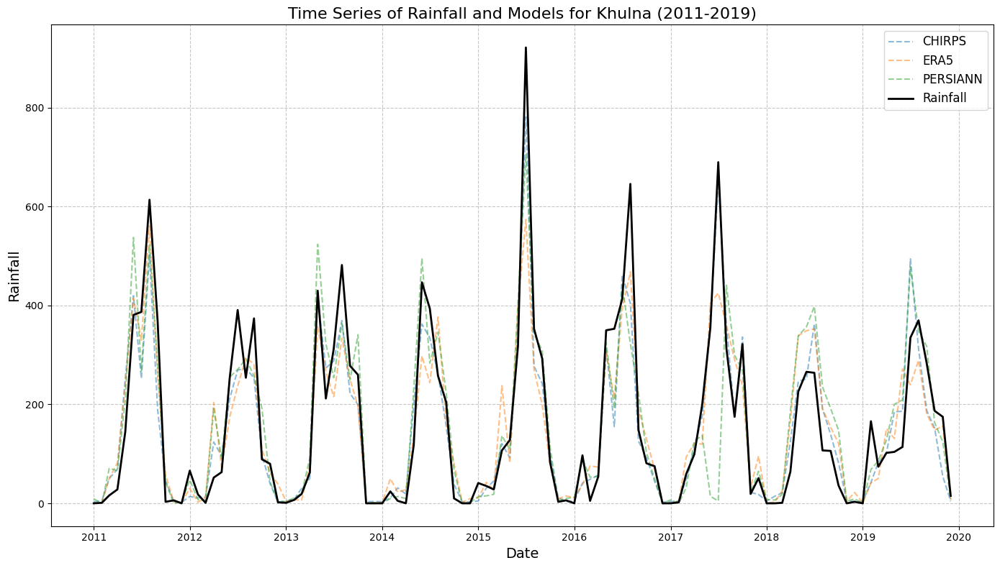

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import glob

# Define the path where all CSV files are stored
file_path_pattern = r"/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/Station Data/merged/*.csv"

# Get all CSV file paths
csv_files = glob.glob(file_path_pattern)

# Loop through each CSV file
for file in csv_files:
    # Extract the station name from the file name
    station_name = file.split('/')[-1].replace('_data.csv', '')

    # Load the CSV file into a DataFrame
    df = pd.read_csv(file)

    # Debug: Print the column names
    print(f"Processing {station_name}: Columns = {df.columns.tolist()}")

    # Standardize column names
    df.columns = df.columns.str.strip().str.upper()

    # Create a datetime column using 'month' and 'year'
    if 'YEAR' in df.columns and 'MONTH' in df.columns:
        df['DATE'] = pd.to_datetime(df[['YEAR', 'MONTH']].assign(DAY=1))
        df.set_index('DATE', inplace=True)
        df.drop(columns=['MONTH', 'YEAR'], inplace=True)
    else:
        print(f"Error: 'YEAR' and 'MONTH' columns not found in {station_name}. Skipping...")
        continue

    # Filter data for the time period 2011-2019
    df_filtered = df.loc['2011-01-01':'2019-12-31']

    # Check for required columns
    required_columns = ['CHIRPS', 'ERA5', 'PERSIANN', 'RAINFALL']
    missing_columns = [col for col in required_columns if col not in df_filtered.columns]
    if missing_columns:
        print(f"Error: Missing columns {missing_columns} in {station_name}. Skipping...")
        continue

    # Initialize a dictionary to store evaluation metrics
    metrics = {}

    # Calculate R², RMSE, and MAE for each column compared to 'Rainfall'
    for column in ['CHIRPS', 'ERA5', 'PERSIANN']:
        r2 = r2_score(df_filtered['RAINFALL'], df_filtered[column])
        rmse = np.sqrt(mean_squared_error(df_filtered['RAINFALL'], df_filtered[column]))
        mae = mean_absolute_error(df_filtered['RAINFALL'], df_filtered[column])

        metrics[column] = {
            'R²': r2,
            'RMSE': rmse,
            'MAE': mae
        }

    # Display metrics for the current station
    print(f"Evaluation Metrics for {station_name}:")
    for column, values in metrics.items():
        print(f"\nMetrics for {column}:")
        for metric_name, metric_value in values.items():
            print(f"  {metric_name}: {metric_value:.4f}")

    # Plot the time series for 'CHIRPS', 'ERA5', 'PERSIANN', and 'Rainfall'
    plt.figure(figsize=(14, 8))

    # Plot lighter colors for CHIRPS, ERA5, PERSIANN
    for column in ['CHIRPS', 'ERA5', 'PERSIANN']:
        plt.plot(df_filtered.index, df_filtered[column], label=column, alpha=0.5, linestyle='--')

    # Plot darker color for Rainfall
    plt.plot(df_filtered.index, df_filtered['RAINFALL'], label='Rainfall', color='black', linewidth=2)

    # Add title and labels
    plt.title(f"Time Series of Rainfall and Models for {station_name} (2011-2019)", fontsize=16)
    plt.xlabel("Date", fontsize=14)
    plt.ylabel("Rainfall", fontsize=14)

    # Add legend and grid
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()

    # Show the plot
    plt.show()


## Load Dataset

In [ ]:
df = pd.read_csv(r"/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/Station Data/merged/Chittagong_data.csv")
df

,month,year,CHIRPS,ERA5,PERSIANN,Rainfall
0,1,1990,3.521416,0.722247,0.000000,0
1,2,1990,23.893539,45.246027,52.407619,39
2,3,1990,85.988426,216.251239,115.390997,53
3,4,1990,169.253095,111.305803,164.653430,250
4,5,1990,205.825811,296.922803,299.743298,205
...,...,...,...,...,...,...
355,8,2019,938.894867,342.533678,418.187431,466
356,9,2019,245.334276,377.146780,337.880162,365
357,10,2019,145.467501,169.585273,252.805042,123
358,11,2019,133.079969,58.242425,121.049095,83


## Datetime

In [ ]:
# Create a datetime column using 'month' and 'year'
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# Set the 'date' column as the index
df.set_index('date', inplace=True)
df

,month,year,CHIRPS,ERA5,PERSIANN,Rainfall
date,,,,,,
1990-01-01,1,1990,3.521416,0.722247,0.000000,0
1990-02-01,2,1990,23.893539,45.246027,52.407619,39
1990-03-01,3,1990,85.988426,216.251239,115.390997,53
1990-04-01,4,1990,169.253095,111.305803,164.653430,250
1990-05-01,5,1990,205.825811,296.922803,299.743298,205
...,...,...,...,...,...,...
2019-08-01,8,2019,938.894867,342.533678,418.187431,466
2019-09-01,9,2019,245.334276,377.146780,337.880162,365
2019-10-01,10,2019,145.467501,169.585273,252.805042,123


In [ ]:
# Drop the 'month' and 'year' columns
df.drop(columns=['month', 'year'], inplace=True)
df

,CHIRPS,ERA5,PERSIANN,Rainfall
date,,,,
1990-01-01,3.521416,0.722247,0.000000,0
1990-02-01,23.893539,45.246027,52.407619,39
1990-03-01,85.988426,216.251239,115.390997,53
1990-04-01,169.253095,111.305803,164.653430,250
1990-05-01,205.825811,296.922803,299.743298,205
...,...,...,...,...
2019-08-01,938.894867,342.533678,418.187431,466
2019-09-01,245.334276,377.146780,337.880162,365
2019-10-01,145.467501,169.585273,252.805042,123


## Corr-Matrix 1

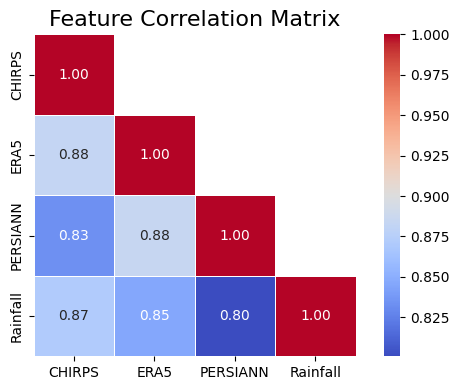

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Calculate the correlation matrix
correlation_matrix = df.corr()

# Create a mask for the upper triangle excluding the diagonal
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool), k=1)

# Set up the matplotlib figure
plt.figure(figsize=(6, 4))
plt.title("Feature Correlation Matrix", fontsize=16)

# Draw the heatmap with the mask applied
sns.heatmap(
    correlation_matrix,
    mask=mask,
    cmap='coolwarm',
    annot=True,
    fmt=".2f",
    cbar=True,
    square=True,
    linewidths=0.5
)

plt.tight_layout()
plt.show()


## Dataset Info

In [ ]:
df.describe()

,CHIRPS,ERA5,PERSIANN,Rainfall
count,360.000000,360.000000,359.000000,360.000000
mean,248.465121,224.989843,218.930803,246.291667
std,282.511684,230.073154,211.328870,298.291777
min,3.521416,0.000000,0.000000,0.000000
25%,16.044125,17.550409,17.401680,11.500000
50%,156.379177,157.580838,187.198907,128.500000
75%,393.852583,383.649156,369.917614,377.750000
max,1440.728363,997.933865,981.876105,1555.000000


## Isolation Forest

In [ ]:
from sklearn.ensemble import IsolationForest
import pandas as pd

# Initialize the Isolation Forest
iso_forest = IsolationForest(contamination=0.25, random_state=SEED)  # Adjust contamination as needed (proportion of outliers)

# Fit the model and predict anomalies
outlier_labels = iso_forest.fit_predict(df)

# Add the outlier labels to the DataFrame
df['Outlier'] = outlier_labels  # 1 for inliers, -1 for outliers

# Filter out the outliers
cleaned_df = df[df['Outlier'] == 1].drop(columns=['Outlier'])

# Print the results
print(f"Original DataFrame shape: {df.shape}")
print(f"Cleaned DataFrame shape: {cleaned_df.shape}")


Original DataFrame shape: (360, 5)
Cleaned DataFrame shape: (270, 4)


In [ ]:
df = cleaned_df.copy()
df.describe()

,CHIRPS,ERA5,PERSIANN,Rainfall
count,270.000000,270.000000,269.000000,270.000000
mean,146.922543,143.754841,150.337733,137.511111
std,176.612362,162.462966,161.380055,170.583402
min,3.521416,0.000000,0.000000,0.000000
25%,10.480170,7.687341,9.110242,3.000000
50%,57.556300,51.627988,67.149579,61.000000
75%,242.995272,283.466876,302.590001,230.750000
max,676.269035,578.279138,567.724868,757.000000


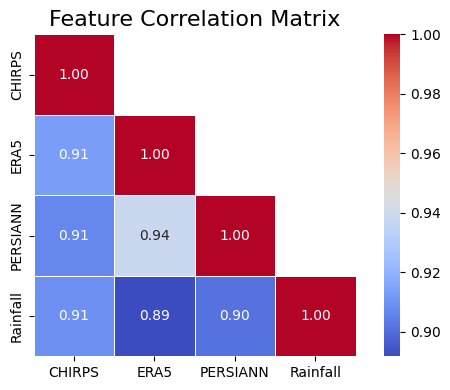

In [ ]:


# Calculate the correlation matrix
correlation_matrix = df.corr()

# Create a mask for the upper triangle excluding the diagonal
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool), k=1)

# Set up the matplotlib figure
plt.figure(figsize=(6, 4))
plt.title("Feature Correlation Matrix", fontsize=16)

# Draw the heatmap with the mask applied
sns.heatmap(
    correlation_matrix,
    mask=mask,
    cmap='coolwarm',
    annot=True,
    fmt=".2f",
    cbar=True,
    square=True,
    linewidths=0.5
)

plt.tight_layout()
plt.show()


In [ ]:
df = cleaned_df.copy()
df = df.dropna()
df.shape

(269, 4)

In [ ]:
# Drop the 'month' and 'year' columns
df2 = df.drop(columns=['PERSIANN'], axis = 1)
df2

,CHIRPS,ERA5,Rainfall
date,,,
1990-01-01,3.521416,0.722247,0
1990-02-01,23.893539,45.246027,39
1990-05-01,205.825811,296.922803,205
1990-06-01,603.949801,510.700285,668
1990-08-01,337.908754,313.337982,115
...,...,...,...
2019-06-01,305.256363,218.135253,152
2019-09-01,245.334276,377.146780,365
2019-10-01,145.467501,169.585273,123


In [ ]:
df3 = df.drop(columns=['ERA5'], axis = 1)
df3

,CHIRPS,PERSIANN,Rainfall
date,,,
1990-01-01,3.521416,0.000000,0
1990-02-01,23.893539,52.407619,39
1990-05-01,205.825811,299.743298,205
1990-06-01,603.949801,438.320581,668
1990-08-01,337.908754,274.294407,115
...,...,...,...
2019-06-01,305.256363,314.251703,152
2019-09-01,245.334276,337.880162,365
2019-10-01,145.467501,252.805042,123


In [ ]:
# Drop the 'month' and 'year' columns
df4 = df.drop(columns=['CHIRPS'], axis = 1)
df4

,ERA5,PERSIANN,Rainfall
date,,,
1990-01-01,0.722247,0.000000,0
1990-02-01,45.246027,52.407619,39
1990-05-01,296.922803,299.743298,205
1990-06-01,510.700285,438.320581,668
1990-08-01,313.337982,274.294407,115
...,...,...,...
2019-06-01,218.135253,314.251703,152
2019-09-01,377.146780,337.880162,365
2019-10-01,169.585273,252.805042,123


In [ ]:
df5 = df.drop(columns=['PERSIANN','ERA5'], axis = 1)
df5

,CHIRPS,Rainfall
date,,
1990-01-01,3.521416,0
1990-02-01,23.893539,39
1990-05-01,205.825811,205
1990-06-01,603.949801,668
1990-08-01,337.908754,115
...,...,...
2019-06-01,305.256363,152
2019-09-01,245.334276,365
2019-10-01,145.467501,123


In [ ]:
df6 = df.drop(columns=['CHIRPS','PERSIANN'], axis = 1)
df6

,ERA5,Rainfall
date,,
1990-01-01,0.722247,0
1990-02-01,45.246027,39
1990-05-01,296.922803,205
1990-06-01,510.700285,668
1990-08-01,313.337982,115
...,...,...
2019-06-01,218.135253,152
2019-09-01,377.146780,365
2019-10-01,169.585273,123


In [ ]:
df7 = df.drop(columns=['CHIRPS','ERA5'], axis = 1)
df7

,PERSIANN,Rainfall
date,,
1990-01-01,0.000000,0
1990-02-01,52.407619,39
1990-05-01,299.743298,205
1990-06-01,438.320581,668
1990-08-01,274.294407,115
...,...,...
2019-06-01,314.251703,152
2019-09-01,337.880162,365
2019-10-01,252.805042,123


## Split

In [ ]:
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target
# Split into features (X) and target (y)
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target

# Split into training and testing sets
X_train = X.loc['1990-01-01':'2019-12-31']
y_train = y.loc['1990-01-01':'2019-12-31']


In [ ]:
X

,CHIRPS,ERA5,PERSIANN
date,,,
1990-01-01,3.521416,0.722247,0.000000
1990-02-01,23.893539,45.246027,52.407619
1990-05-01,205.825811,296.922803,299.743298
1990-06-01,603.949801,510.700285,438.320581
1990-08-01,337.908754,313.337982,274.294407
...,...,...,...
2019-06-01,305.256363,218.135253,314.251703
2019-09-01,245.334276,377.146780,337.880162
2019-10-01,145.467501,169.585273,252.805042


In [ ]:
# For X2 and y2
X2 = df2.drop(columns=['Rainfall'])  # Features
y2 = df2['Rainfall']  # Target

X2_train = X2.loc['1990-01-01':'2019-12-31']  # Training features
y2_train = y2.loc['1990-01-01':'2019-12-31']  # Training target

# For X3 and y3
X3 = df3.drop(columns=['Rainfall'])  # Features
y3 = df3['Rainfall']  # Target

X3_train = X3.loc['1990-01-01':'2019-12-31']  # Training features
y3_train = y3.loc['1990-01-01':'2019-12-31']  # Training target

# For X4 and y4
X4 = df4.drop(columns=['Rainfall'])  # Features
y4 = df4['Rainfall']  # Target

X4_train = X4.loc['1990-01-01':'2019-12-31']  # Training features
y4_train = y4.loc['1990-01-01':'2019-12-31']  # Training target

# For X5 and y5
X5 = df5.drop(columns=['Rainfall'])  # Features
y5 = df5['Rainfall']  # Target

X5_train = X5.loc['1990-01-01':'2019-12-31']  # Training features
y5_train = y5.loc['1990-01-01':'2019-12-31']  # Training target

# For X6 and y6
X6 = df6.drop(columns=['Rainfall'])  # Features
y6 = df6['Rainfall']  # Target

X6_train = X6.loc['1990-01-01':'2019-12-31']  # Training features
y6_train = y6.loc['1990-01-01':'2019-12-31']  # Training target

# For X7 and y7
X7 = df7.drop(columns=['Rainfall'])  # Features
y7 = df7['Rainfall']  # Target

X7_train = X7.loc['1990-01-01':'2019-12-31']  # Training features
y7_train = y7.loc['1990-01-01':'2019-12-31']  # Training target


## Base ML

In [ ]:
from sklearn.model_selection import TimeSeriesSplit, cross_validate
from sklearn.metrics import make_scorer, mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Ridge, LinearRegression
from xgboost import XGBRegressor  # Import XGBRegressor

SEED = 123

# Define selected algorithms to evaluate
algorithms = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(random_state=SEED, n_estimators=100),
    "XGBoost": XGBRegressor(random_state=SEED, n_estimators=100, learning_rate=0.1),
    "KNN": KNeighborsRegressor(n_neighbors=5),
}

# Scoring metrics
scoring = {
    "MAE": make_scorer(mean_absolute_error, greater_is_better=False),
    "RMSE": make_scorer(lambda y, y_pred: np.sqrt(mean_squared_error(y, y_pred)), greater_is_better=False),
    "R2": "r2"
}

# TimeSeriesSplit for temporal cross-validation
tscv = TimeSeriesSplit(n_splits=20)

# Results storage
results = {}
cv_predictions = {}

for name, model in algorithms.items():
    print(f"Fitting {name}...")

    # Manually handle TimeSeriesSplit
    y_pred_full = np.zeros_like(y_train)
    for train_idx, test_idx in tscv.split(X_train):
        X_train_fold, X_test_fold = X_train.iloc[train_idx], X_train.iloc[test_idx]
        y_train_fold, y_test_fold = y_train.iloc[train_idx], y_train.iloc[test_idx]

        # Fit the model
        model.fit(X_train_fold, y_train_fold)

        # Predict on the test fold
        y_pred_full[test_idx] = model.predict(X_test_fold)

    # Evaluate metrics on the full set of predictions
    mae = mean_absolute_error(y_train, y_pred_full)
    rmse = np.sqrt(mean_squared_error(y_train, y_pred_full))
    r2 = r2_score(y_train, y_pred_full)

    # Store metrics
    results[name] = {"Mean MAE": mae, "Mean RMSE": rmse, "R2": r2}
    cv_predictions[name] = y_pred_full

# Convert results dictionary to DataFrame
results_df = pd.DataFrame.from_dict(results, orient='index').reset_index().rename(columns={"index": "Model"})

# Display results
print("\nModel Performance with Time Series Cross-Validation:")
print(results_df)


Fitting Linear Regression...
Fitting Random Forest...
Fitting XGBoost...
Fitting KNN...

Model Performance with Time Series Cross-Validation:
               Model   Mean MAE   Mean RMSE        R2
0  Linear Regression  51.762082  100.216086  0.654840
1      Random Forest  54.323420  101.004012  0.649391
2            XGBoost  58.605948  105.632227  0.616524
3                KNN  52.379182   99.890833  0.657077


In [ ]:
results_df

,Model,Mean MAE,Mean RMSE,R2
0,Linear Regression,51.762082,100.216086,0.654840
1,Random Forest,54.323420,101.004012,0.649391
2,XGBoost,58.605948,105.632227,0.616524
3,KNN,52.379182,99.890833,0.657077


In [ ]:
# Define a function to handle cross-validation for each dataset
def evaluate_models(X, y, algorithms, tscv, scoring):
    results = {}
    for name, model in algorithms.items():
        print(f"Fitting {name} for current dataset...")
        y_pred_full = np.zeros_like(y)

        for train_idx, test_idx in tscv.split(X):
            X_train_fold, X_test_fold = X.iloc[train_idx], X.iloc[test_idx]
            y_train_fold, y_test_fold = y.iloc[train_idx], y.iloc[test_idx]

            # Fit the model
            model.fit(X_train_fold, y_train_fold)

            # Predict on the test fold
            y_pred_full[test_idx] = model.predict(X_test_fold)

        # Evaluate metrics on the full set of predictions
        mae = mean_absolute_error(y, y_pred_full)
        rmse = np.sqrt(mean_squared_error(y, y_pred_full))
        r2 = r2_score(y, y_pred_full)

        # Store metrics
        results[name] = {"Mean MAE": mae, "Mean RMSE": rmse, "R2": r2}

    return results

# Iterate through datasets X2, X3, ..., Xn
datasets = {
    "Dataset 2": (X2, y2),
    "Dataset 3": (X3, y3),
    "Dataset 4": (X4, y4),
    "Dataset 5": (X5, y5),
    "Dataset 6": (X6, y6),
    "Dataset 7": (X7, y7),
}

overall_results = {}

for dataset_name, (X, y) in datasets.items():
    print(f"Processing {dataset_name}...")
    dataset_results = evaluate_models(X, y, algorithms, tscv, scoring)
    overall_results[dataset_name] = dataset_results

    # Convert results dictionary to DataFrame
    results_df = pd.DataFrame.from_dict(dataset_results, orient='index').reset_index().rename(columns={"index": "Model"})
    print(f"\nResults for {dataset_name}:")
    print(results_df)


Processing Dataset 2...
Fitting Linear Regression for current dataset...
Fitting Random Forest for current dataset...
Fitting XGBoost for current dataset...
Fitting KNN for current dataset...

Results for Dataset 2:
               Model   Mean MAE   Mean RMSE        R2
0  Linear Regression  53.044610  101.774790  0.644020
1      Random Forest  58.821561  107.364421  0.603844
2            XGBoost  64.914498  116.686980  0.532060
3                KNN  53.338290  101.365253  0.646879
Processing Dataset 3...
Fitting Linear Regression for current dataset...
Fitting Random Forest for current dataset...
Fitting XGBoost for current dataset...
Fitting KNN for current dataset...

Results for Dataset 3:
               Model   Mean MAE   Mean RMSE        R2
0  Linear Regression  51.468401   99.869003  0.657227
1      Random Forest  55.936803  101.912620  0.643055
2            XGBoost  60.353160  107.339350  0.604029
3                KNN  53.368030  100.130175  0.655432
Processing Dataset 4...
Fitt

In [ ]:
df = cleaned_df.copy()
df = df.dropna()
df.shape

(269, 4)

In [ ]:
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target
# Split into features (X) and target (y)
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target


# Split into training and testing sets
X_train = X.loc['1990-01-01':'2019-12-31']
y_train = y.loc['1990-01-01':'2019-12-31']
X_test = X.loc['2011-01-01':'2019-12-31']
y_test = y.loc['2011-01-01':'2019-12-31']


# Hybrid

In [ ]:
# Add the directory to Python's module search path
import sys
sys.path.append("/content/drive/MyDrive/Projects/OMON Rnn/ML")

# Import the SimpleStackingRegressor class
from stacking_model import SimpleStackingRegressor

# Initialize and use the class
stacking_model = SimpleStackingRegressor(verbose=True)

In [ ]:
stacking_model.fit(X_train, y_train)

# Evaluate
metrics = stacking_model.evaluate(X_test, y_test)
print("Evaluation Metrics:", metrics)

Getting out-of-fold predictions...
Training xgb model...
Training Linear Regression model...
Fitting meta-model...
Fitting base models on full dataset...
Evaluation Metrics: {'r2': 0.8984772562807021, 'rmse': 53.1344789862746, 'mae': 31.364285714285707}


In [ ]:
# Define the datasets (example: X2, X3, ..., Xn and y2, y3, ..., yn)
datasets = {
    "Dataset 2": (X2, y2),
    "Dataset 3": (X3, y3),
    "Dataset 4": (X4, y4),
    "Dataset 5": (X5, y5),
    "Dataset 6": (X6, y6),
    "Dataset 7": (X7, y7),
}

# Define test range
test_range = ('2011-01-01', '2019-12-31')

# Initialize results storage
all_metrics = {}

# Loop through datasets
for dataset_name, (X, y) in datasets.items():
    print(f"\nFitting {dataset_name}...")

    # Split into training and testing sets
    X_train = X.loc['1990-01-01':'2019-12-31']
    y_train = y.loc['1990-01-01':'2019-12-31']
    X_test = X.loc['2011-01-01':'2019-12-31']
    y_test = y.loc['2011-01-01':'2019-12-31']


    # Fit the model
    stacking_model.fit(X_train, y_train)

    # Evaluate the model
    metrics = stacking_model.evaluate(X_test, y_test)
    all_metrics[dataset_name] = metrics

    # Print evaluation metrics
    print(f"Metrics for {dataset_name}: {metrics}")

# Summarize results
results_df = pd.DataFrame.from_dict(all_metrics, orient='index').reset_index().rename(columns={"index": "Dataset"})



NameError: name 'X2' is not defined

## Load Model

In [ ]:
pip install jolib

In [ ]:
# Import joblib if not already imported
import joblib

# Load the saved stacking model
loaded_model = joblib.load("/content/drive/MyDrive/Projects/OMON Rnn/ML/stacking_model_all_inputs.pkl")
print("Model loaded successfully!")

Model loaded successfully!


In [ ]:
# Save the bias correction model as a .pkl file
bias_model_path = "/content/drive/MyDrive/Projects/OMON Rnn/ML/bias_model.pkl"
# Load the saved bias correction model
loaded_bias_model = joblib.load(bias_model_path)
print("Bias correction model loaded successfully!")

Bias correction model loaded successfully!


# Ctg

In [ ]:
df = pd.read_csv(r"/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/Station Data/merged/Chittagong_data.csv")
# Create a datetime column using 'month' and 'year'
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# Set the 'date' column as the index
df.set_index('date', inplace=True)
# Drop the 'month' and 'year' columns
df.drop(columns=['month', 'year'], inplace=True)
# Split into features (X) and target (y)

from sklearn.ensemble import IsolationForest
import pandas as pd

# Initialize the Isolation Forest
iso_forest = IsolationForest(contamination=0.25, random_state=SEED)  # Adjust contamination as needed (proportion of outliers)

# Fit the model and predict anomalies
outlier_labels = iso_forest.fit_predict(df)

# Add the outlier labels to the DataFrame
df['Outlier'] = outlier_labels  # 1 for inliers, -1 for outliers

# Filter out the outliers
cleaned_df = df[df['Outlier'] == 1].drop(columns=['Outlier'])

# Print the results
print(f"Original DataFrame shape: {df.shape}")
print(f"Cleaned DataFrame shape: {cleaned_df.shape}")
df = cleaned_df.copy()
df = df.dropna()
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target
# Split into features (X) and target (y)
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target

# Train-test split based on date index
X_train = X.loc['1990-01-01':'2010-12-31']  # Training features
X_test = X.loc['2011-01-01':'2019-12-31']   # Testing features

y_train = y.loc['1990-01-01':'2010-12-31']  # Training target
y_test = y.loc['2011-01-01':'2019-12-31']   # Testing target

# Print shapes to verify
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")




Original DataFrame shape: (360, 5)
Cleaned DataFrame shape: (270, 4)
X_train shape: (185, 3)
y_train shape: (185,)
X_test shape: (84, 3)
y_test shape: (84,)


In [ ]:
df.describe()

,CHIRPS,ERA5,PERSIANN,Rainfall
count,269.000000,269.000000,269.000000,269.000000
mean,147.416630,144.074795,150.337733,137.579926
std,176.754505,162.680540,161.380055,170.897603
min,3.521416,0.000000,0.000000,0.000000
25%,10.438399,7.644145,9.110242,3.000000
50%,58.908972,50.672621,67.149579,58.000000
75%,243.928246,285.047889,302.590001,233.000000
max,676.269035,578.279138,567.724868,757.000000


In [ ]:
loaded_model.fit(X_train, y_train)
# Use the loaded model to predict
y_pred_loaded = loaded_model.predict(X_test)

# Evaluate the loaded model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse_loaded = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_loaded = mean_absolute_error(y_test, y_pred_loaded)
r2_loaded = r2_score(y_test, y_pred_loaded)

print("\nEvaluation Metrics for the Loaded Model:")
print(f"R²: {r2_loaded:.4f}")
print(f"RMSE: {rmse_loaded:.4f}")
print(f"MAE: {mae_loaded:.4f}")



Evaluation Metrics for the Loaded Model:
R²: 0.8404
RMSE: 66.6113
MAE: 39.2029


## Bias Correction

In [ ]:
# # Calculate residuals (bias)
# residuals = y_test - y_pred_loaded
# bias_correction = residuals.mean()

# # Apply bias correction
# y_pred_corrected = y_pred_loaded + bias_correction

# # Evaluate corrected predictions
# rmse_corrected = np.sqrt(mean_squared_error(y_test, y_pred_corrected))
# mae_corrected = mean_absolute_error(y_test, y_pred_corrected)
# r2_corrected = r2_score(y_test, y_pred_corrected)

# print("\nEvaluation Metrics with Bias Correction:")
# print(f"R² (Corrected): {r2_corrected:.4f}")
# print(f"RMSE (Corrected): {rmse_corrected:.4f}")
# print(f"MAE (Corrected): {mae_corrected:.4f}")


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
import numpy as np



# Step 1: Calculate residuals
residuals = y_test - y_pred_loaded

# Step 2: Fit the loaded bias model on residuals (train on residuals)
# Split the data to avoid overfitting on the test set
X_train_bias, X_test_bias, residuals_train, residuals_test = train_test_split(
    X_test, residuals, test_size=0.3, random_state=42
)

loaded_bias_model.fit(X_train_bias, residuals_train)

# Step 3: Predict bias (residuals) for the test set
predicted_bias = loaded_bias_model.predict(X_test)

# Step 4: Apply advanced bias correction
y_pred_corrected = y_pred_loaded + predicted_bias

# Step 5: Evaluate corrected predictions
metrics_corrected = {
    "R² (Corrected)": r2_score(y_test, y_pred_corrected),
    "RMSE (Corrected)": np.sqrt(mean_squared_error(y_test, y_pred_corrected)),
    "MAE (Corrected)": mean_absolute_error(y_test, y_pred_corrected),
}

# Display corrected metrics
print("\nEvaluation Metrics with Robust Bias Correction:")
for metric, value in metrics_corrected.items():
    print(f"{metric}: {value:.4f}")

# Optional: Compare pre- and post-correction metrics
metrics_original = {
    "R² (Original)": r2_score(y_test, y_pred_loaded),
    "RMSE (Original)": np.sqrt(mean_squared_error(y_test, y_pred_loaded)),
    "MAE (Original)": mean_absolute_error(y_test, y_pred_loaded),
}

print("\nComparison of Metrics:")
for metric in metrics_original:
    print(f"{metric}: {metrics_original[metric]:.4f} --> {metrics_corrected[metric.replace('Original', 'Corrected')]:.4f}")



Evaluation Metrics with Robust Bias Correction:
R² (Corrected): 0.9459
RMSE (Corrected): 38.7842
MAE (Corrected): 14.9317

Comparison of Metrics:
R² (Original): 0.8404 --> 0.9459
RMSE (Original): 66.6113 --> 38.7842
MAE (Original): 39.2029 --> 14.9317


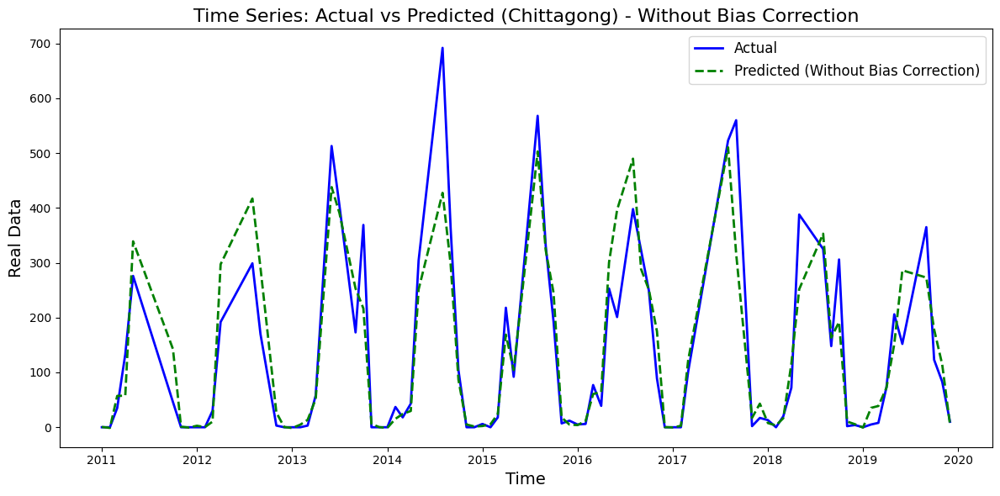

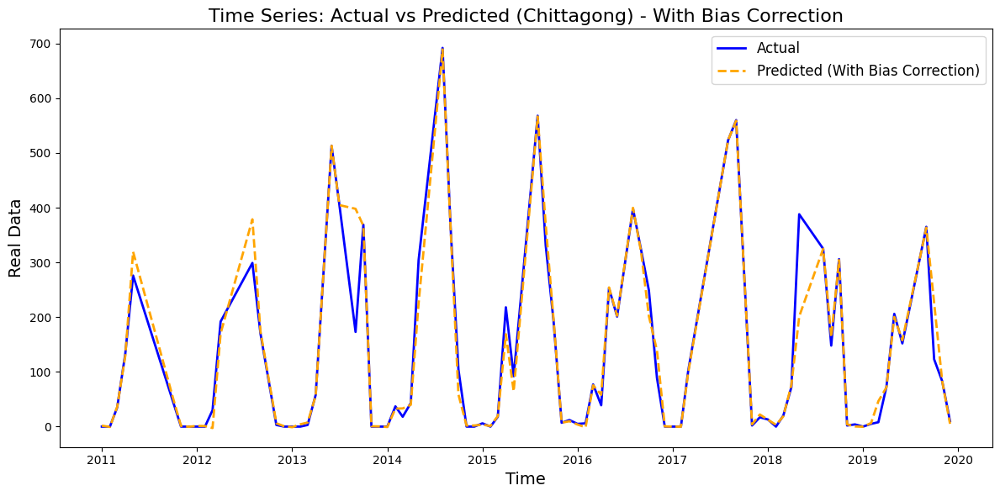

In [ ]:
import matplotlib.pyplot as plt

# Plot without bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_loaded, label="Predicted (Without Bias Correction)", color="green", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Chittagong) - Without Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()

# Plot with bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_corrected, label="Predicted (With Bias Correction)", color="orange", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Chittagong) - With Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()


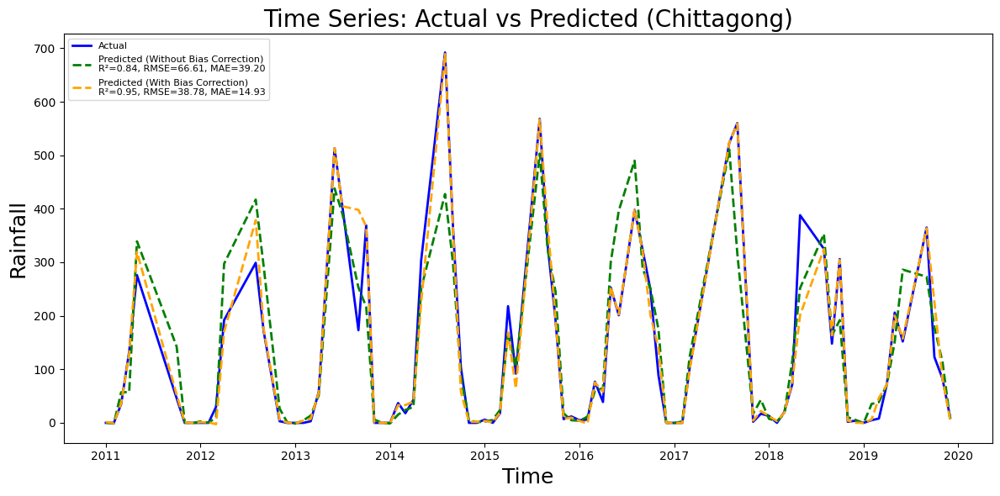

In [ ]:
import matplotlib.pyplot as plt

# Calculate metrics
r2_uncorrected = r2_score(y_test, y_pred_loaded)
rmse_uncorrected = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_uncorrected = mean_absolute_error(y_test, y_pred_loaded)

r2_corrected = r2_score(y_test, y_pred_corrected)
rmse_corrected = np.sqrt(mean_squared_error(y_test, y_pred_corrected))
mae_corrected = mean_absolute_error(y_test, y_pred_corrected)

# Plot both predictions
plt.figure(figsize=(12, 6))

# Actual data
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)

# Predictions without bias correction
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_uncorrected:.2f}, RMSE={rmse_uncorrected:.2f}, MAE={mae_uncorrected:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Predictions with bias correction
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# Plot settings
plt.title("Time Series: Actual vs Predicted (Chittagong)", fontsize=20)
plt.xlabel("Time", fontsize=18)
plt.ylabel("Rainfall", fontsize=18)
plt.legend(loc="upper left", fontsize=8)  # Smaller fonts, legend at top-left
plt.grid(False)
plt.tight_layout()
plt.show()


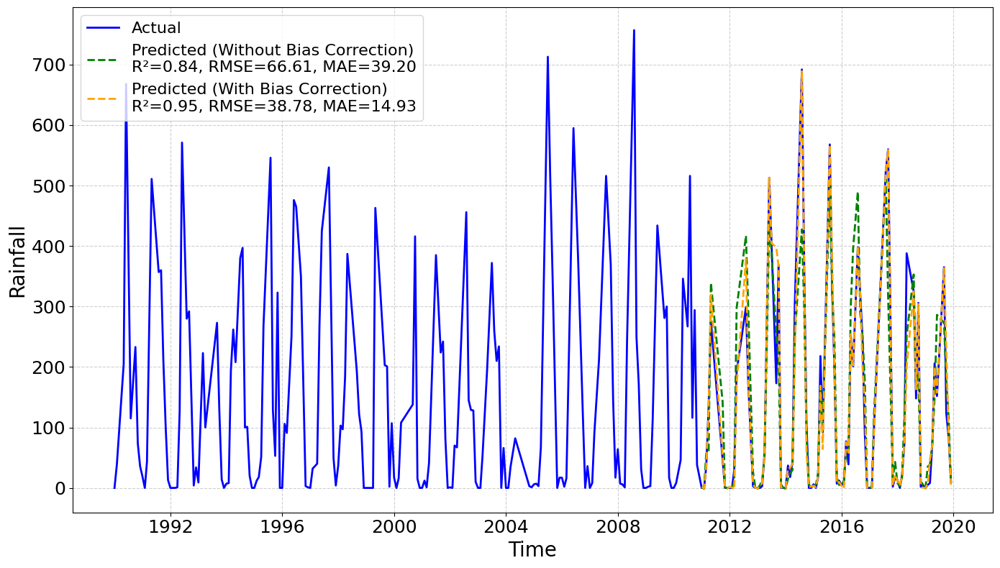

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Combine the actual data into a single series for plotting
full_actual = pd.concat([y_train, y_test])

# Create a NaN-filled array for predictions before 2011
train_nan = np.full(len(y_train), np.nan)

# Combine predictions with NaN for training period
pred_loaded_full = np.concatenate((train_nan, y_pred_loaded))  # Predictions without bias correction
pred_corrected_full = np.concatenate((train_nan, y_pred_corrected))  # Bias-corrected predictions

# Plot the full series
plt.figure(figsize=(14, 8))

# Plot actual data
plt.plot(
    full_actual.index,
    full_actual,
    label="Actual",
    color="blue",
    linewidth=2
)

# Plot predictions without bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_loaded:.2f}, RMSE={rmse_loaded:.2f}, MAE={mae_loaded:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Plot predictions with bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={metrics_corrected['R² (Corrected)']:.2f}, RMSE={metrics_corrected['RMSE (Corrected)']:.2f}, MAE={metrics_corrected['MAE (Corrected)']:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# # Highlight the training and testing periods
# plt.axvspan('1990-01-01', '2010-12-31', color="lightblue", alpha=0.3, label="Training Period (1990–2010)")
# plt.axvspan('2011-01-01', '2020-12-31', color="lightgreen", alpha=0.3, label="Testing Period (2011–2020)")

# Customize the plot

plt.xlabel("Time", fontsize=20)
plt.ylabel("Rainfall", fontsize=20)
plt.legend(loc="upper left", fontsize=16)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/monthly_rainfall_predictions (a).png", dpi=300)
# Show the plot
plt.show()


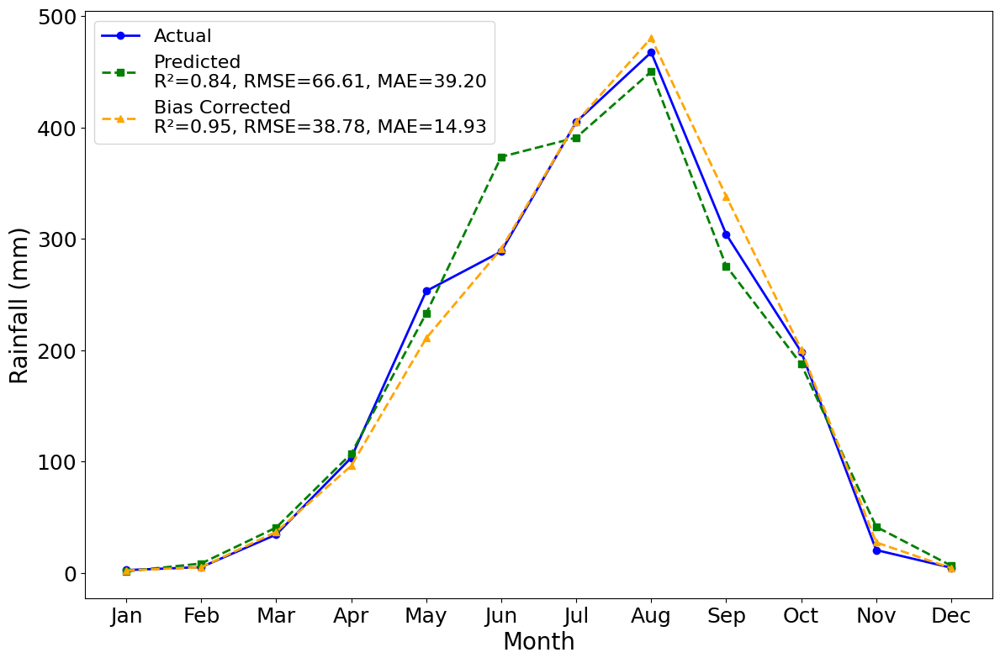

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Combine the actual data into a single series for plotting
full_actual = pd.concat([y_train, y_test])

# Create a NaN-filled array for predictions before 2011
train_nan = np.full(len(y_train), np.nan)

# Combine predictions with NaN for training period
pred_loaded_full = np.concatenate((train_nan, y_pred_loaded))  # Predictions without bias correction
pred_corrected_full = np.concatenate((train_nan, y_pred_corrected))  # Bias-corrected predictions

# Plot the full series
plt.figure(figsize=(14, 8))

# Plot actual data
plt.plot(
    full_actual.index,
    full_actual,
    label="Actual",
    color="blue",
    linewidth=2
)

# Plot predictions without bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_loaded:.2f}, RMSE={rmse_loaded:.2f}, MAE={mae_loaded:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Plot predictions with bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={metrics_corrected['R² (Corrected)']:.2f}, RMSE={metrics_corrected['RMSE (Corrected)']:.2f}, MAE={metrics_corrected['MAE (Corrected)']:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# # Highlight the training and testing periods
# plt.axvspan('1990-01-01', '2010-12-31', color="lightblue", alpha=0.3, label="Training Period (1990–2010)")
# plt.axvspan('2011-01-01', '2020-12-31', color="lightgreen", alpha=0.3, label="Testing Period (2011–2020)")

# Customize the plot

plt.xlabel("Time", fontsize=20)
plt.ylabel("Rainfall", fontsize=20)
plt.legend(loc="upper left", fontsize=16)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/monthly_rainfall_predictions (a).png", dpi=300)
# Show the plot
plt.show()



import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Prepare the data for averaging
# Combine actual, predicted, and bias-corrected values into a single DataFrame
comparison_df = pd.DataFrame({
    "Actual": y_test,
    "Predicted": y_pred_loaded,
    "Bias Corrected": y_pred_corrected
})
comparison_df["Month"] = comparison_df.index.month
comparison_df["Year"] = comparison_df.index.year

# Filter data for 2011–2020
comparison_df_filtered = comparison_df[(comparison_df["Year"] >= 2011) & (comparison_df["Year"] <= 2020)]

# Group by month and calculate the mean for each metric
monthly_avg = comparison_df_filtered.groupby("Month")[["Actual", "Predicted", "Bias Corrected"]].mean()

# Calculate metrics
r2_predicted = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])
rmse_predicted = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"]))
mae_predicted = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])

r2_corrected = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])
rmse_corrected = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"]))
mae_corrected = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])

# Plot the monthly averages
plt.figure(figsize=(12, 8))

# Plot actual values
plt.plot(
    monthly_avg.index,
    monthly_avg["Actual"],
    label="Actual",
    color="blue",
    marker="o",
    linewidth=2
)

# Plot predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Predicted"],
    label=f"Predicted\nR²={r2_predicted:.2f}, RMSE={rmse_predicted:.2f}, MAE={mae_predicted:.2f}",
    color="green",
    marker="s",
    linestyle="--",
    linewidth=2
)

# Plot bias-corrected predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Bias Corrected"],
    label=f"Bias Corrected\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    marker="^",
    linestyle="--",
    linewidth=2
)

# Customize the plot
plt.xlabel("Month", fontsize=20)
plt.ylabel("Rainfall (mm)", fontsize=20)
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"], fontsize=18)
plt.yticks(fontsize=18)
plt.legend(loc="upper left", fontsize=16)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/seasonal_rainfall_predictions (a).png", dpi=300)

# Show the plot
plt.show()


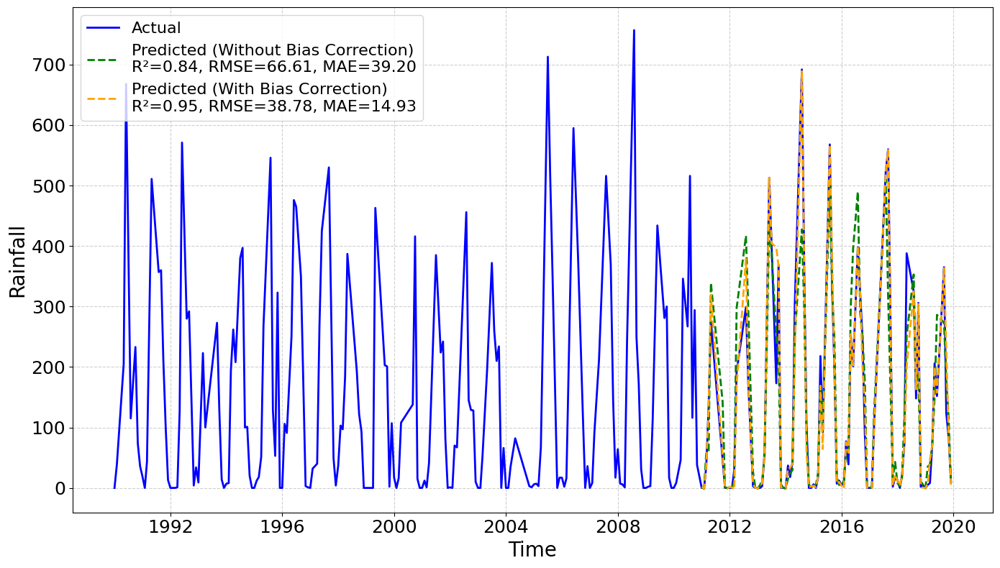

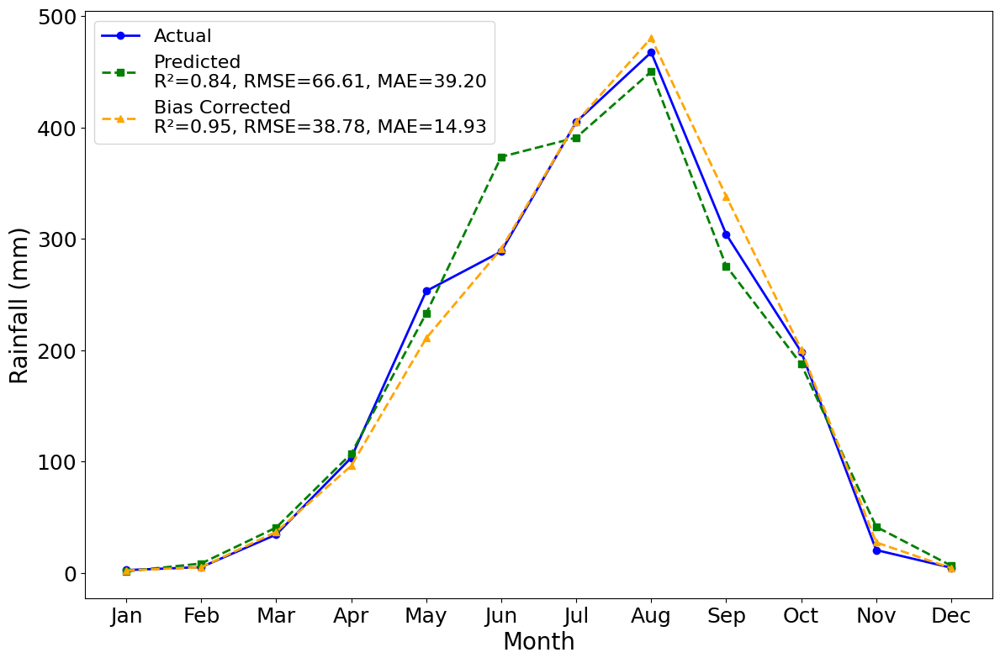

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Combine the actual data into a single series for plotting
full_actual = pd.concat([y_train, y_test])

# Create a NaN-filled array for predictions before 2011
train_nan = np.full(len(y_train), np.nan)

# Combine predictions with NaN for training period
pred_loaded_full = np.concatenate((train_nan, y_pred_loaded))  # Predictions without bias correction
pred_corrected_full = np.concatenate((train_nan, y_pred_corrected))  # Bias-corrected predictions

# Plot the full series
plt.figure(figsize=(14, 8))

# Plot actual data
plt.plot(
    full_actual.index,
    full_actual,
    label="Actual",
    color="blue",
    linewidth=2
)

# Plot predictions without bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_loaded:.2f}, RMSE={rmse_loaded:.2f}, MAE={mae_loaded:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Plot predictions with bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={metrics_corrected['R² (Corrected)']:.2f}, RMSE={metrics_corrected['RMSE (Corrected)']:.2f}, MAE={metrics_corrected['MAE (Corrected)']:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# # Highlight the training and testing periods
# plt.axvspan('1990-01-01', '2010-12-31', color="lightblue", alpha=0.3, label="Training Period (1990–2010)")
# plt.axvspan('2011-01-01', '2020-12-31', color="lightgreen", alpha=0.3, label="Testing Period (2011–2020)")

# Customize the plot

plt.xlabel("Time", fontsize=20)
plt.ylabel("Rainfall", fontsize=20)
plt.legend(loc="upper left", fontsize=16)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/monthly_rainfall_predictions (a).png", dpi=300)
# Show the plot
plt.show()



import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Prepare the data for averaging
# Combine actual, predicted, and bias-corrected values into a single DataFrame
comparison_df = pd.DataFrame({
    "Actual": y_test,
    "Predicted": y_pred_loaded,
    "Bias Corrected": y_pred_corrected
})
comparison_df["Month"] = comparison_df.index.month
comparison_df["Year"] = comparison_df.index.year

# Filter data for 2011–2020
comparison_df_filtered = comparison_df[(comparison_df["Year"] >= 2011) & (comparison_df["Year"] <= 2020)]

# Group by month and calculate the mean for each metric
monthly_avg = comparison_df_filtered.groupby("Month")[["Actual", "Predicted", "Bias Corrected"]].mean()

# Calculate metrics
r2_predicted = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])
rmse_predicted = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"]))
mae_predicted = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])

r2_corrected = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])
rmse_corrected = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"]))
mae_corrected = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])

# Plot the monthly averages
plt.figure(figsize=(12, 8))

# Plot actual values
plt.plot(
    monthly_avg.index,
    monthly_avg["Actual"],
    label="Actual",
    color="blue",
    marker="o",
    linewidth=2
)

# Plot predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Predicted"],
    label=f"Predicted\nR²={r2_predicted:.2f}, RMSE={rmse_predicted:.2f}, MAE={mae_predicted:.2f}",
    color="green",
    marker="s",
    linestyle="--",
    linewidth=2
)

# Plot bias-corrected predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Bias Corrected"],
    label=f"Bias Corrected\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    marker="^",
    linestyle="--",
    linewidth=2
)

# Customize the plot
plt.xlabel("Month", fontsize=20)
plt.ylabel("Rainfall (mm)", fontsize=20)
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"], fontsize=18)
plt.yticks(fontsize=18)
plt.legend(loc="upper left", fontsize=16)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/seasonal_rainfall_predictions (a).png", dpi=300)

# Show the plot
plt.show()


# Rangamati

In [ ]:
df = pd.read_csv(r"/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/Station Data/merged/Rangamati_data.csv")
# Create a datetime column using 'month' and 'year'
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# Set the 'date' column as the index
df.set_index('date', inplace=True)
# Drop the 'month' and 'year' columns
df.drop(columns=['month', 'year'], inplace=True)
# Split into features (X) and target (y)

from sklearn.ensemble import IsolationForest
import pandas as pd

# Initialize the Isolation Forest
iso_forest = IsolationForest(contamination=0.25, random_state=SEED)  # Adjust contamination as needed (proportion of outliers)

# Fit the model and predict anomalies
outlier_labels = iso_forest.fit_predict(df)

# Add the outlier labels to the DataFrame
df['Outlier'] = outlier_labels  # 1 for inliers, -1 for outliers

# Filter out the outliers
cleaned_df = df[df['Outlier'] == 1].drop(columns=['Outlier'])

# Print the results
print(f"Original DataFrame shape: {df.shape}")
print(f"Cleaned DataFrame shape: {cleaned_df.shape}")
df = cleaned_df.copy()
df = df.dropna()
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target
# Split into features (X) and target (y)
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target

# Train-test split based on date index
X_train = X.loc['1990-01-01':'2010-12-31']  # Training features
X_test = X.loc['2011-01-01':'2019-12-31']   # Testing features

y_train = y.loc['1990-01-01':'2010-12-31']  # Training target
y_test = y.loc['2011-01-01':'2019-12-31']   # Testing target

# Print shapes to verify
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")




Original DataFrame shape: (360, 5)
Cleaned DataFrame shape: (270, 4)
X_train shape: (186, 3)
y_train shape: (186,)
X_test shape: (83, 3)
y_test shape: (83,)


In [ ]:
df.describe()

,CHIRPS,ERA5,PERSIANN,Rainfall
count,269.000000,269.000000,269.000000,269.000000
mean,158.791259,111.356171,144.402672,138.334572
std,181.211735,115.738572,150.693746,157.965539
min,3.910053,0.002798,0.000000,0.000000
25%,12.135488,7.100662,9.344080,4.000000
50%,54.155831,52.641176,73.273707,74.000000
75%,290.861965,217.281118,293.842369,252.000000
max,640.208660,375.182927,486.484604,644.000000


In [ ]:
loaded_model.fit(X_train, y_train)
# Use the loaded model to predict
y_pred_loaded = loaded_model.predict(X_test)

# Evaluate the loaded model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse_loaded = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_loaded = mean_absolute_error(y_test, y_pred_loaded)
r2_loaded = r2_score(y_test, y_pred_loaded)

print("\nEvaluation Metrics for the Loaded Model:")
print(f"R²: {r2_loaded:.4f}")
print(f"RMSE: {rmse_loaded:.4f}")
print(f"MAE: {mae_loaded:.4f}")



Evaluation Metrics for the Loaded Model:
R²: 0.8172
RMSE: 67.5569
MAE: 39.2443


## Bias Correction

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
import numpy as np


# Step 1: Calculate residuals
residuals = y_test - y_pred_loaded

# Step 2: Fit the loaded bias model on residuals (train on residuals)
# Split the data to avoid overfitting on the test set
X_train_bias, X_test_bias, residuals_train, residuals_test = train_test_split(
    X_test, residuals, test_size=0.3, random_state=42
)

loaded_bias_model.fit(X_train_bias, residuals_train)

# Step 3: Predict bias (residuals) for the test set
predicted_bias = loaded_bias_model.predict(X_test)

# Step 4: Apply advanced bias correction
y_pred_corrected = y_pred_loaded + predicted_bias

# Step 5: Evaluate corrected predictions
metrics_corrected = {
    "R² (Corrected)": r2_score(y_test, y_pred_corrected),
    "RMSE (Corrected)": np.sqrt(mean_squared_error(y_test, y_pred_corrected)),
    "MAE (Corrected)": mean_absolute_error(y_test, y_pred_corrected),
}

# Display corrected metrics
print("\nEvaluation Metrics with Robust Bias Correction:")
for metric, value in metrics_corrected.items():
    print(f"{metric}: {value:.4f}")

# Optional: Compare pre- and post-correction metrics
metrics_original = {
    "R² (Original)": r2_score(y_test, y_pred_loaded),
    "RMSE (Original)": np.sqrt(mean_squared_error(y_test, y_pred_loaded)),
    "MAE (Original)": mean_absolute_error(y_test, y_pred_loaded),
}

print("\nComparison of Metrics:")
for metric in metrics_original:
    print(f"{metric}: {metrics_original[metric]:.4f} --> {metrics_corrected[metric.replace('Original', 'Corrected')]:.4f}")



Evaluation Metrics with Robust Bias Correction:
R² (Corrected): 0.9051
RMSE (Corrected): 48.6633
MAE (Corrected): 17.8652

Comparison of Metrics:
R² (Original): 0.8172 --> 0.9051
RMSE (Original): 67.5569 --> 48.6633
MAE (Original): 39.2443 --> 17.8652


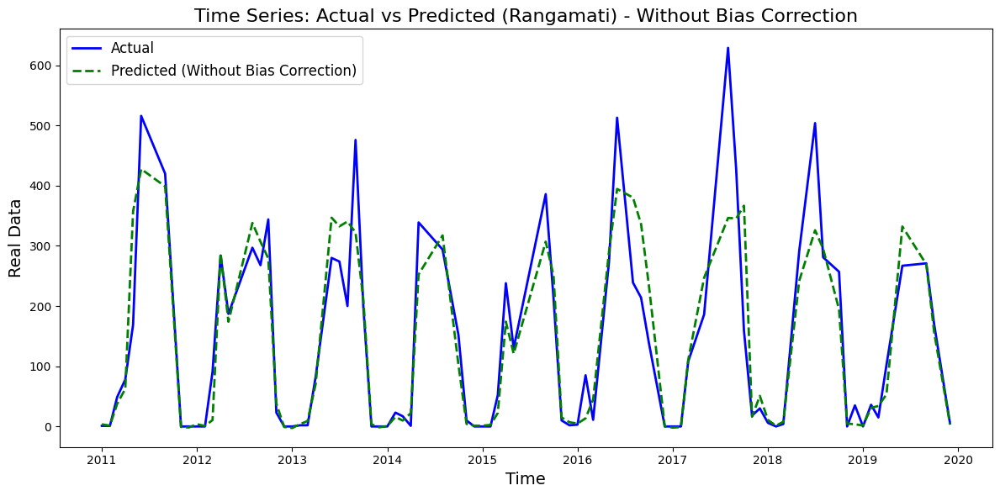

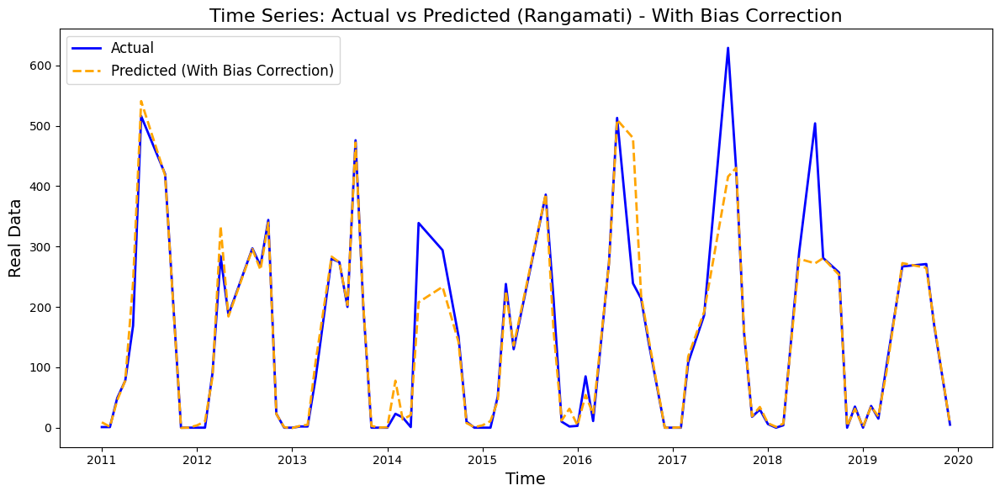

In [ ]:
import matplotlib.pyplot as plt

# Plot without bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_loaded, label="Predicted (Without Bias Correction)", color="green", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Rangamati) - Without Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()

# Plot with bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_corrected, label="Predicted (With Bias Correction)", color="orange", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Rangamati) - With Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()


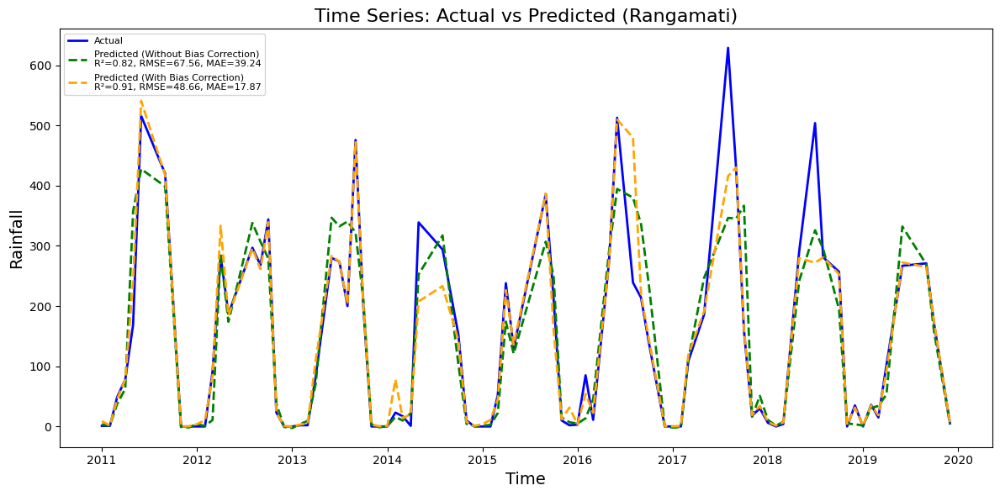

In [ ]:
import matplotlib.pyplot as plt

# Calculate metrics
r2_uncorrected = r2_score(y_test, y_pred_loaded)
rmse_uncorrected = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_uncorrected = mean_absolute_error(y_test, y_pred_loaded)

r2_corrected = r2_score(y_test, y_pred_corrected)
rmse_corrected = np.sqrt(mean_squared_error(y_test, y_pred_corrected))
mae_corrected = mean_absolute_error(y_test, y_pred_corrected)

# Plot both predictions
plt.figure(figsize=(12, 6))

# Actual data
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)

# Predictions without bias correction
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_uncorrected:.2f}, RMSE={rmse_uncorrected:.2f}, MAE={mae_uncorrected:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Predictions with bias correction
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# Plot settings
plt.title("Time Series: Actual vs Predicted (Rangamati)", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Rainfall", fontsize=14)
plt.legend(loc="upper left", fontsize=8)  # Smaller fonts, legend at top-left
plt.grid(False)
plt.tight_layout()
plt.show()


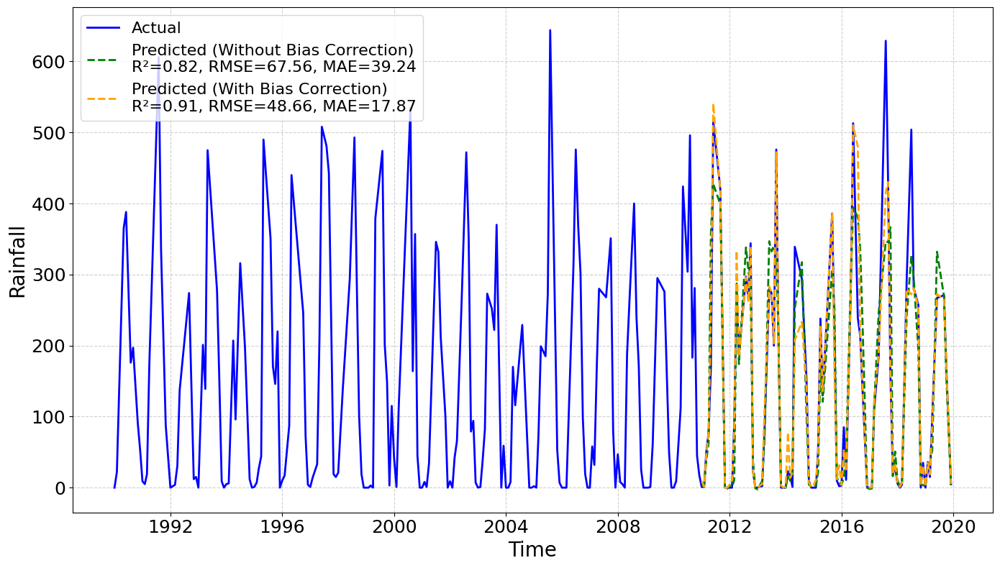

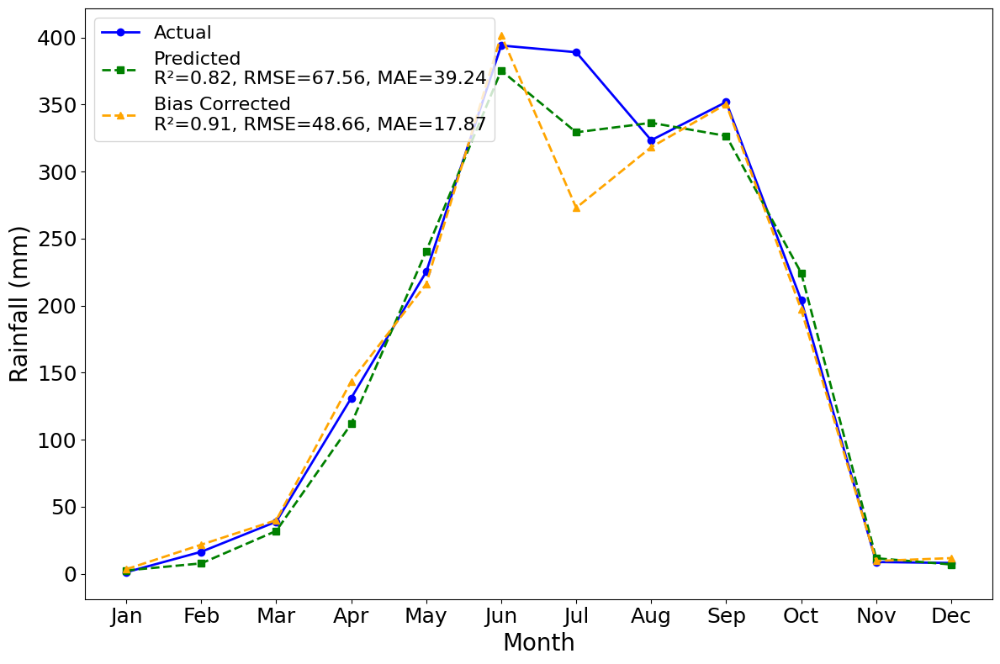

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Combine the actual data into a single series for plotting
full_actual = pd.concat([y_train, y_test])

# Create a NaN-filled array for predictions before 2011
train_nan = np.full(len(y_train), np.nan)

# Combine predictions with NaN for training period
pred_loaded_full = np.concatenate((train_nan, y_pred_loaded))  # Predictions without bias correction
pred_corrected_full = np.concatenate((train_nan, y_pred_corrected))  # Bias-corrected predictions

# Plot the full series
plt.figure(figsize=(14, 8))

# Plot actual data
plt.plot(
    full_actual.index,
    full_actual,
    label="Actual",
    color="blue",
    linewidth=2
)

# Plot predictions without bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_loaded:.2f}, RMSE={rmse_loaded:.2f}, MAE={mae_loaded:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Plot predictions with bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={metrics_corrected['R² (Corrected)']:.2f}, RMSE={metrics_corrected['RMSE (Corrected)']:.2f}, MAE={metrics_corrected['MAE (Corrected)']:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# # Highlight the training and testing periods
# plt.axvspan('1990-01-01', '2010-12-31', color="lightblue", alpha=0.3, label="Training Period (1990–2010)")
# plt.axvspan('2011-01-01', '2020-12-31', color="lightgreen", alpha=0.3, label="Testing Period (2011–2020)")

# Customize the plot

plt.xlabel("Time", fontsize=20)
plt.ylabel("Rainfall", fontsize=20)
plt.legend(loc="upper left", fontsize=16)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/monthly_rainfall_predictions (b).png", dpi=300)
# Show the plot
plt.show()



import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Prepare the data for averaging
# Combine actual, predicted, and bias-corrected values into a single DataFrame
comparison_df = pd.DataFrame({
    "Actual": y_test,
    "Predicted": y_pred_loaded,
    "Bias Corrected": y_pred_corrected
})
comparison_df["Month"] = comparison_df.index.month
comparison_df["Year"] = comparison_df.index.year

# Filter data for 2011–2020
comparison_df_filtered = comparison_df[(comparison_df["Year"] >= 2011) & (comparison_df["Year"] <= 2020)]

# Group by month and calculate the mean for each metric
monthly_avg = comparison_df_filtered.groupby("Month")[["Actual", "Predicted", "Bias Corrected"]].mean()

# Calculate metrics
r2_predicted = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])
rmse_predicted = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"]))
mae_predicted = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])

r2_corrected = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])
rmse_corrected = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"]))
mae_corrected = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])

# Plot the monthly averages
plt.figure(figsize=(12, 8))

# Plot actual values
plt.plot(
    monthly_avg.index,
    monthly_avg["Actual"],
    label="Actual",
    color="blue",
    marker="o",
    linewidth=2
)

# Plot predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Predicted"],
    label=f"Predicted\nR²={r2_predicted:.2f}, RMSE={rmse_predicted:.2f}, MAE={mae_predicted:.2f}",
    color="green",
    marker="s",
    linestyle="--",
    linewidth=2
)

# Plot bias-corrected predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Bias Corrected"],
    label=f"Bias Corrected\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    marker="^",
    linestyle="--",
    linewidth=2
)

# Customize the plot
plt.xlabel("Month", fontsize=20)
plt.ylabel("Rainfall (mm)", fontsize=20)
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"], fontsize=18)
plt.yticks(fontsize=18)
plt.legend(loc="upper left", fontsize=16)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/seasonal_rainfall_predictions (b).png", dpi=300)

# Show the plot
plt.show()


# Dhaka

In [ ]:
df = pd.read_csv(r"/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/Station Data/merged/Dhaka_data.csv")
# Create a datetime column using 'month' and 'year'
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# Set the 'date' column as the index
df.set_index('date', inplace=True)
# Drop the 'month' and 'year' columns
df.drop(columns=['month', 'year'], inplace=True)
# Split into features (X) and target (y)

from sklearn.ensemble import IsolationForest
import pandas as pd

# Initialize the Isolation Forest
iso_forest = IsolationForest(contamination=0.25, random_state=SEED)  # Adjust contamination as needed (proportion of outliers)

# Fit the model and predict anomalies
outlier_labels = iso_forest.fit_predict(df)

# Add the outlier labels to the DataFrame
df['Outlier'] = outlier_labels  # 1 for inliers, -1 for outliers

# Filter out the outliers
cleaned_df = df[df['Outlier'] == 1].drop(columns=['Outlier'])

# Print the results
print(f"Original DataFrame shape: {df.shape}")
print(f"Cleaned DataFrame shape: {cleaned_df.shape}")
df = cleaned_df.copy()
df= df.dropna()
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target
# Split into features (X) and target (y)
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target

# Train-test split based on date index
X_train = X.loc['1990-01-01':'2010-12-31']  # Training features
X_test = X.loc['2011-01-01':'2019-12-31']   # Testing features

y_train = y.loc['1990-01-01':'2010-12-31']  # Training target
y_test = y.loc['2011-01-01':'2019-12-31']   # Testing target

# Print shapes to verify
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")




Original DataFrame shape: (360, 5)
Cleaned DataFrame shape: (270, 4)
X_train shape: (189, 3)
y_train shape: (189,)
X_test shape: (80, 3)
y_test shape: (80,)


In [ ]:
df.describe()

,CHIRPS,ERA5,PERSIANN,Rainfall
count,269.000000,269.000000,269.000000,269.000000
mean,119.410570,117.777142,129.773270,219.676580
std,120.167208,119.189323,143.514204,333.905211
min,2.759332,0.000000,0.000000,0.000000
25%,8.098544,6.437911,8.803521,0.000000
50%,73.098626,73.014311,64.898035,36.000000
75%,237.800695,223.927736,244.774770,320.000000
max,407.173275,465.869904,514.548339,1431.000000


In [ ]:
loaded_model.fit(X_train, y_train)
# Use the loaded model to predict
y_pred_loaded = loaded_model.predict(X_test)

# Evaluate the loaded model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse_loaded = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_loaded = mean_absolute_error(y_test, y_pred_loaded)
r2_loaded = r2_score(y_test, y_pred_loaded)

print("\nEvaluation Metrics for the Loaded Model:")
print(f"R²: {r2_loaded:.4f}")
print(f"RMSE: {rmse_loaded:.4f}")
print(f"MAE: {mae_loaded:.4f}")



Evaluation Metrics for the Loaded Model:
R²: 0.7825
RMSE: 169.9020
MAE: 107.2657


## Bias Correction

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
import numpy as np


# Step 1: Calculate residuals
residuals = y_test - y_pred_loaded

# Step 2: Fit the loaded bias model on residuals (train on residuals)
# Split the data to avoid overfitting on the test set
X_train_bias, X_test_bias, residuals_train, residuals_test = train_test_split(
    X_test, residuals, test_size=0.3, random_state=42
)

loaded_bias_model.fit(X_train_bias, residuals_train)

# Step 3: Predict bias (residuals) for the test set
predicted_bias = loaded_bias_model.predict(X_test)

# Step 4: Apply advanced bias correction
y_pred_corrected = y_pred_loaded + predicted_bias

# Step 5: Evaluate corrected predictions
metrics_corrected = {
    "R² (Corrected)": r2_score(y_test, y_pred_corrected),
    "RMSE (Corrected)": np.sqrt(mean_squared_error(y_test, y_pred_corrected)),
    "MAE (Corrected)": mean_absolute_error(y_test, y_pred_corrected),
}

# Display corrected metrics
print("\nEvaluation Metrics with Robust Bias Correction:")
for metric, value in metrics_corrected.items():
    print(f"{metric}: {value:.4f}")

# Optional: Compare pre- and post-correction metrics
metrics_original = {
    "R² (Original)": r2_score(y_test, y_pred_loaded),
    "RMSE (Original)": np.sqrt(mean_squared_error(y_test, y_pred_loaded)),
    "MAE (Original)": mean_absolute_error(y_test, y_pred_loaded),
}

print("\nComparison of Metrics:")
for metric in metrics_original:
    print(f"{metric}: {metrics_original[metric]:.4f} --> {metrics_corrected[metric.replace('Original', 'Corrected')]:.4f}")



Evaluation Metrics with Robust Bias Correction:
R² (Corrected): 0.9302
RMSE (Corrected): 96.2799
MAE (Corrected): 31.8889

Comparison of Metrics:
R² (Original): 0.7825 --> 0.9302
RMSE (Original): 169.9020 --> 96.2799
MAE (Original): 107.2657 --> 31.8889


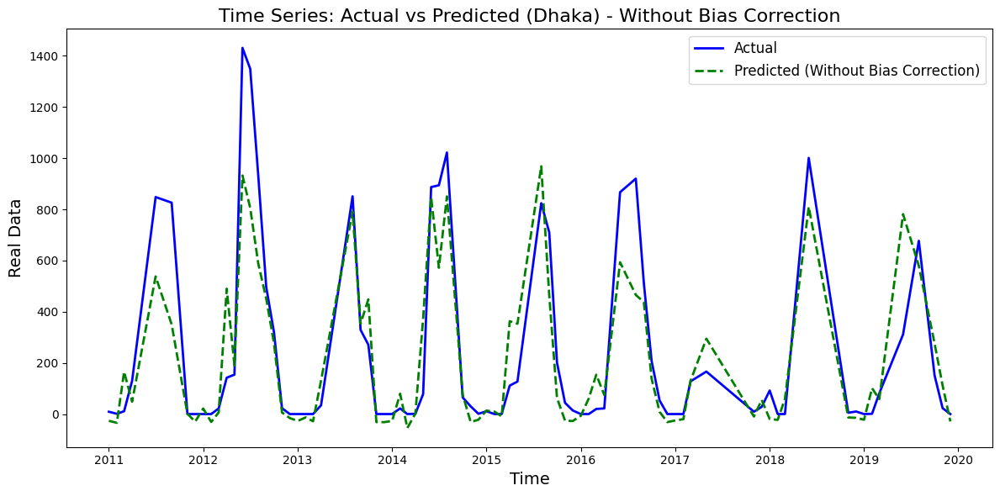

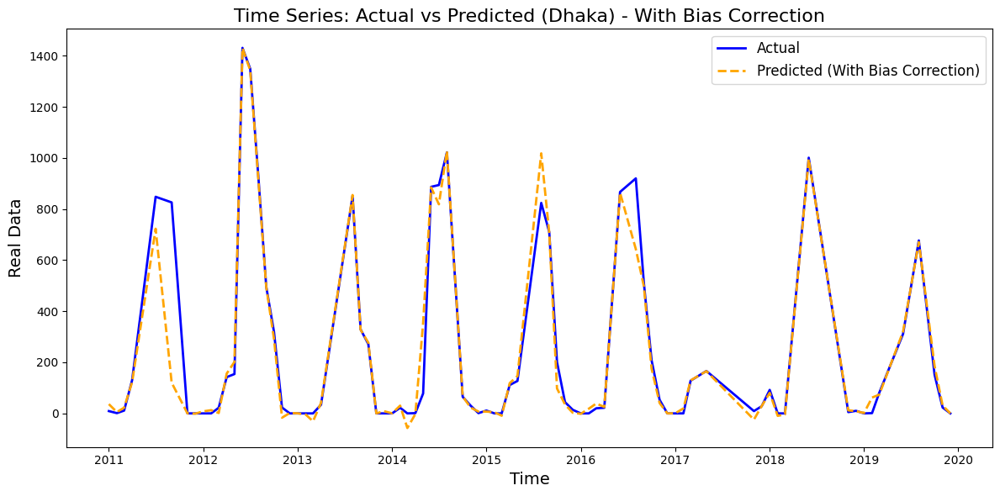

In [ ]:
import matplotlib.pyplot as plt

# Plot without bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_loaded, label="Predicted (Without Bias Correction)", color="green", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Dhaka) - Without Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()

# Plot with bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_corrected, label="Predicted (With Bias Correction)", color="orange", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Dhaka) - With Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()


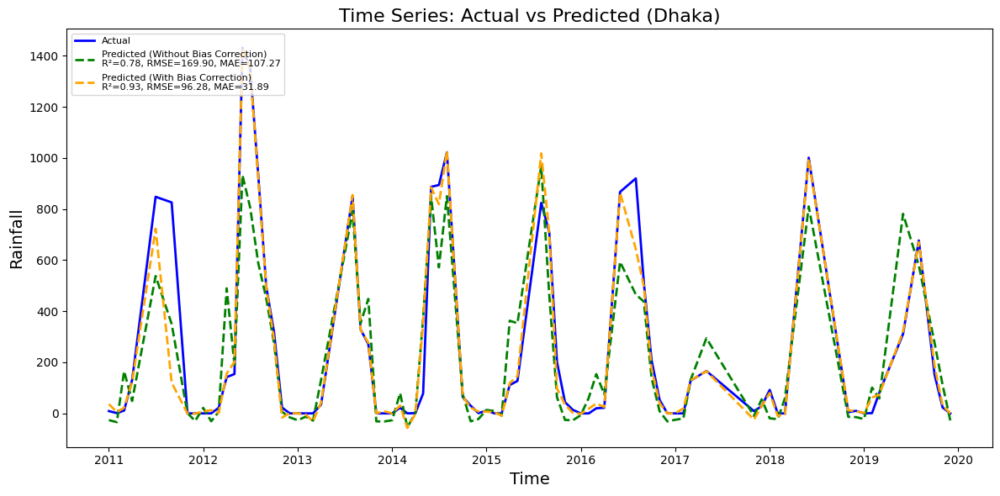

In [ ]:
import matplotlib.pyplot as plt

# Calculate metrics
r2_uncorrected = r2_score(y_test, y_pred_loaded)
rmse_uncorrected = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_uncorrected = mean_absolute_error(y_test, y_pred_loaded)

r2_corrected = r2_score(y_test, y_pred_corrected)
rmse_corrected = np.sqrt(mean_squared_error(y_test, y_pred_corrected))
mae_corrected = mean_absolute_error(y_test, y_pred_corrected)

# Plot both predictions
plt.figure(figsize=(12, 6))

# Actual data
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)

# Predictions without bias correction
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_uncorrected:.2f}, RMSE={rmse_uncorrected:.2f}, MAE={mae_uncorrected:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Predictions with bias correction
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# Plot settings
plt.title("Time Series: Actual vs Predicted (Dhaka)", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Rainfall", fontsize=14)
plt.legend(loc="upper left", fontsize=8)  # Smaller fonts, legend at top-left
plt.grid(False)
plt.tight_layout()
plt.show()


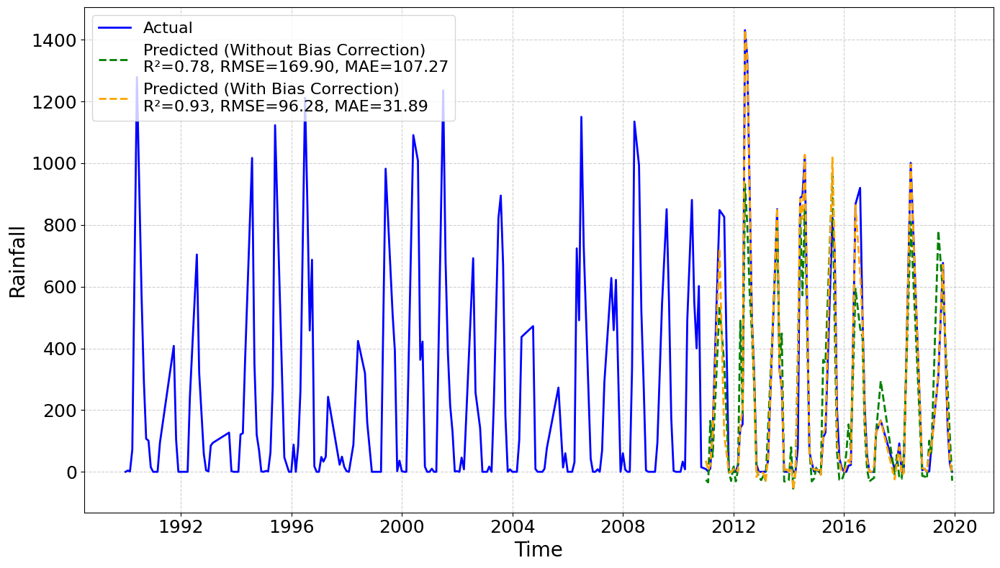

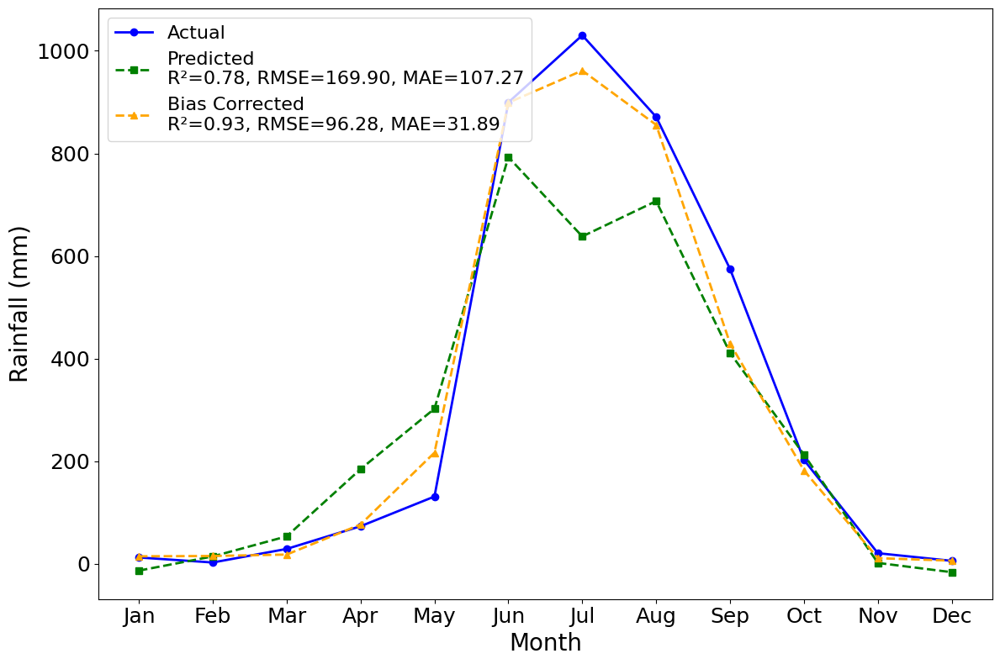

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Combine the actual data into a single series for plotting
full_actual = pd.concat([y_train, y_test])

# Create a NaN-filled array for predictions before 2011
train_nan = np.full(len(y_train), np.nan)

# Combine predictions with NaN for training period
pred_loaded_full = np.concatenate((train_nan, y_pred_loaded))  # Predictions without bias correction
pred_corrected_full = np.concatenate((train_nan, y_pred_corrected))  # Bias-corrected predictions

# Plot the full series
plt.figure(figsize=(14, 8))

# Plot actual data
plt.plot(
    full_actual.index,
    full_actual,
    label="Actual",
    color="blue",
    linewidth=2
)

# Plot predictions without bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_loaded:.2f}, RMSE={rmse_loaded:.2f}, MAE={mae_loaded:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Plot predictions with bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={metrics_corrected['R² (Corrected)']:.2f}, RMSE={metrics_corrected['RMSE (Corrected)']:.2f}, MAE={metrics_corrected['MAE (Corrected)']:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# # Highlight the training and testing periods
# plt.axvspan('1990-01-01', '2010-12-31', color="lightblue", alpha=0.3, label="Training Period (1990–2010)")
# plt.axvspan('2011-01-01', '2020-12-31', color="lightgreen", alpha=0.3, label="Testing Period (2011–2020)")

# Customize the plot

plt.xlabel("Time", fontsize=20)
plt.ylabel("Rainfall", fontsize=20)
plt.legend(loc="upper left", fontsize=16)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/monthly_rainfall_predictions (c).png", dpi=300)
# Show the plot
plt.show()



import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Prepare the data for averaging
# Combine actual, predicted, and bias-corrected values into a single DataFrame
comparison_df = pd.DataFrame({
    "Actual": y_test,
    "Predicted": y_pred_loaded,
    "Bias Corrected": y_pred_corrected
})
comparison_df["Month"] = comparison_df.index.month
comparison_df["Year"] = comparison_df.index.year

# Filter data for 2011–2020
comparison_df_filtered = comparison_df[(comparison_df["Year"] >= 2011) & (comparison_df["Year"] <= 2020)]

# Group by month and calculate the mean for each metric
monthly_avg = comparison_df_filtered.groupby("Month")[["Actual", "Predicted", "Bias Corrected"]].mean()

# Calculate metrics
r2_predicted = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])
rmse_predicted = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"]))
mae_predicted = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])

r2_corrected = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])
rmse_corrected = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"]))
mae_corrected = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])

# Plot the monthly averages
plt.figure(figsize=(12, 8))

# Plot actual values
plt.plot(
    monthly_avg.index,
    monthly_avg["Actual"],
    label="Actual",
    color="blue",
    marker="o",
    linewidth=2
)

# Plot predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Predicted"],
    label=f"Predicted\nR²={r2_predicted:.2f}, RMSE={rmse_predicted:.2f}, MAE={mae_predicted:.2f}",
    color="green",
    marker="s",
    linestyle="--",
    linewidth=2
)

# Plot bias-corrected predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Bias Corrected"],
    label=f"Bias Corrected\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    marker="^",
    linestyle="--",
    linewidth=2
)

# Customize the plot
plt.xlabel("Month", fontsize=20)
plt.ylabel("Rainfall (mm)", fontsize=20)
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"], fontsize=18)
plt.yticks(fontsize=18)
plt.legend(loc="upper left", fontsize=16)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/seasonal_rainfall_predictions (c).png", dpi=300)

# Show the plot
plt.show()


# Khepupara

In [ ]:
df = pd.read_csv(r"/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/Station Data/merged/Khetpura_data.csv")
# Create a datetime column using 'month' and 'year'
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# Set the 'date' column as the index
df.set_index('date', inplace=True)
# Drop the 'month' and 'year' columns
df.drop(columns=['month', 'year'], inplace=True)
# Split into features (X) and target (y)

from sklearn.ensemble import IsolationForest
import pandas as pd

# Initialize the Isolation Forest
iso_forest = IsolationForest(contamination=0.25, random_state=SEED)  # Adjust contamination as needed (proportion of outliers)

# Fit the model and predict anomalies
outlier_labels = iso_forest.fit_predict(df)

# Add the outlier labels to the DataFrame
df['Outlier'] = outlier_labels  # 1 for inliers, -1 for outliers

# Filter out the outliers
cleaned_df = df[df['Outlier'] == 1].drop(columns=['Outlier'])

# Print the results
print(f"Original DataFrame shape: {df.shape}")
print(f"Cleaned DataFrame shape: {cleaned_df.shape}")
df = cleaned_df.copy()
df= df.dropna()
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target
# Split into features (X) and target (y)
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target

# Train-test split based on date index
X_train = X.loc['1990-01-01':'2010-12-31']  # Training features
X_test = X.loc['2011-01-01':'2019-12-31']   # Testing features

y_train = y.loc['1990-01-01':'2010-12-31']  # Training target
y_test = y.loc['2011-01-01':'2019-12-31']   # Testing target

# Print shapes to verify
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")




Original DataFrame shape: (360, 5)
Cleaned DataFrame shape: (270, 4)
X_train shape: (191, 3)
y_train shape: (191,)
X_test shape: (79, 3)
y_test shape: (79,)


In [ ]:
df.describe()

,CHIRPS,ERA5,PERSIANN,Rainfall
count,270.000000,270.000000,270.000000,270.000000
mean,137.808769,114.353868,157.333001,154.048148
std,161.753335,124.511559,179.784888,186.579427
min,2.566969,0.000000,0.000000,0.000000
25%,10.403880,8.228369,8.800274,2.000000
50%,43.534776,46.077644,50.399492,49.000000
75%,265.591375,215.072934,306.186715,277.500000
max,588.996248,403.273523,614.412760,672.000000


In [ ]:
loaded_model.fit(X_train, y_train)
# Use the loaded model to predict
y_pred_loaded = loaded_model.predict(X_test)

# Evaluate the loaded model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse_loaded = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_loaded = mean_absolute_error(y_test, y_pred_loaded)
r2_loaded = r2_score(y_test, y_pred_loaded)

print("\nEvaluation Metrics for the Loaded Model:")
print(f"R²: {r2_loaded:.4f}")
print(f"RMSE: {rmse_loaded:.4f}")
print(f"MAE: {mae_loaded:.4f}")



Evaluation Metrics for the Loaded Model:
R²: 0.8910
RMSE: 61.6269
MAE: 35.1231


## Bias Correction

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
import numpy as np



# Step 1: Calculate residuals
residuals = y_test - y_pred_loaded

# Step 2: Fit the loaded bias model on residuals (train on residuals)
# Split the data to avoid overfitting on the test set
X_train_bias, X_test_bias, residuals_train, residuals_test = train_test_split(
    X_test, residuals, test_size=0.3, random_state=42
)

loaded_bias_model.fit(X_train_bias, residuals_train)

# Step 3: Predict bias (residuals) for the test set
predicted_bias = loaded_bias_model.predict(X_test)

# Step 4: Apply advanced bias correction
y_pred_corrected = y_pred_loaded + predicted_bias

# Step 5: Evaluate corrected predictions
metrics_corrected = {
    "R² (Corrected)": r2_score(y_test, y_pred_corrected),
    "RMSE (Corrected)": np.sqrt(mean_squared_error(y_test, y_pred_corrected)),
    "MAE (Corrected)": mean_absolute_error(y_test, y_pred_corrected),
}

# Display corrected metrics
print("\nEvaluation Metrics with Robust Bias Correction:")
for metric, value in metrics_corrected.items():
    print(f"{metric}: {value:.4f}")

# Optional: Compare pre- and post-correction metrics
metrics_original = {
    "R² (Original)": r2_score(y_test, y_pred_loaded),
    "RMSE (Original)": np.sqrt(mean_squared_error(y_test, y_pred_loaded)),
    "MAE (Original)": mean_absolute_error(y_test, y_pred_loaded),
}

print("\nComparison of Metrics:")
for metric in metrics_original:
    print(f"{metric}: {metrics_original[metric]:.4f} --> {metrics_corrected[metric.replace('Original', 'Corrected')]:.4f}")



Evaluation Metrics with Robust Bias Correction:
R² (Corrected): 0.9485
RMSE (Corrected): 42.3595
MAE (Corrected): 15.1096

Comparison of Metrics:
R² (Original): 0.8910 --> 0.9485
RMSE (Original): 61.6269 --> 42.3595
MAE (Original): 35.1231 --> 15.1096


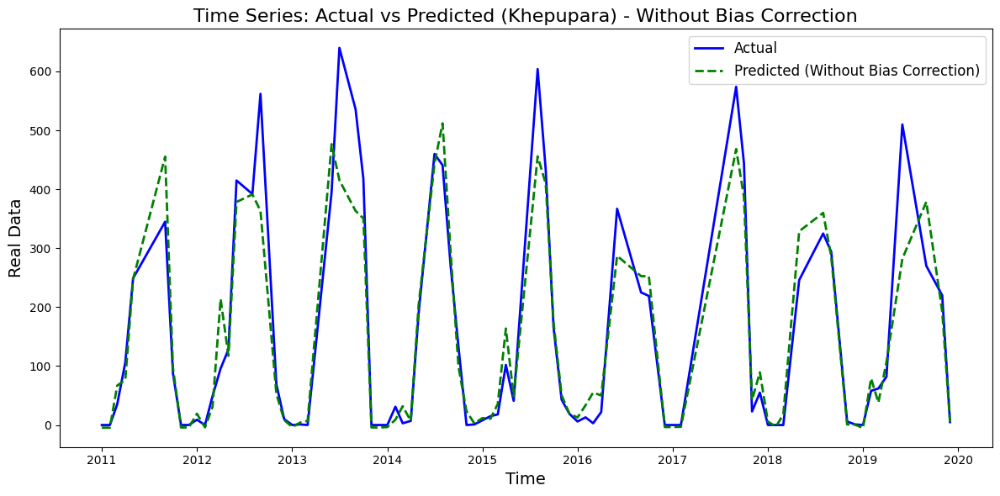

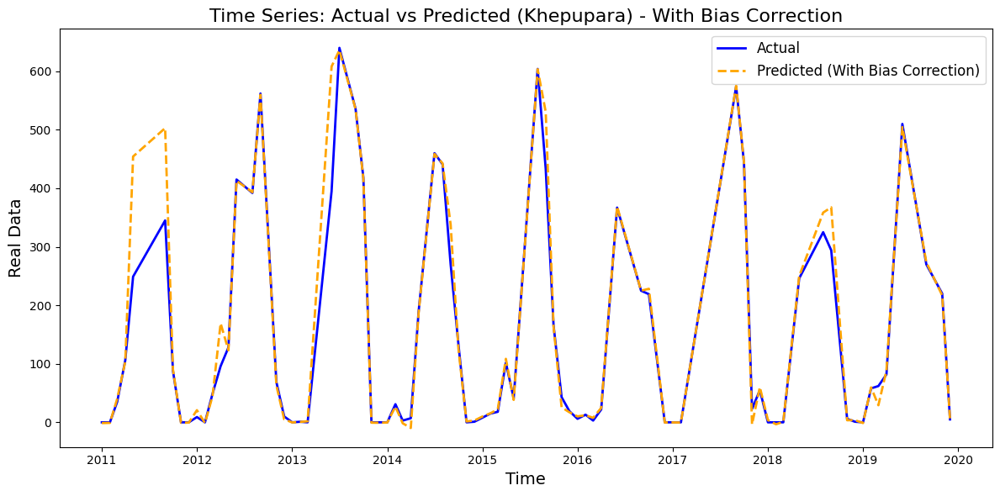

In [ ]:
import matplotlib.pyplot as plt

# Plot without bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_loaded, label="Predicted (Without Bias Correction)", color="green", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Khepupara) - Without Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()

# Plot with bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_corrected, label="Predicted (With Bias Correction)", color="orange", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Khepupara) - With Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()


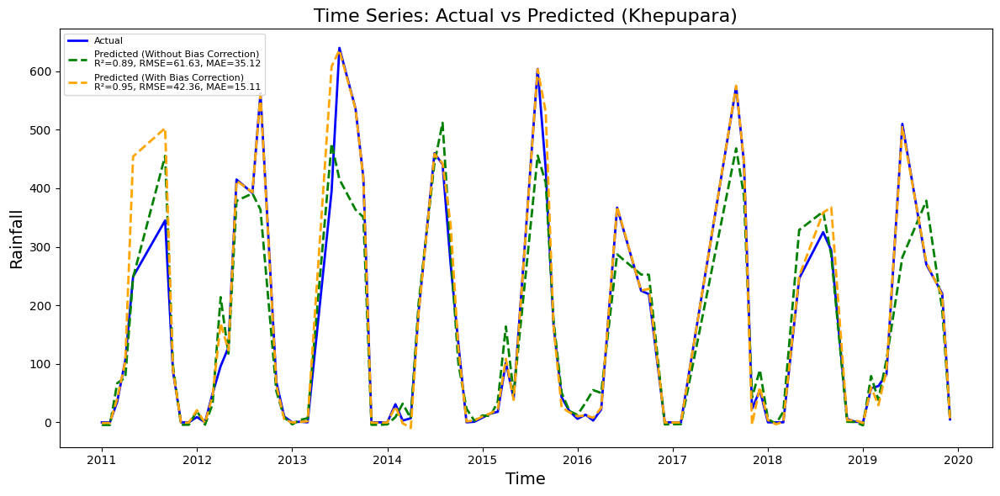

In [ ]:
import matplotlib.pyplot as plt

# Calculate metrics
r2_uncorrected = r2_score(y_test, y_pred_loaded)
rmse_uncorrected = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_uncorrected = mean_absolute_error(y_test, y_pred_loaded)

r2_corrected = r2_score(y_test, y_pred_corrected)
rmse_corrected = np.sqrt(mean_squared_error(y_test, y_pred_corrected))
mae_corrected = mean_absolute_error(y_test, y_pred_corrected)

# Plot both predictions
plt.figure(figsize=(12, 6))

# Actual data
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)

# Predictions without bias correction
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_uncorrected:.2f}, RMSE={rmse_uncorrected:.2f}, MAE={mae_uncorrected:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Predictions with bias correction
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# Plot settings
plt.title("Time Series: Actual vs Predicted (Khepupara)", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Rainfall", fontsize=14)
plt.legend(loc="upper left", fontsize=8)  # Smaller fonts, legend at top-left
plt.grid(False)
plt.tight_layout()
plt.show()


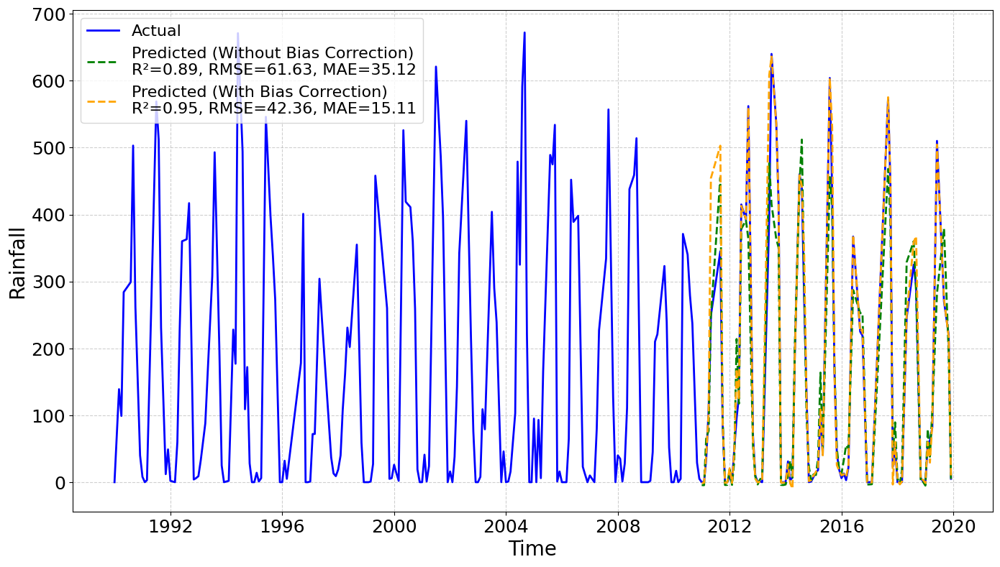

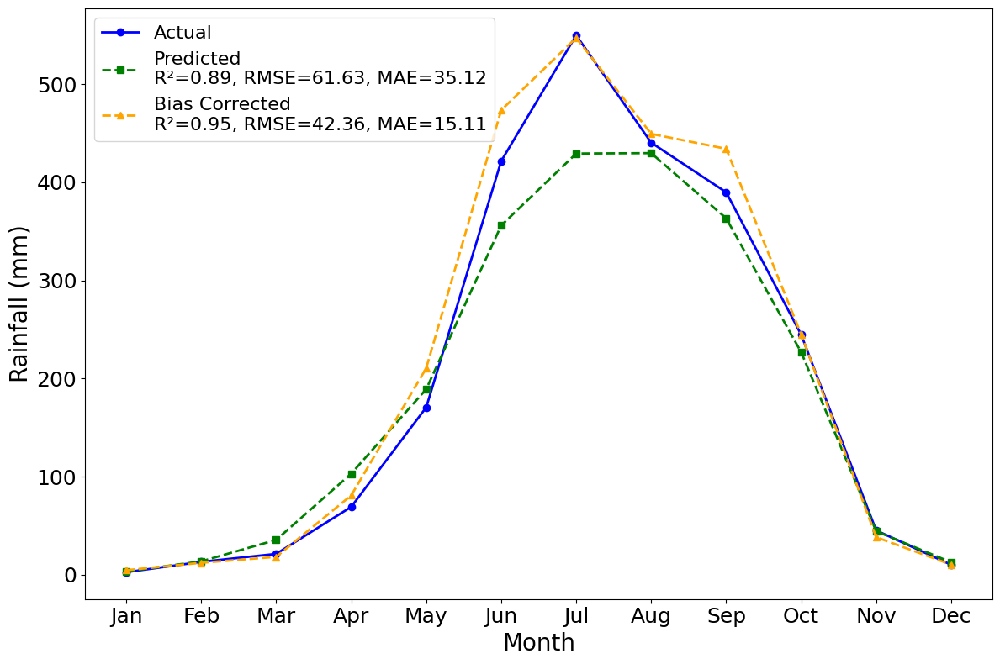

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Combine the actual data into a single series for plotting
full_actual = pd.concat([y_train, y_test])

# Create a NaN-filled array for predictions before 2011
train_nan = np.full(len(y_train), np.nan)

# Combine predictions with NaN for training period
pred_loaded_full = np.concatenate((train_nan, y_pred_loaded))  # Predictions without bias correction
pred_corrected_full = np.concatenate((train_nan, y_pred_corrected))  # Bias-corrected predictions

# Plot the full series
plt.figure(figsize=(14, 8))

# Plot actual data
plt.plot(
    full_actual.index,
    full_actual,
    label="Actual",
    color="blue",
    linewidth=2
)

# Plot predictions without bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_loaded:.2f}, RMSE={rmse_loaded:.2f}, MAE={mae_loaded:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Plot predictions with bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={metrics_corrected['R² (Corrected)']:.2f}, RMSE={metrics_corrected['RMSE (Corrected)']:.2f}, MAE={metrics_corrected['MAE (Corrected)']:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# # Highlight the training and testing periods
# plt.axvspan('1990-01-01', '2010-12-31', color="lightblue", alpha=0.3, label="Training Period (1990–2010)")
# plt.axvspan('2011-01-01', '2020-12-31', color="lightgreen", alpha=0.3, label="Testing Period (2011–2020)")

# Customize the plot

plt.xlabel("Time", fontsize=20)
plt.ylabel("Rainfall", fontsize=20)
plt.legend(loc="upper left", fontsize=16)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/monthly_rainfall_predictions (d).png", dpi=300)
# Show the plot
plt.show()



import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Prepare the data for averaging
# Combine actual, predicted, and bias-corrected values into a single DataFrame
comparison_df = pd.DataFrame({
    "Actual": y_test,
    "Predicted": y_pred_loaded,
    "Bias Corrected": y_pred_corrected
})
comparison_df["Month"] = comparison_df.index.month
comparison_df["Year"] = comparison_df.index.year

# Filter data for 2011–2020
comparison_df_filtered = comparison_df[(comparison_df["Year"] >= 2011) & (comparison_df["Year"] <= 2020)]

# Group by month and calculate the mean for each metric
monthly_avg = comparison_df_filtered.groupby("Month")[["Actual", "Predicted", "Bias Corrected"]].mean()

# Calculate metrics
r2_predicted = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])
rmse_predicted = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"]))
mae_predicted = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])

r2_corrected = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])
rmse_corrected = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"]))
mae_corrected = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])

# Plot the monthly averages
plt.figure(figsize=(12, 8))

# Plot actual values
plt.plot(
    monthly_avg.index,
    monthly_avg["Actual"],
    label="Actual",
    color="blue",
    marker="o",
    linewidth=2
)

# Plot predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Predicted"],
    label=f"Predicted\nR²={r2_predicted:.2f}, RMSE={rmse_predicted:.2f}, MAE={mae_predicted:.2f}",
    color="green",
    marker="s",
    linestyle="--",
    linewidth=2
)

# Plot bias-corrected predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Bias Corrected"],
    label=f"Bias Corrected\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    marker="^",
    linestyle="--",
    linewidth=2
)

# Customize the plot
plt.xlabel("Month", fontsize=20)
plt.ylabel("Rainfall (mm)", fontsize=20)
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"], fontsize=18)
plt.yticks(fontsize=18)
plt.legend(loc="upper left", fontsize=16)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/seasonal_rainfall_predictions (d).png", dpi=300)

# Show the plot
plt.show()


# Khulna

In [ ]:
df = pd.read_csv(r"/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/Station Data/merged/Khulna_data.csv")
# Create a datetime column using 'month' and 'year'
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# Set the 'date' column as the index
df.set_index('date', inplace=True)
# Drop the 'month' and 'year' columns
df.drop(columns=['month', 'year'], inplace=True)
# Split into features (X) and target (y)

from sklearn.ensemble import IsolationForest
import pandas as pd

# Initialize the Isolation Forest
iso_forest = IsolationForest(contamination=0.25, random_state=SEED)  # Adjust contamination as needed (proportion of outliers)

# Fit the model and predict anomalies
outlier_labels = iso_forest.fit_predict(df)

# Add the outlier labels to the DataFrame
df['Outlier'] = outlier_labels  # 1 for inliers, -1 for outliers

# Filter out the outliers
cleaned_df = df[df['Outlier'] == 1].drop(columns=['Outlier'])

# Print the results
print(f"Original DataFrame shape: {df.shape}")
print(f"Cleaned DataFrame shape: {cleaned_df.shape}")
df = cleaned_df.copy()
df= df.dropna()
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target
# Split into features (X) and target (y)
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target

# Train-test split based on date index
X_train = X.loc['1990-01-01':'2010-12-31']  # Training features
X_test = X.loc['2011-01-01':'2019-12-31']   # Testing features

y_train = y.loc['1990-01-01':'2010-12-31']  # Training target
y_test = y.loc['2011-01-01':'2019-12-31']   # Testing target

# Print shapes to verify
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")




Original DataFrame shape: (360, 5)
Cleaned DataFrame shape: (270, 4)
X_train shape: (185, 3)
y_train shape: (185,)
X_test shape: (85, 3)
y_test shape: (85,)


In [ ]:
df.describe()

,CHIRPS,ERA5,PERSIANN,Rainfall
count,270.000000,270.000000,270.000000,270.000000
mean,103.075078,114.211848,124.644665,103.403704
std,112.157523,116.731891,133.008767,115.224704
min,1.705858,0.000000,0.000000,0.000000
25%,6.805294,8.141858,9.149116,2.000000
50%,48.950661,70.789713,59.111502,54.000000
75%,190.938905,207.476214,239.848138,195.500000
max,363.203804,381.363124,441.052753,397.000000


In [ ]:
loaded_model.fit(X_train, y_train)
# Use the loaded model to predict
y_pred_loaded = loaded_model.predict(X_test)

# Evaluate the loaded model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse_loaded = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_loaded = mean_absolute_error(y_test, y_pred_loaded)
r2_loaded = r2_score(y_test, y_pred_loaded)

print("\nEvaluation Metrics for the Loaded Model:")
print(f"R²: {r2_loaded:.4f}")
print(f"RMSE: {rmse_loaded:.4f}")
print(f"MAE: {mae_loaded:.4f}")



Evaluation Metrics for the Loaded Model:
R²: 0.8560
RMSE: 44.6648
MAE: 29.7975


## Bias Correction

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
import numpy as np



# Step 1: Calculate residuals
residuals = y_test - y_pred_loaded

# Step 2: Fit the loaded bias model on residuals (train on residuals)
# Split the data to avoid overfitting on the test set
X_train_bias, X_test_bias, residuals_train, residuals_test = train_test_split(
    X_test, residuals, test_size=0.3, random_state=42
)

loaded_bias_model.fit(X_train_bias, residuals_train)

# Step 3: Predict bias (residuals) for the test set
predicted_bias = loaded_bias_model.predict(X_test)

# Step 4: Apply advanced bias correction
y_pred_corrected = y_pred_loaded + predicted_bias

# Step 5: Evaluate corrected predictions
metrics_corrected = {
    "R² (Corrected)": r2_score(y_test, y_pred_corrected),
    "RMSE (Corrected)": np.sqrt(mean_squared_error(y_test, y_pred_corrected)),
    "MAE (Corrected)": mean_absolute_error(y_test, y_pred_corrected),
}

# Display corrected metrics
print("\nEvaluation Metrics with Robust Bias Correction:")
for metric, value in metrics_corrected.items():
    print(f"{metric}: {value:.4f}")

# Optional: Compare pre- and post-correction metrics
metrics_original = {
    "R² (Original)": r2_score(y_test, y_pred_loaded),
    "RMSE (Original)": np.sqrt(mean_squared_error(y_test, y_pred_loaded)),
    "MAE (Original)": mean_absolute_error(y_test, y_pred_loaded),
}

print("\nComparison of Metrics:")
for metric in metrics_original:
    print(f"{metric}: {metrics_original[metric]:.4f} --> {metrics_corrected[metric.replace('Original', 'Corrected')]:.4f}")



Evaluation Metrics with Robust Bias Correction:
R² (Corrected): 0.9380
RMSE (Corrected): 29.3177
MAE (Corrected): 11.3135

Comparison of Metrics:
R² (Original): 0.8560 --> 0.9380
RMSE (Original): 44.6648 --> 29.3177
MAE (Original): 29.7975 --> 11.3135


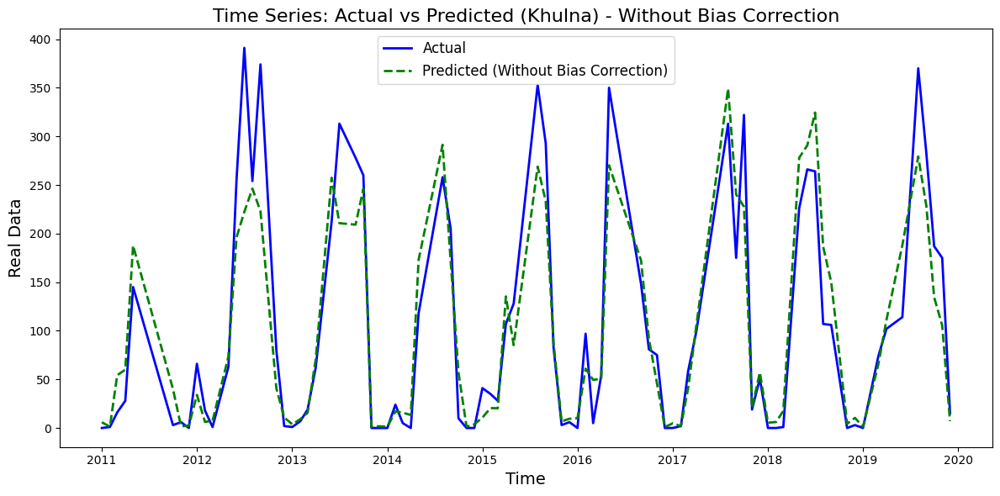

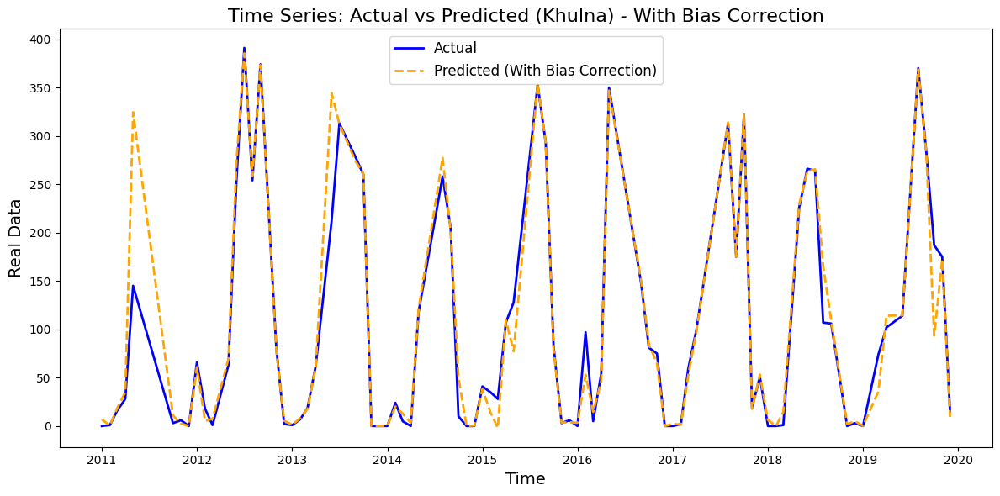

In [ ]:
import matplotlib.pyplot as plt

# Plot without bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_loaded, label="Predicted (Without Bias Correction)", color="green", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Khulna) - Without Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()

# Plot with bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_corrected, label="Predicted (With Bias Correction)", color="orange", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Khulna) - With Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()


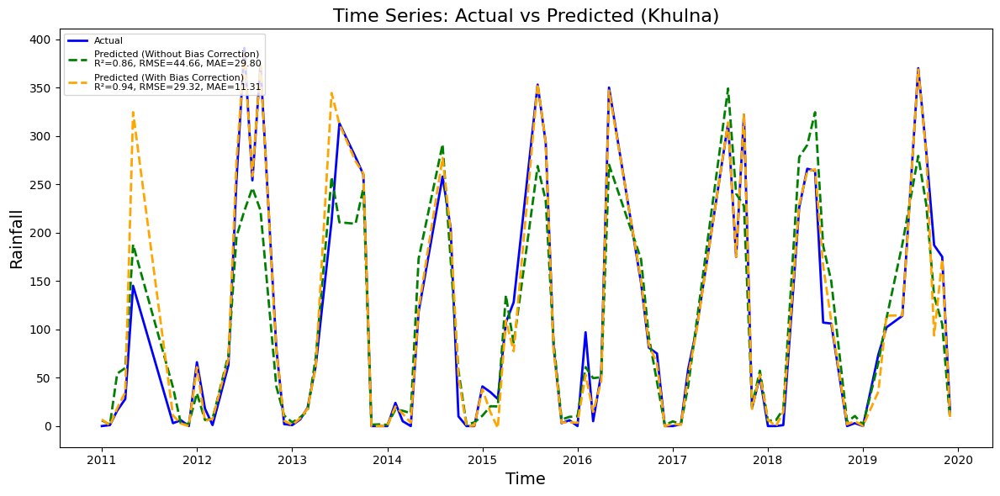

In [ ]:
import matplotlib.pyplot as plt

# Calculate metrics
r2_uncorrected = r2_score(y_test, y_pred_loaded)
rmse_uncorrected = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_uncorrected = mean_absolute_error(y_test, y_pred_loaded)

r2_corrected = r2_score(y_test, y_pred_corrected)
rmse_corrected = np.sqrt(mean_squared_error(y_test, y_pred_corrected))
mae_corrected = mean_absolute_error(y_test, y_pred_corrected)

# Plot both predictions
plt.figure(figsize=(12, 6))

# Actual data
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)

# Predictions without bias correction
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_uncorrected:.2f}, RMSE={rmse_uncorrected:.2f}, MAE={mae_uncorrected:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Predictions with bias correction
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# Plot settings
plt.title("Time Series: Actual vs Predicted (Khulna)", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Rainfall", fontsize=14)
plt.legend(loc="upper left", fontsize=8)  # Smaller fonts, legend at top-left
plt.grid(False)
plt.tight_layout()
plt.show()


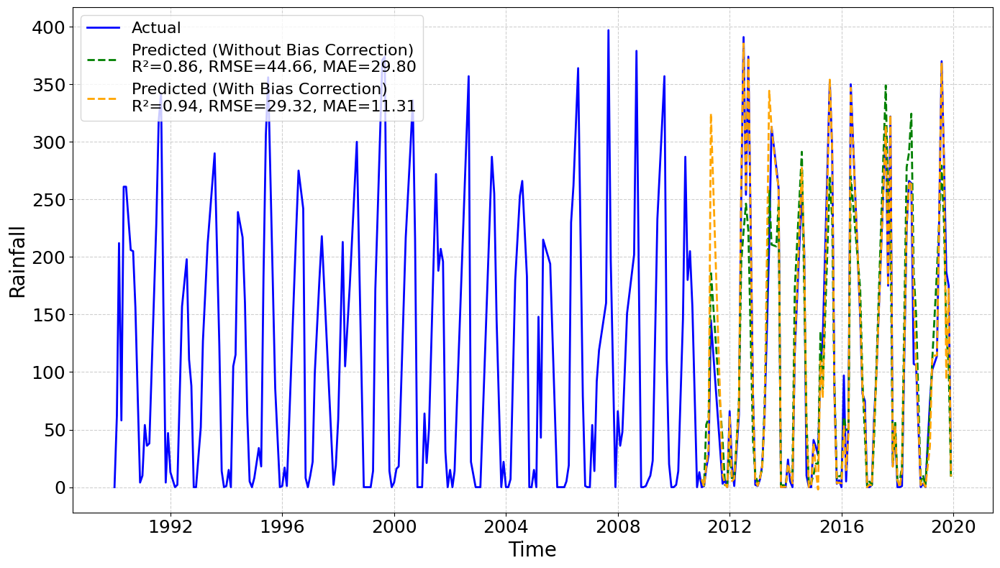

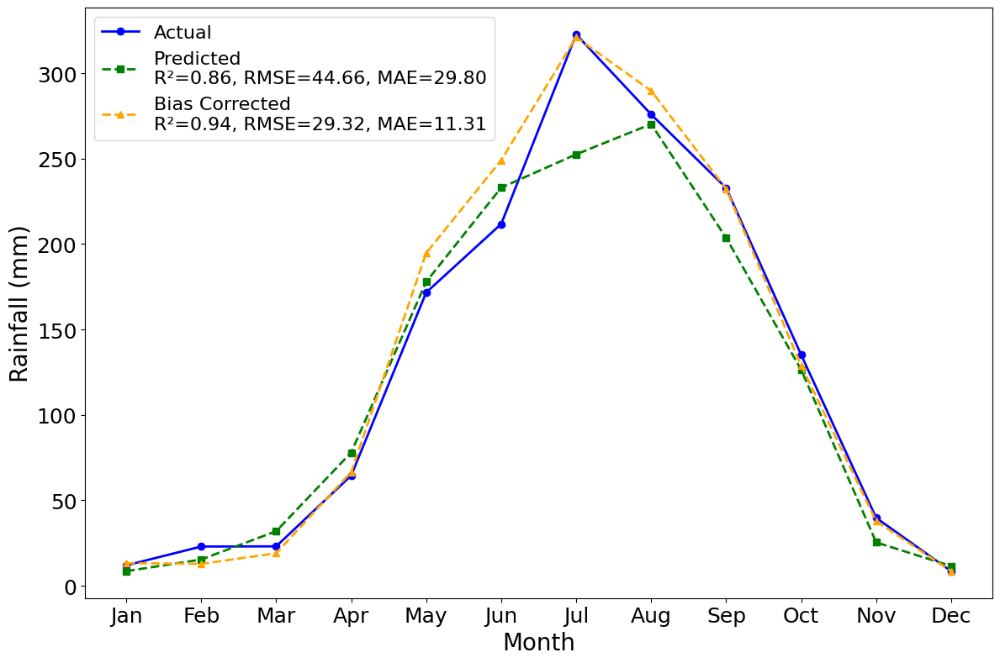

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Combine the actual data into a single series for plotting
full_actual = pd.concat([y_train, y_test])

# Create a NaN-filled array for predictions before 2011
train_nan = np.full(len(y_train), np.nan)

# Combine predictions with NaN for training period
pred_loaded_full = np.concatenate((train_nan, y_pred_loaded))  # Predictions without bias correction
pred_corrected_full = np.concatenate((train_nan, y_pred_corrected))  # Bias-corrected predictions

# Plot the full series
plt.figure(figsize=(14, 8))

# Plot actual data
plt.plot(
    full_actual.index,
    full_actual,
    label="Actual",
    color="blue",
    linewidth=2
)

# Plot predictions without bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_loaded:.2f}, RMSE={rmse_loaded:.2f}, MAE={mae_loaded:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Plot predictions with bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={metrics_corrected['R² (Corrected)']:.2f}, RMSE={metrics_corrected['RMSE (Corrected)']:.2f}, MAE={metrics_corrected['MAE (Corrected)']:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# # Highlight the training and testing periods
# plt.axvspan('1990-01-01', '2010-12-31', color="lightblue", alpha=0.3, label="Training Period (1990–2010)")
# plt.axvspan('2011-01-01', '2020-12-31', color="lightgreen", alpha=0.3, label="Testing Period (2011–2020)")

# Customize the plot

plt.xlabel("Time", fontsize=20)
plt.ylabel("Rainfall", fontsize=20)
plt.legend(loc="upper left", fontsize=16)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/monthly_rainfall_predictions (e).png", dpi=300)
# Show the plot
plt.show()



import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Prepare the data for averaging
# Combine actual, predicted, and bias-corrected values into a single DataFrame
comparison_df = pd.DataFrame({
    "Actual": y_test,
    "Predicted": y_pred_loaded,
    "Bias Corrected": y_pred_corrected
})
comparison_df["Month"] = comparison_df.index.month
comparison_df["Year"] = comparison_df.index.year

# Filter data for 2011–2020
comparison_df_filtered = comparison_df[(comparison_df["Year"] >= 2011) & (comparison_df["Year"] <= 2020)]

# Group by month and calculate the mean for each metric
monthly_avg = comparison_df_filtered.groupby("Month")[["Actual", "Predicted", "Bias Corrected"]].mean()

# Calculate metrics
r2_predicted = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])
rmse_predicted = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"]))
mae_predicted = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])

r2_corrected = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])
rmse_corrected = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"]))
mae_corrected = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])

# Plot the monthly averages
plt.figure(figsize=(12, 8))

# Plot actual values
plt.plot(
    monthly_avg.index,
    monthly_avg["Actual"],
    label="Actual",
    color="blue",
    marker="o",
    linewidth=2
)

# Plot predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Predicted"],
    label=f"Predicted\nR²={r2_predicted:.2f}, RMSE={rmse_predicted:.2f}, MAE={mae_predicted:.2f}",
    color="green",
    marker="s",
    linestyle="--",
    linewidth=2
)

# Plot bias-corrected predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Bias Corrected"],
    label=f"Bias Corrected\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    marker="^",
    linestyle="--",
    linewidth=2
)

# Customize the plot
plt.xlabel("Month", fontsize=20)
plt.ylabel("Rainfall (mm)", fontsize=20)
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"], fontsize=18)
plt.yticks(fontsize=18)
plt.legend(loc="upper left", fontsize=16)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/seasonal_rainfall_predictions (e).png", dpi=300)

# Show the plot
plt.show()


# Rangpur

In [ ]:
df = pd.read_csv(r"/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/Station Data/merged/Rangpur_data.csv")
# Create a datetime column using 'month' and 'year'
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# Set the 'date' column as the index
df.set_index('date', inplace=True)
# Drop the 'month' and 'year' columns
df.drop(columns=['month', 'year'], inplace=True)
# Split into features (X) and target (y)

from sklearn.ensemble import IsolationForest
import pandas as pd

# Initialize the Isolation Forest
iso_forest = IsolationForest(contamination=0.25, random_state=SEED)  # Adjust contamination as needed (proportion of outliers)

# Fit the model and predict anomalies
outlier_labels = iso_forest.fit_predict(df)

# Add the outlier labels to the DataFrame
df['Outlier'] = outlier_labels  # 1 for inliers, -1 for outliers

# Filter out the outliers
cleaned_df = df[df['Outlier'] == 1].drop(columns=['Outlier'])

# Print the results
print(f"Original DataFrame shape: {df.shape}")
print(f"Cleaned DataFrame shape: {cleaned_df.shape}")
df = cleaned_df.copy()
df= df.dropna()
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target
# Split into features (X) and target (y)
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target

# Train-test split based on date index
X_train = X.loc['1990-01-01':'2010-12-31']  # Training features
X_test = X.loc['2011-01-01':'2019-12-31']   # Testing features

y_train = y.loc['1990-01-01':'2010-12-31']  # Training target
y_test = y.loc['2011-01-01':'2019-12-31']   # Testing target

# Print shapes to verify
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")




Original DataFrame shape: (360, 5)
Cleaned DataFrame shape: (270, 4)
X_train shape: (181, 3)
y_train shape: (181,)
X_test shape: (88, 3)
y_test shape: (88,)


In [ ]:
df.describe()

,CHIRPS,ERA5,PERSIANN,Rainfall
count,269.000000,269.000000,269.000000,269.000000
mean,119.199364,140.025690,132.394886,111.895911
std,149.228670,165.062249,167.024469,139.265438
min,2.410346,0.000156,0.000000,0.000000
25%,5.921875,6.844650,6.581831,1.000000
50%,24.426725,44.029772,30.795490,27.000000
75%,233.834591,281.178474,276.208045,214.000000
max,521.937374,587.367058,685.214528,464.000000


In [ ]:
loaded_model.fit(X_train, y_train)
# Use the loaded model to predict
y_pred_loaded = loaded_model.predict(X_test)

# Evaluate the loaded model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse_loaded = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_loaded = mean_absolute_error(y_test, y_pred_loaded)
r2_loaded = r2_score(y_test, y_pred_loaded)

print("\nEvaluation Metrics for the Loaded Model:")
print(f"R²: {r2_loaded:.4f}")
print(f"RMSE: {rmse_loaded:.4f}")
print(f"MAE: {mae_loaded:.4f}")



Evaluation Metrics for the Loaded Model:
R²: 0.9174
RMSE: 40.5404
MAE: 26.4803


## Bias Correction

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
import numpy as np



# Step 1: Calculate residuals
residuals = y_test - y_pred_loaded

# Step 2: Fit the loaded bias model on residuals (train on residuals)
# Split the data to avoid overfitting on the test set
X_train_bias, X_test_bias, residuals_train, residuals_test = train_test_split(
    X_test, residuals, test_size=0.3, random_state=42
)

loaded_bias_model.fit(X_train_bias, residuals_train)

# Step 3: Predict bias (residuals) for the test set
predicted_bias = loaded_bias_model.predict(X_test)

# Step 4: Apply advanced bias correction
y_pred_corrected = y_pred_loaded + predicted_bias

# Step 5: Evaluate corrected predictions
metrics_corrected = {
    "R² (Corrected)": r2_score(y_test, y_pred_corrected),
    "RMSE (Corrected)": np.sqrt(mean_squared_error(y_test, y_pred_corrected)),
    "MAE (Corrected)": mean_absolute_error(y_test, y_pred_corrected),
}

# Display corrected metrics
print("\nEvaluation Metrics with Robust Bias Correction:")
for metric, value in metrics_corrected.items():
    print(f"{metric}: {value:.4f}")

# Optional: Compare pre- and post-correction metrics
metrics_original = {
    "R² (Original)": r2_score(y_test, y_pred_loaded),
    "RMSE (Original)": np.sqrt(mean_squared_error(y_test, y_pred_loaded)),
    "MAE (Original)": mean_absolute_error(y_test, y_pred_loaded),
}

print("\nComparison of Metrics:")
for metric in metrics_original:
    print(f"{metric}: {metrics_original[metric]:.4f} --> {metrics_corrected[metric.replace('Original', 'Corrected')]:.4f}")



Evaluation Metrics with Robust Bias Correction:
R² (Corrected): 0.9828
RMSE (Corrected): 18.4887
MAE (Corrected): 7.3446

Comparison of Metrics:
R² (Original): 0.9174 --> 0.9828
RMSE (Original): 40.5404 --> 18.4887
MAE (Original): 26.4803 --> 7.3446


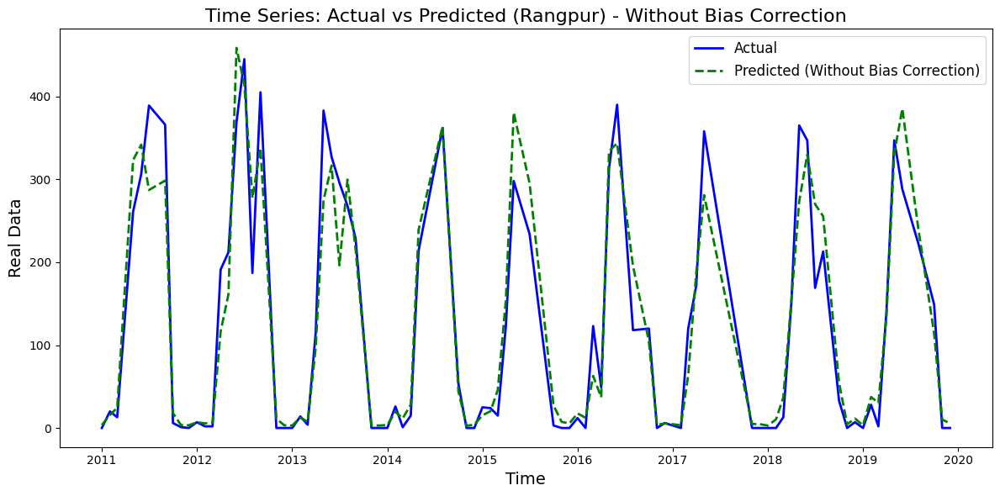

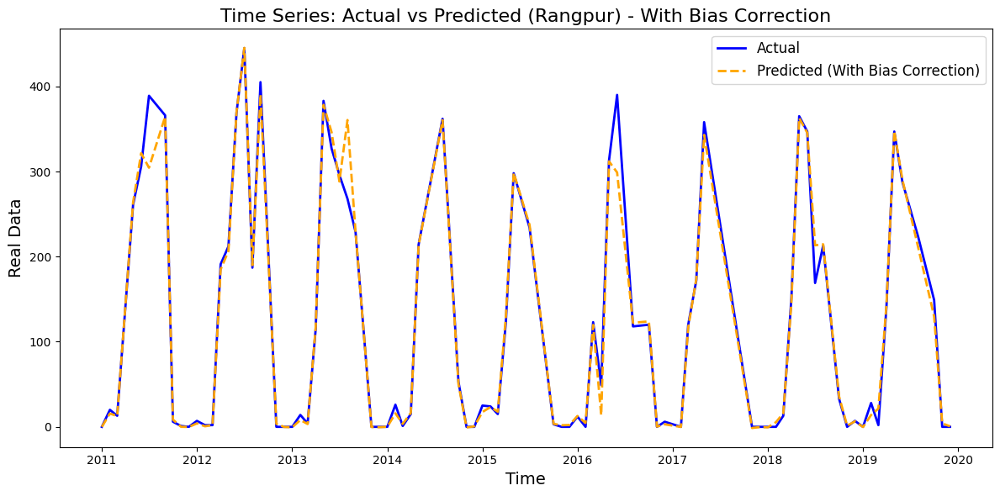

In [ ]:
import matplotlib.pyplot as plt

# Plot without bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_loaded, label="Predicted (Without Bias Correction)", color="green", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Rangpur) - Without Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()

# Plot with bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_corrected, label="Predicted (With Bias Correction)", color="orange", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Rangpur) - With Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()


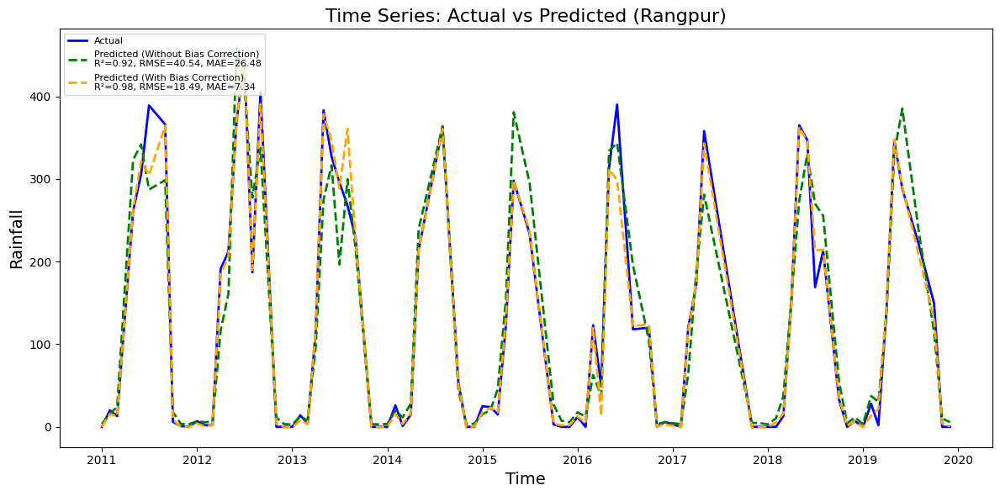

In [ ]:
import matplotlib.pyplot as plt

# Calculate metrics
r2_uncorrected = r2_score(y_test, y_pred_loaded)
rmse_uncorrected = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_uncorrected = mean_absolute_error(y_test, y_pred_loaded)

r2_corrected = r2_score(y_test, y_pred_corrected)
rmse_corrected = np.sqrt(mean_squared_error(y_test, y_pred_corrected))
mae_corrected = mean_absolute_error(y_test, y_pred_corrected)

# Plot both predictions
plt.figure(figsize=(12, 6))

# Actual data
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)

# Predictions without bias correction
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_uncorrected:.2f}, RMSE={rmse_uncorrected:.2f}, MAE={mae_uncorrected:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Predictions with bias correction
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# Plot settings
plt.title("Time Series: Actual vs Predicted (Rangpur)", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Rainfall", fontsize=14)
plt.legend(loc="upper left", fontsize=8)  # Smaller fonts, legend at top-left
plt.grid(False)
plt.tight_layout()
plt.show()


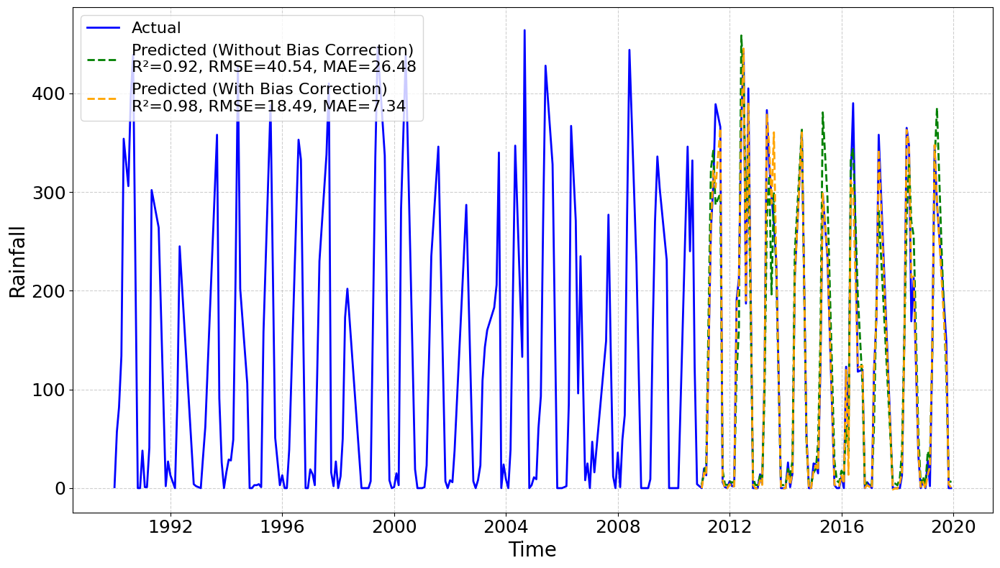

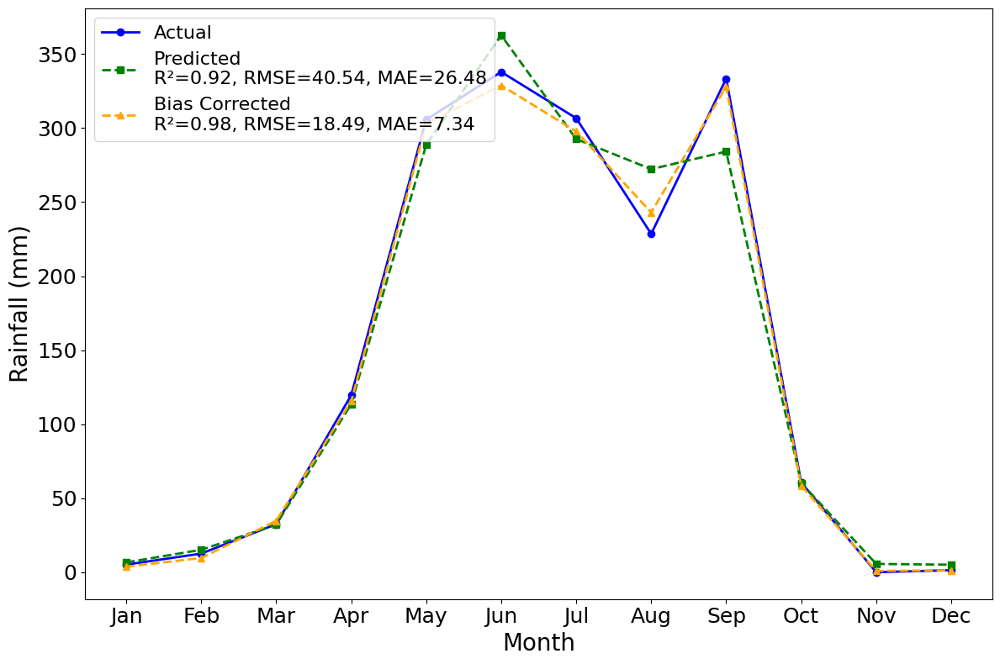

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Combine the actual data into a single series for plotting
full_actual = pd.concat([y_train, y_test])

# Create a NaN-filled array for predictions before 2011
train_nan = np.full(len(y_train), np.nan)

# Combine predictions with NaN for training period
pred_loaded_full = np.concatenate((train_nan, y_pred_loaded))  # Predictions without bias correction
pred_corrected_full = np.concatenate((train_nan, y_pred_corrected))  # Bias-corrected predictions

# Plot the full series
plt.figure(figsize=(14, 8))

# Plot actual data
plt.plot(
    full_actual.index,
    full_actual,
    label="Actual",
    color="blue",
    linewidth=2
)

# Plot predictions without bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_loaded:.2f}, RMSE={rmse_loaded:.2f}, MAE={mae_loaded:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Plot predictions with bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={metrics_corrected['R² (Corrected)']:.2f}, RMSE={metrics_corrected['RMSE (Corrected)']:.2f}, MAE={metrics_corrected['MAE (Corrected)']:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# # Highlight the training and testing periods
# plt.axvspan('1990-01-01', '2010-12-31', color="lightblue", alpha=0.3, label="Training Period (1990–2010)")
# plt.axvspan('2011-01-01', '2020-12-31', color="lightgreen", alpha=0.3, label="Testing Period (2011–2020)")

# Customize the plot

plt.xlabel("Time", fontsize=20)
plt.ylabel("Rainfall", fontsize=20)
plt.legend(loc="upper left", fontsize=16)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/monthly_rainfall_predictions (f).png", dpi=300)
# Show the plot
plt.show()



import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Prepare the data for averaging
# Combine actual, predicted, and bias-corrected values into a single DataFrame
comparison_df = pd.DataFrame({
    "Actual": y_test,
    "Predicted": y_pred_loaded,
    "Bias Corrected": y_pred_corrected
})
comparison_df["Month"] = comparison_df.index.month
comparison_df["Year"] = comparison_df.index.year

# Filter data for 2011–2020
comparison_df_filtered = comparison_df[(comparison_df["Year"] >= 2011) & (comparison_df["Year"] <= 2020)]

# Group by month and calculate the mean for each metric
monthly_avg = comparison_df_filtered.groupby("Month")[["Actual", "Predicted", "Bias Corrected"]].mean()

# Calculate metrics
r2_predicted = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])
rmse_predicted = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"]))
mae_predicted = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])

r2_corrected = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])
rmse_corrected = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"]))
mae_corrected = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])

# Plot the monthly averages
plt.figure(figsize=(12, 8))

# Plot actual values
plt.plot(
    monthly_avg.index,
    monthly_avg["Actual"],
    label="Actual",
    color="blue",
    marker="o",
    linewidth=2
)

# Plot predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Predicted"],
    label=f"Predicted\nR²={r2_predicted:.2f}, RMSE={rmse_predicted:.2f}, MAE={mae_predicted:.2f}",
    color="green",
    marker="s",
    linestyle="--",
    linewidth=2
)

# Plot bias-corrected predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Bias Corrected"],
    label=f"Bias Corrected\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    marker="^",
    linestyle="--",
    linewidth=2
)

# Customize the plot
plt.xlabel("Month", fontsize=20)
plt.ylabel("Rainfall (mm)", fontsize=20)
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"], fontsize=18)
plt.yticks(fontsize=18)
plt.legend(loc="upper left", fontsize=16)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/seasonal_rainfall_predictions (f).png", dpi=300)

# Show the plot
plt.show()


# Rajshahi

In [ ]:
df = pd.read_csv(r"/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/Station Data/merged/Rajshahi_data.csv")
# Create a datetime column using 'month' and 'year'
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# Set the 'date' column as the index
df.set_index('date', inplace=True)
# Drop the 'month' and 'year' columns
df.drop(columns=['month', 'year'], inplace=True)
# Split into features (X) and target (y)

from sklearn.ensemble import IsolationForest
import pandas as pd

# Initialize the Isolation Forest
iso_forest = IsolationForest(contamination=0.25, random_state=SEED)  # Adjust contamination as needed (proportion of outliers)

# Fit the model and predict anomalies
outlier_labels = iso_forest.fit_predict(df)

# Add the outlier labels to the DataFrame
df['Outlier'] = outlier_labels  # 1 for inliers, -1 for outliers

# Filter out the outliers
cleaned_df = df[df['Outlier'] == 1].drop(columns=['Outlier'])

# Print the results
print(f"Original DataFrame shape: {df.shape}")
print(f"Cleaned DataFrame shape: {cleaned_df.shape}")
df = cleaned_df.copy()
df= df.dropna()
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target
# Split into features (X) and target (y)
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target

# Train-test split based on date index
X_train = X.loc['1990-01-01':'2010-12-31']  # Training features
X_test = X.loc['2011-01-01':'2019-12-31']   # Testing features

y_train = y.loc['1990-01-01':'2010-12-31']  # Training target
y_test = y.loc['2011-01-01':'2019-12-31']   # Testing target

# Print shapes to verify
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")




Original DataFrame shape: (360, 5)
Cleaned DataFrame shape: (270, 4)
X_train shape: (181, 3)
y_train shape: (181,)
X_test shape: (88, 3)
y_test shape: (88,)


In [ ]:
df.describe()

,CHIRPS,ERA5,PERSIANN,Rainfall
count,269.000000,269.000000,269.000000,269.000000
mean,67.026172,89.267870,98.272041,66.866171
std,75.700140,101.831579,114.219905,79.339559
min,1.185205,0.000000,0.000000,0.000000
25%,9.050802,5.290152,7.382869,1.000000
50%,26.152677,40.292166,35.668445,27.000000
75%,127.898623,169.484183,193.947965,121.000000
max,278.610906,352.068335,440.512835,292.000000


In [ ]:
loaded_model.fit(X_train, y_train)
# Use the loaded model to predict
y_pred_loaded = loaded_model.predict(X_test)

# Evaluate the loaded model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse_loaded = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_loaded = mean_absolute_error(y_test, y_pred_loaded)
r2_loaded = r2_score(y_test, y_pred_loaded)

print("\nEvaluation Metrics for the Loaded Model:")
print(f"R²: {r2_loaded:.4f}")
print(f"RMSE: {rmse_loaded:.4f}")
print(f"MAE: {mae_loaded:.4f}")



Evaluation Metrics for the Loaded Model:
R²: 0.8322
RMSE: 32.6244
MAE: 22.3393


## Bias Correction

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
import numpy as np


# Step 1: Calculate residuals
residuals = y_test - y_pred_loaded

# Step 2: Fit the loaded bias model on residuals (train on residuals)
# Split the data to avoid overfitting on the test set
X_train_bias, X_test_bias, residuals_train, residuals_test = train_test_split(
    X_test, residuals, test_size=0.3, random_state=42
)

loaded_bias_model.fit(X_train_bias, residuals_train)

# Step 3: Predict bias (residuals) for the test set
predicted_bias = loaded_bias_model.predict(X_test)

# Step 4: Apply advanced bias correction
y_pred_corrected = y_pred_loaded + predicted_bias

# Step 5: Evaluate corrected predictions
metrics_corrected = {
    "R² (Corrected)": r2_score(y_test, y_pred_corrected),
    "RMSE (Corrected)": np.sqrt(mean_squared_error(y_test, y_pred_corrected)),
    "MAE (Corrected)": mean_absolute_error(y_test, y_pred_corrected),
}

# Display corrected metrics
print("\nEvaluation Metrics with Robust Bias Correction:")
for metric, value in metrics_corrected.items():
    print(f"{metric}: {value:.4f}")

# Optional: Compare pre- and post-correction metrics
metrics_original = {
    "R² (Original)": r2_score(y_test, y_pred_loaded),
    "RMSE (Original)": np.sqrt(mean_squared_error(y_test, y_pred_loaded)),
    "MAE (Original)": mean_absolute_error(y_test, y_pred_loaded),
}

print("\nComparison of Metrics:")
for metric in metrics_original:
    print(f"{metric}: {metrics_original[metric]:.4f} --> {metrics_corrected[metric.replace('Original', 'Corrected')]:.4f}")



Evaluation Metrics with Robust Bias Correction:
R² (Corrected): 0.8980
RMSE (Corrected): 25.4373
MAE (Corrected): 11.2683

Comparison of Metrics:
R² (Original): 0.8322 --> 0.8980
RMSE (Original): 32.6244 --> 25.4373
MAE (Original): 22.3393 --> 11.2683


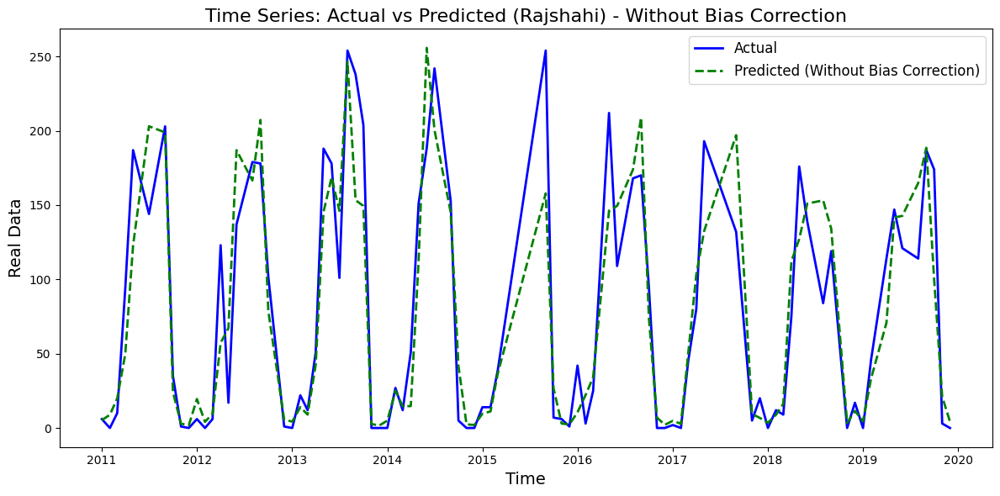

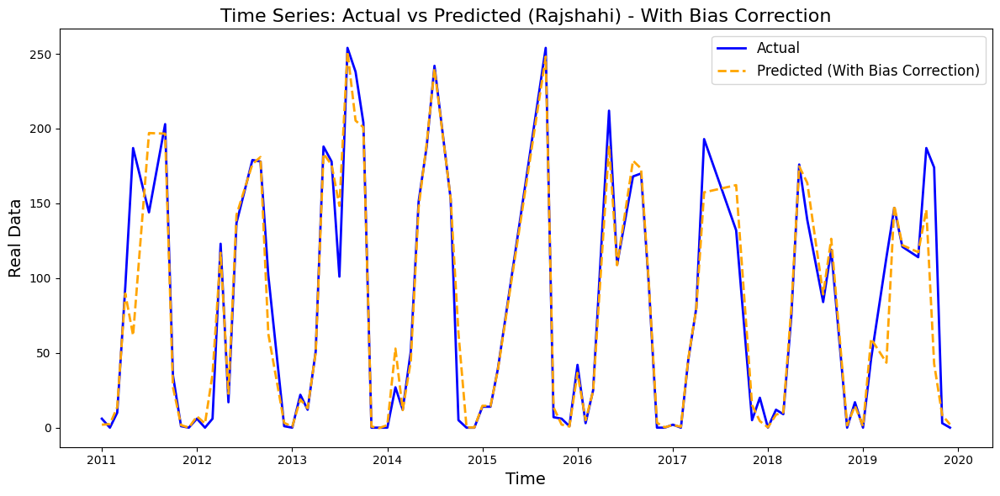

In [ ]:
import matplotlib.pyplot as plt

# Plot without bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_loaded, label="Predicted (Without Bias Correction)", color="green", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Rajshahi) - Without Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()

# Plot with bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_corrected, label="Predicted (With Bias Correction)", color="orange", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Rajshahi) - With Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()


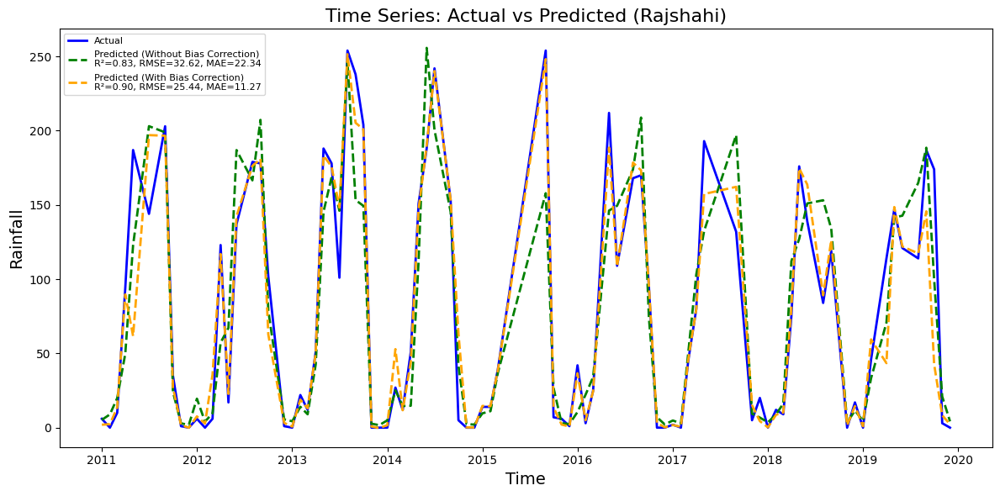

In [ ]:
import matplotlib.pyplot as plt

# Calculate metrics
r2_uncorrected = r2_score(y_test, y_pred_loaded)
rmse_uncorrected = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_uncorrected = mean_absolute_error(y_test, y_pred_loaded)

r2_corrected = r2_score(y_test, y_pred_corrected)
rmse_corrected = np.sqrt(mean_squared_error(y_test, y_pred_corrected))
mae_corrected = mean_absolute_error(y_test, y_pred_corrected)

# Plot both predictions
plt.figure(figsize=(12, 6))

# Actual data
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)

# Predictions without bias correction
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_uncorrected:.2f}, RMSE={rmse_uncorrected:.2f}, MAE={mae_uncorrected:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Predictions with bias correction
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# Plot settings
plt.title("Time Series: Actual vs Predicted (Rajshahi)", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Rainfall", fontsize=14)
plt.legend(loc="upper left", fontsize=8)  # Smaller fonts, legend at top-left
plt.grid(False)
plt.tight_layout()
plt.show()


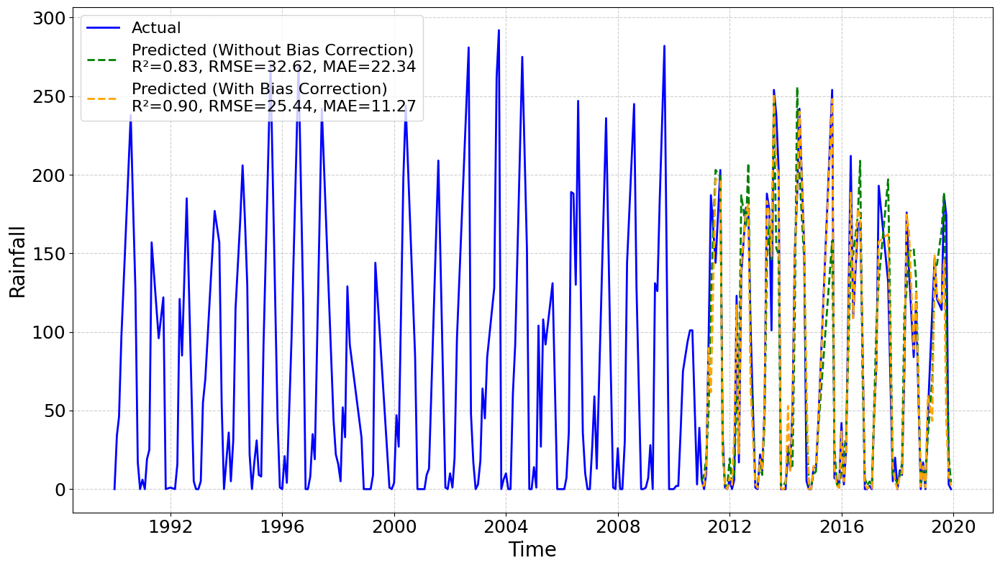

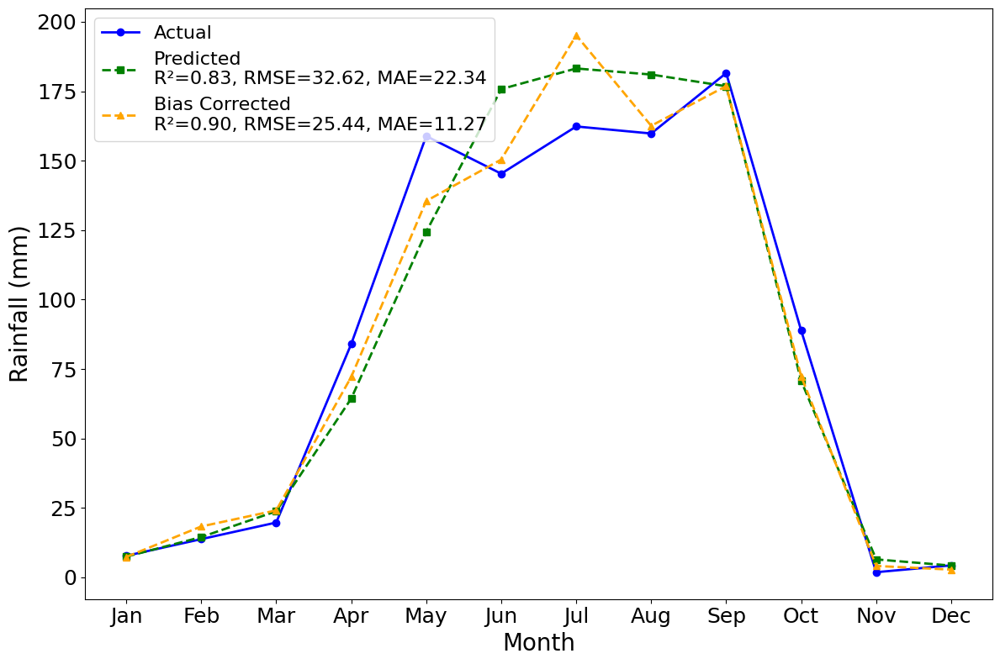

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Combine the actual data into a single series for plotting
full_actual = pd.concat([y_train, y_test])

# Create a NaN-filled array for predictions before 2011
train_nan = np.full(len(y_train), np.nan)

# Combine predictions with NaN for training period
pred_loaded_full = np.concatenate((train_nan, y_pred_loaded))  # Predictions without bias correction
pred_corrected_full = np.concatenate((train_nan, y_pred_corrected))  # Bias-corrected predictions

# Plot the full series
plt.figure(figsize=(14, 8))

# Plot actual data
plt.plot(
    full_actual.index,
    full_actual,
    label="Actual",
    color="blue",
    linewidth=2
)

# Plot predictions without bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_loaded:.2f}, RMSE={rmse_loaded:.2f}, MAE={mae_loaded:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Plot predictions with bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={metrics_corrected['R² (Corrected)']:.2f}, RMSE={metrics_corrected['RMSE (Corrected)']:.2f}, MAE={metrics_corrected['MAE (Corrected)']:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# # Highlight the training and testing periods
# plt.axvspan('1990-01-01', '2010-12-31', color="lightblue", alpha=0.3, label="Training Period (1990–2010)")
# plt.axvspan('2011-01-01', '2020-12-31', color="lightgreen", alpha=0.3, label="Testing Period (2011–2020)")

# Customize the plot

plt.xlabel("Time", fontsize=20)
plt.ylabel("Rainfall", fontsize=20)
plt.legend(loc="upper left", fontsize=16)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/monthly_rainfall_predictions (g).png", dpi=300)
# Show the plot
plt.show()



import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Prepare the data for averaging
# Combine actual, predicted, and bias-corrected values into a single DataFrame
comparison_df = pd.DataFrame({
    "Actual": y_test,
    "Predicted": y_pred_loaded,
    "Bias Corrected": y_pred_corrected
})
comparison_df["Month"] = comparison_df.index.month
comparison_df["Year"] = comparison_df.index.year

# Filter data for 2011–2020
comparison_df_filtered = comparison_df[(comparison_df["Year"] >= 2011) & (comparison_df["Year"] <= 2020)]

# Group by month and calculate the mean for each metric
monthly_avg = comparison_df_filtered.groupby("Month")[["Actual", "Predicted", "Bias Corrected"]].mean()

# Calculate metrics
r2_predicted = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])
rmse_predicted = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"]))
mae_predicted = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])

r2_corrected = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])
rmse_corrected = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"]))
mae_corrected = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])

# Plot the monthly averages
plt.figure(figsize=(12, 8))

# Plot actual values
plt.plot(
    monthly_avg.index,
    monthly_avg["Actual"],
    label="Actual",
    color="blue",
    marker="o",
    linewidth=2
)

# Plot predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Predicted"],
    label=f"Predicted\nR²={r2_predicted:.2f}, RMSE={rmse_predicted:.2f}, MAE={mae_predicted:.2f}",
    color="green",
    marker="s",
    linestyle="--",
    linewidth=2
)

# Plot bias-corrected predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Bias Corrected"],
    label=f"Bias Corrected\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    marker="^",
    linestyle="--",
    linewidth=2
)

# Customize the plot
plt.xlabel("Month", fontsize=20)
plt.ylabel("Rainfall (mm)", fontsize=20)
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"], fontsize=18)
plt.yticks(fontsize=18)
plt.legend(loc="upper left", fontsize=16)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/seasonal_rainfall_predictions (g).png", dpi=300)

# Show the plot
plt.show()


# Sylhet

In [ ]:
df = pd.read_csv(r"/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/Station Data/merged/Sylhet_data.csv")
# Create a datetime column using 'month' and 'year'
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# Set the 'date' column as the index
df.set_index('date', inplace=True)
# Drop the 'month' and 'year' columns
df.drop(columns=['month', 'year'], inplace=True)
# Split into features (X) and target (y)

from sklearn.ensemble import IsolationForest
import pandas as pd

# Initialize the Isolation Forest
iso_forest = IsolationForest(contamination=0.25, random_state=SEED)  # Adjust contamination as needed (proportion of outliers)

# Fit the model and predict anomalies
outlier_labels = iso_forest.fit_predict(df)

# Add the outlier labels to the DataFrame
df['Outlier'] = outlier_labels  # 1 for inliers, -1 for outliers

# Filter out the outliers
cleaned_df = df[df['Outlier'] == 1].drop(columns=['Outlier'])

# Print the results
print(f"Original DataFrame shape: {df.shape}")
print(f"Cleaned DataFrame shape: {cleaned_df.shape}")
df = cleaned_df.copy()
df = df.dropna()
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target
# Split into features (X) and target (y)
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target

# Train-test split based on date index
X_train = X.loc['1990-01-01':'2010-12-31']  # Training features
X_test = X.loc['2011-01-01':'2019-12-31']   # Testing features

y_train = y.loc['1990-01-01':'2010-12-31']  # Training target
y_test = y.loc['2011-01-01':'2019-12-31']   # Testing target

# Print shapes to verify
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")




Original DataFrame shape: (360, 5)
Cleaned DataFrame shape: (270, 4)
X_train shape: (186, 3)
y_train shape: (186,)
X_test shape: (83, 3)
y_test shape: (83,)


In [ ]:
df.describe()

,CHIRPS,ERA5,PERSIANN,Rainfall
count,269.000000,269.000000,269.000000,269.000000
mean,333.892334,321.861672,211.972154,252.423792
std,352.330356,336.970071,223.436487,270.815998
min,3.500855,0.000000,0.000000,0.000000
25%,11.766024,11.518709,10.351093,7.000000
50%,146.077501,165.648997,81.762364,132.000000
75%,675.702339,600.522876,402.511757,486.000000
max,1097.976837,1194.342375,722.330727,901.000000


In [ ]:
loaded_model.fit(X_train, y_train)
# Use the loaded model to predict
y_pred_loaded = loaded_model.predict(X_test)

# Evaluate the loaded model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse_loaded = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_loaded = mean_absolute_error(y_test, y_pred_loaded)
r2_loaded = r2_score(y_test, y_pred_loaded)

print("\nEvaluation Metrics for the Loaded Model:")
print(f"R²: {r2_loaded:.4f}")
print(f"RMSE: {rmse_loaded:.4f}")
print(f"MAE: {mae_loaded:.4f}")



Evaluation Metrics for the Loaded Model:
R²: 0.9236
RMSE: 77.1375
MAE: 48.6519


## Bias Correction

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
import numpy as np



# Step 1: Calculate residuals
residuals = y_test - y_pred_loaded

# Step 2: Fit the loaded bias model on residuals (train on residuals)
# Split the data to avoid overfitting on the test set
X_train_bias, X_test_bias, residuals_train, residuals_test = train_test_split(
    X_test, residuals, test_size=0.3, random_state=42
)

loaded_bias_model.fit(X_train_bias, residuals_train)

# Step 3: Predict bias (residuals) for the test set
predicted_bias = loaded_bias_model.predict(X_test)

# Step 4: Apply advanced bias correction
y_pred_corrected = y_pred_loaded + predicted_bias

# Step 5: Evaluate corrected predictions
metrics_corrected = {
    "R² (Corrected)": r2_score(y_test, y_pred_corrected),
    "RMSE (Corrected)": np.sqrt(mean_squared_error(y_test, y_pred_corrected)),
    "MAE (Corrected)": mean_absolute_error(y_test, y_pred_corrected),
}

# Display corrected metrics
print("\nEvaluation Metrics with Robust Bias Correction:")
for metric, value in metrics_corrected.items():
    print(f"{metric}: {value:.4f}")

# Optional: Compare pre- and post-correction metrics
metrics_original = {
    "R² (Original)": r2_score(y_test, y_pred_loaded),
    "RMSE (Original)": np.sqrt(mean_squared_error(y_test, y_pred_loaded)),
    "MAE (Original)": mean_absolute_error(y_test, y_pred_loaded),
}

print("\nComparison of Metrics:")
for metric in metrics_original:
    print(f"{metric}: {metrics_original[metric]:.4f} --> {metrics_corrected[metric.replace('Original', 'Corrected')]:.4f}")



Evaluation Metrics with Robust Bias Correction:
R² (Corrected): 0.9878
RMSE (Corrected): 30.7832
MAE (Corrected): 13.9063

Comparison of Metrics:
R² (Original): 0.9236 --> 0.9878
RMSE (Original): 77.1375 --> 30.7832
MAE (Original): 48.6519 --> 13.9063


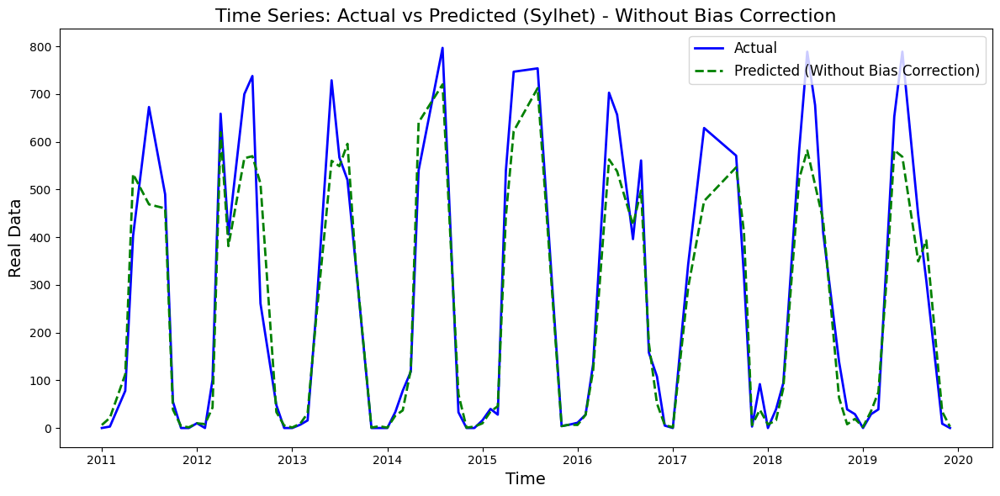

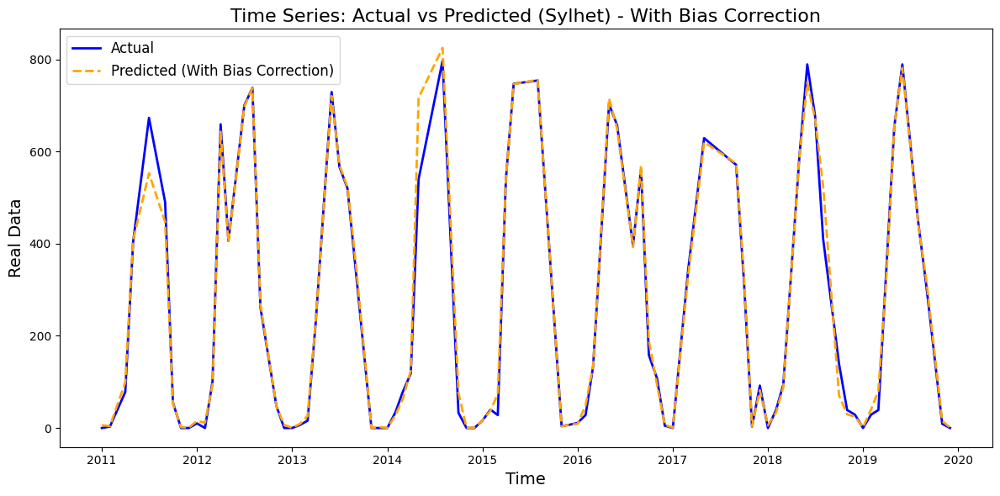

In [ ]:
import matplotlib.pyplot as plt

# Plot without bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_loaded, label="Predicted (Without Bias Correction)", color="green", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Sylhet) - Without Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()

# Plot with bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_corrected, label="Predicted (With Bias Correction)", color="orange", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Sylhet) - With Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()


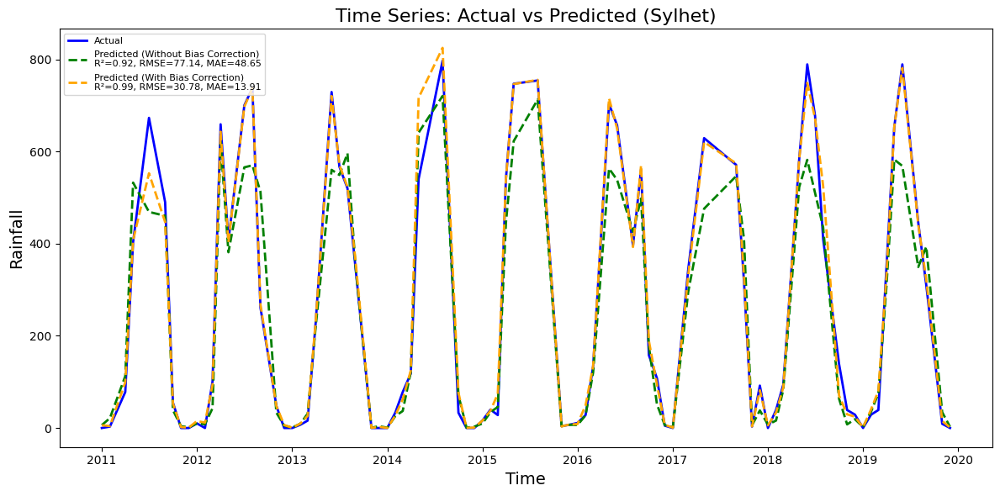

In [ ]:
import matplotlib.pyplot as plt

# Calculate metrics
r2_uncorrected = r2_score(y_test, y_pred_loaded)
rmse_uncorrected = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_uncorrected = mean_absolute_error(y_test, y_pred_loaded)

r2_corrected = r2_score(y_test, y_pred_corrected)
rmse_corrected = np.sqrt(mean_squared_error(y_test, y_pred_corrected))
mae_corrected = mean_absolute_error(y_test, y_pred_corrected)

# Plot both predictions
plt.figure(figsize=(12, 6))

# Actual data
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)

# Predictions without bias correction
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_uncorrected:.2f}, RMSE={rmse_uncorrected:.2f}, MAE={mae_uncorrected:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Predictions with bias correction
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# Plot settings
plt.title("Time Series: Actual vs Predicted (Sylhet)", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Rainfall", fontsize=14)
plt.legend(loc="upper left", fontsize=8)  # Smaller fonts, legend at top-left
plt.grid(False)
plt.tight_layout()
plt.show()


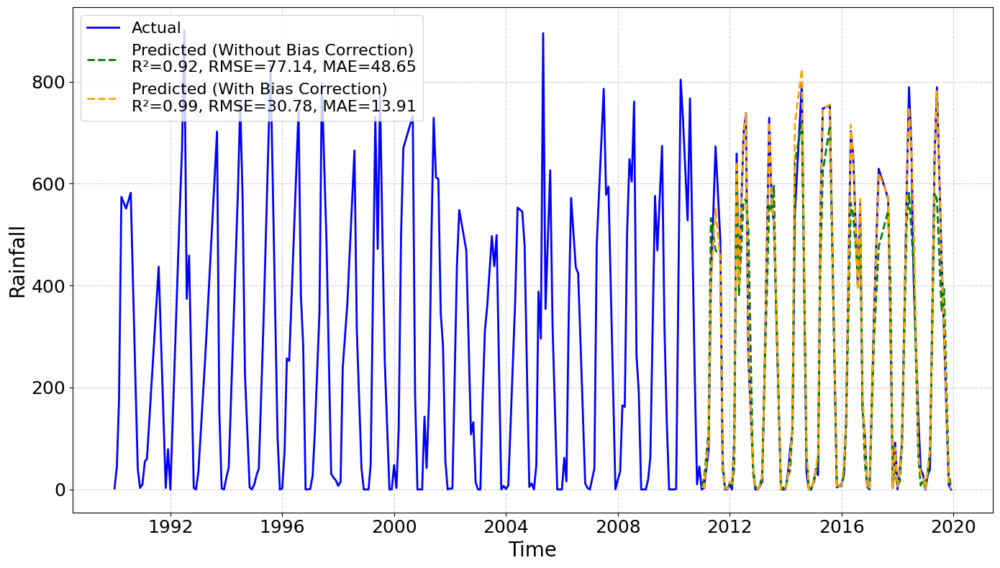

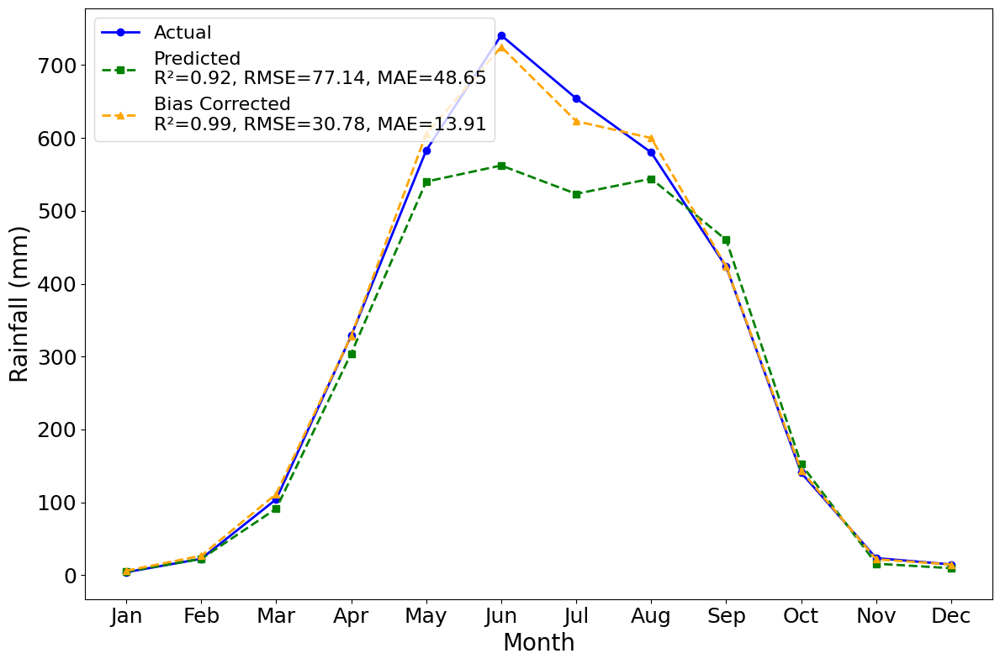

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Combine the actual data into a single series for plotting
full_actual = pd.concat([y_train, y_test])

# Create a NaN-filled array for predictions before 2011
train_nan = np.full(len(y_train), np.nan)

# Combine predictions with NaN for training period
pred_loaded_full = np.concatenate((train_nan, y_pred_loaded))  # Predictions without bias correction
pred_corrected_full = np.concatenate((train_nan, y_pred_corrected))  # Bias-corrected predictions

# Plot the full series
plt.figure(figsize=(14, 8))

# Plot actual data
plt.plot(
    full_actual.index,
    full_actual,
    label="Actual",
    color="blue",
    linewidth=2
)

# Plot predictions without bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_loaded:.2f}, RMSE={rmse_loaded:.2f}, MAE={mae_loaded:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Plot predictions with bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={metrics_corrected['R² (Corrected)']:.2f}, RMSE={metrics_corrected['RMSE (Corrected)']:.2f}, MAE={metrics_corrected['MAE (Corrected)']:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# # Highlight the training and testing periods
# plt.axvspan('1990-01-01', '2010-12-31', color="lightblue", alpha=0.3, label="Training Period (1990–2010)")
# plt.axvspan('2011-01-01', '2020-12-31', color="lightgreen", alpha=0.3, label="Testing Period (2011–2020)")

# Customize the plot

plt.xlabel("Time", fontsize=20)
plt.ylabel("Rainfall", fontsize=20)
plt.legend(loc="upper left", fontsize=16)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/monthly_rainfall_predictions (h).png", dpi=300)
# Show the plot
plt.show()



import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Prepare the data for averaging
# Combine actual, predicted, and bias-corrected values into a single DataFrame
comparison_df = pd.DataFrame({
    "Actual": y_test,
    "Predicted": y_pred_loaded,
    "Bias Corrected": y_pred_corrected
})
comparison_df["Month"] = comparison_df.index.month
comparison_df["Year"] = comparison_df.index.year

# Filter data for 2011–2020
comparison_df_filtered = comparison_df[(comparison_df["Year"] >= 2011) & (comparison_df["Year"] <= 2020)]

# Group by month and calculate the mean for each metric
monthly_avg = comparison_df_filtered.groupby("Month")[["Actual", "Predicted", "Bias Corrected"]].mean()

# Calculate metrics
r2_predicted = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])
rmse_predicted = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"]))
mae_predicted = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])

r2_corrected = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])
rmse_corrected = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"]))
mae_corrected = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])

# Plot the monthly averages
plt.figure(figsize=(12, 8))

# Plot actual values
plt.plot(
    monthly_avg.index,
    monthly_avg["Actual"],
    label="Actual",
    color="blue",
    marker="o",
    linewidth=2
)

# Plot predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Predicted"],
    label=f"Predicted\nR²={r2_predicted:.2f}, RMSE={rmse_predicted:.2f}, MAE={mae_predicted:.2f}",
    color="green",
    marker="s",
    linestyle="--",
    linewidth=2
)

# Plot bias-corrected predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Bias Corrected"],
    label=f"Bias Corrected\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    marker="^",
    linestyle="--",
    linewidth=2
)

# Customize the plot
plt.xlabel("Month", fontsize=20)
plt.ylabel("Rainfall (mm)", fontsize=20)
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"], fontsize=18)
plt.yticks(fontsize=18)
plt.legend(loc="upper left", fontsize=16)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/seasonal_rainfall_predictions (h).png", dpi=300)

# Show the plot
plt.show()


# Sreemangal

In [ ]:
df = pd.read_csv(r"/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/Station Data/merged/Sreemangal_data.csv")
# Create a datetime column using 'month' and 'year'
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# Set the 'date' column as the index
df.set_index('date', inplace=True)
# Drop the 'month' and 'year' columns
df.drop(columns=['month', 'year'], inplace=True)
# Split into features (X) and target (y)

from sklearn.ensemble import IsolationForest
import pandas as pd

# Initialize the Isolation Forest
iso_forest = IsolationForest(contamination=0.25, random_state=SEED)  # Adjust contamination as needed (proportion of outliers)

# Fit the model and predict anomalies
outlier_labels = iso_forest.fit_predict(df)

# Add the outlier labels to the DataFrame
df['Outlier'] = outlier_labels  # 1 for inliers, -1 for outliers

# Filter out the outliers
cleaned_df = df[df['Outlier'] == 1].drop(columns=['Outlier'])

# Print the results
print(f"Original DataFrame shape: {df.shape}")
print(f"Cleaned DataFrame shape: {cleaned_df.shape}")
df = cleaned_df.copy()
df = df.dropna()
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target
# Split into features (X) and target (y)
X = df.drop(columns=['Rainfall'])  # Features
y = df['Rainfall']  # Target

# Train-test split based on date index
X_train = X.loc['1990-01-01':'2010-12-31']  # Training features
X_test = X.loc['2011-01-01':'2019-12-31']   # Testing features

y_train = y.loc['1990-01-01':'2010-12-31']  # Training target
y_test = y.loc['2011-01-01':'2019-12-31']   # Testing target

# Print shapes to verify
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")




Original DataFrame shape: (360, 5)
Cleaned DataFrame shape: (270, 4)
X_train shape: (185, 3)
y_train shape: (185,)
X_test shape: (84, 3)
y_test shape: (84,)


In [ ]:
df.describe()

,CHIRPS,ERA5,PERSIANN,Rainfall
count,269.000000,269.000000,269.000000,269.000000
mean,165.458900,167.623169,196.718626,147.431227
std,158.836063,156.029879,199.555698,146.368223
min,3.641243,0.001840,0.000000,0.000000
25%,9.730825,9.999266,10.485347,5.000000
50%,122.192955,122.569151,118.942888,108.000000
75%,313.540716,307.763904,361.446611,259.000000
max,557.705093,523.000181,652.936039,490.000000


In [ ]:
loaded_model.fit(X_train, y_train)
# Use the loaded model to predict
y_pred_loaded = loaded_model.predict(X_test)

# Evaluate the loaded model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse_loaded = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_loaded = mean_absolute_error(y_test, y_pred_loaded)
r2_loaded = r2_score(y_test, y_pred_loaded)

print("\nEvaluation Metrics for the Loaded Model:")
print(f"R²: {r2_loaded:.4f}")
print(f"RMSE: {rmse_loaded:.4f}")
print(f"MAE: {mae_loaded:.4f}")



Evaluation Metrics for the Loaded Model:
R²: 0.8672
RMSE: 54.8721
MAE: 34.8008


## Bias Correction

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
import numpy as np


# Step 1: Calculate residuals
residuals = y_test - y_pred_loaded

# Step 2: Fit the loaded bias model on residuals (train on residuals)
# Split the data to avoid overfitting on the test set
X_train_bias, X_test_bias, residuals_train, residuals_test = train_test_split(
    X_test, residuals, test_size=0.3, random_state=42
)

loaded_bias_model.fit(X_train_bias, residuals_train)

# Step 3: Predict bias (residuals) for the test set
predicted_bias = loaded_bias_model.predict(X_test)

# Step 4: Apply advanced bias correction
y_pred_corrected = y_pred_loaded + predicted_bias

# Step 5: Evaluate corrected predictions
metrics_corrected = {
    "R² (Corrected)": r2_score(y_test, y_pred_corrected),
    "RMSE (Corrected)": np.sqrt(mean_squared_error(y_test, y_pred_corrected)),
    "MAE (Corrected)": mean_absolute_error(y_test, y_pred_corrected),
}

# Display corrected metrics
print("\nEvaluation Metrics with Robust Bias Correction:")
for metric, value in metrics_corrected.items():
    print(f"{metric}: {value:.4f}")

# Optional: Compare pre- and post-correction metrics
metrics_original = {
    "R² (Original)": r2_score(y_test, y_pred_loaded),
    "RMSE (Original)": np.sqrt(mean_squared_error(y_test, y_pred_loaded)),
    "MAE (Original)": mean_absolute_error(y_test, y_pred_loaded),
}

print("\nComparison of Metrics:")
for metric in metrics_original:
    print(f"{metric}: {metrics_original[metric]:.4f} --> {metrics_corrected[metric.replace('Original', 'Corrected')]:.4f}")



Evaluation Metrics with Robust Bias Correction:
R² (Corrected): 0.9689
RMSE (Corrected): 26.5516
MAE (Corrected): 11.3892

Comparison of Metrics:
R² (Original): 0.8672 --> 0.9689
RMSE (Original): 54.8721 --> 26.5516
MAE (Original): 34.8008 --> 11.3892


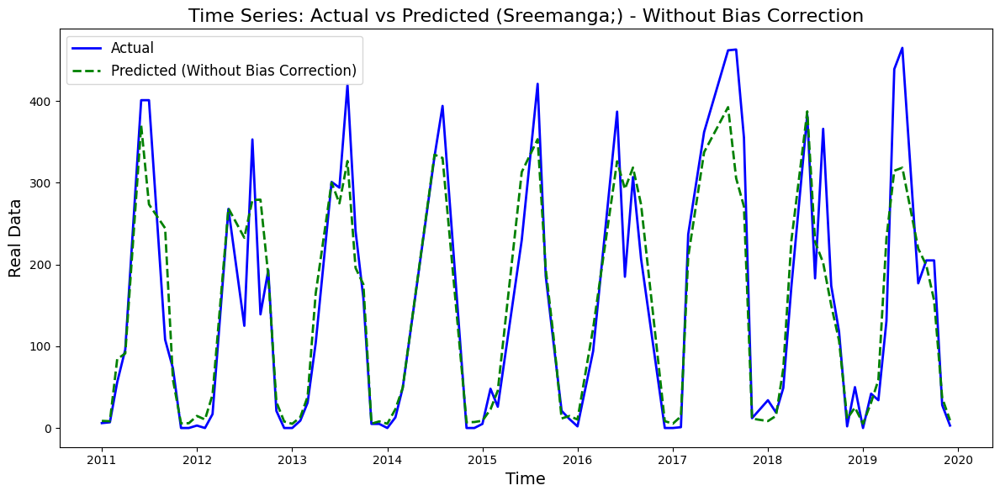

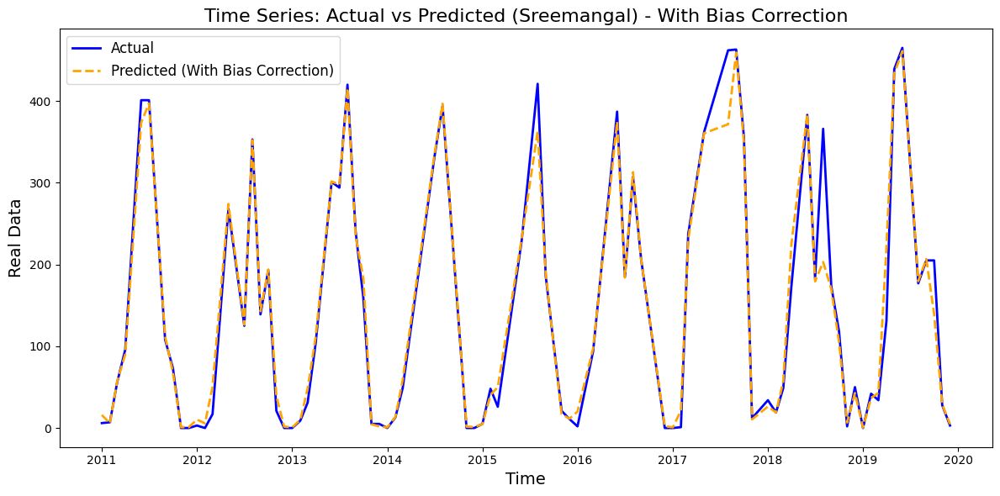

In [ ]:
import matplotlib.pyplot as plt

# Plot without bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_loaded, label="Predicted (Without Bias Correction)", color="green", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Sreemanga;) - Without Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()

# Plot with bias correction
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)
plt.plot(y_test.index, y_pred_corrected, label="Predicted (With Bias Correction)", color="orange", linestyle="--", linewidth=2)
plt.title("Time Series: Actual vs Predicted (Sreemangal) - With Bias Correction", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Real Data", fontsize=14)
plt.legend(fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()


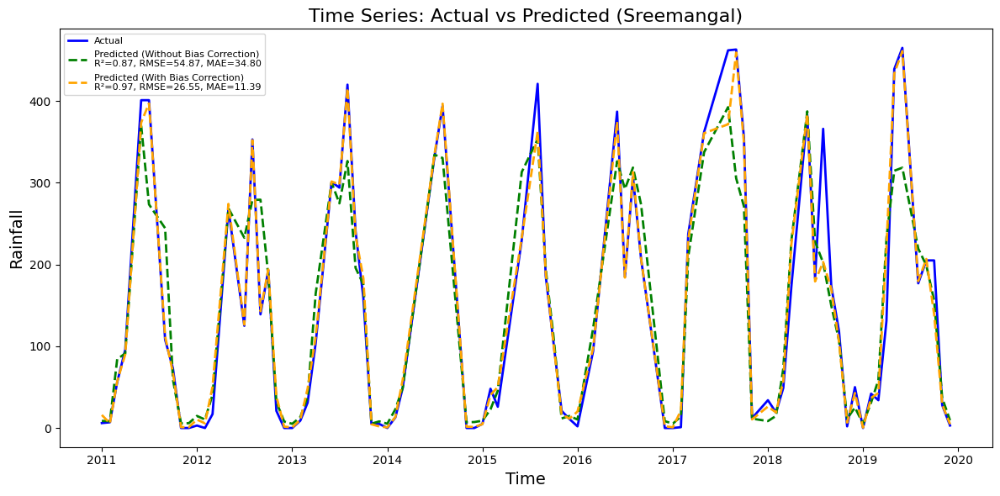

In [ ]:
import matplotlib.pyplot as plt

# Calculate metrics
r2_uncorrected = r2_score(y_test, y_pred_loaded)
rmse_uncorrected = np.sqrt(mean_squared_error(y_test, y_pred_loaded))
mae_uncorrected = mean_absolute_error(y_test, y_pred_loaded)

r2_corrected = r2_score(y_test, y_pred_corrected)
rmse_corrected = np.sqrt(mean_squared_error(y_test, y_pred_corrected))
mae_corrected = mean_absolute_error(y_test, y_pred_corrected)

# Plot both predictions
plt.figure(figsize=(12, 6))

# Actual data
plt.plot(y_test.index, y_test, label="Actual", color="blue", linewidth=2)

# Predictions without bias correction
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_uncorrected:.2f}, RMSE={rmse_uncorrected:.2f}, MAE={mae_uncorrected:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Predictions with bias correction
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# Plot settings
plt.title("Time Series: Actual vs Predicted (Sreemangal)", fontsize=16)
plt.xlabel("Time", fontsize=14)
plt.ylabel("Rainfall", fontsize=14)
plt.legend(loc="upper left", fontsize=8)  # Smaller fonts, legend at top-left
plt.grid(False)
plt.tight_layout()
plt.show()


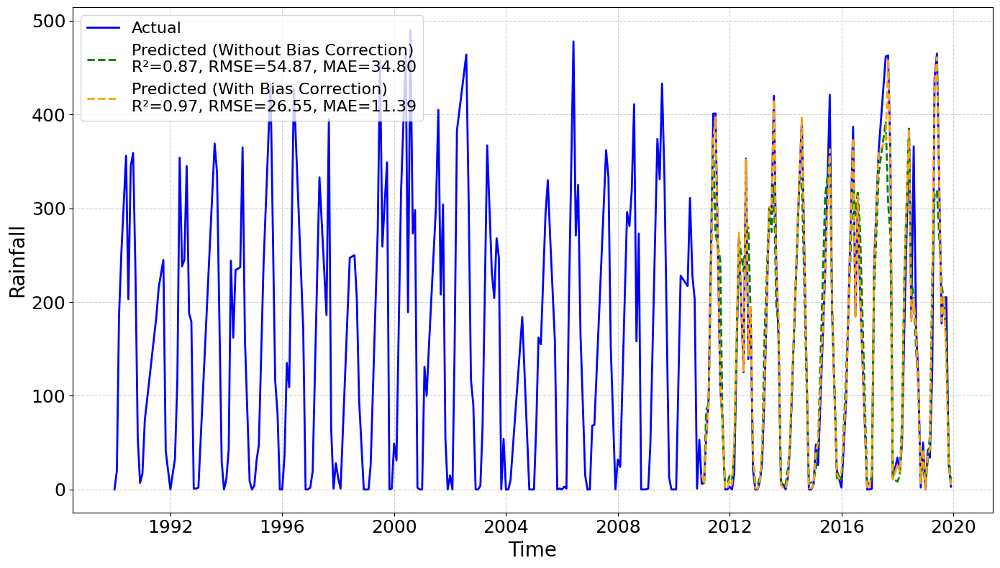

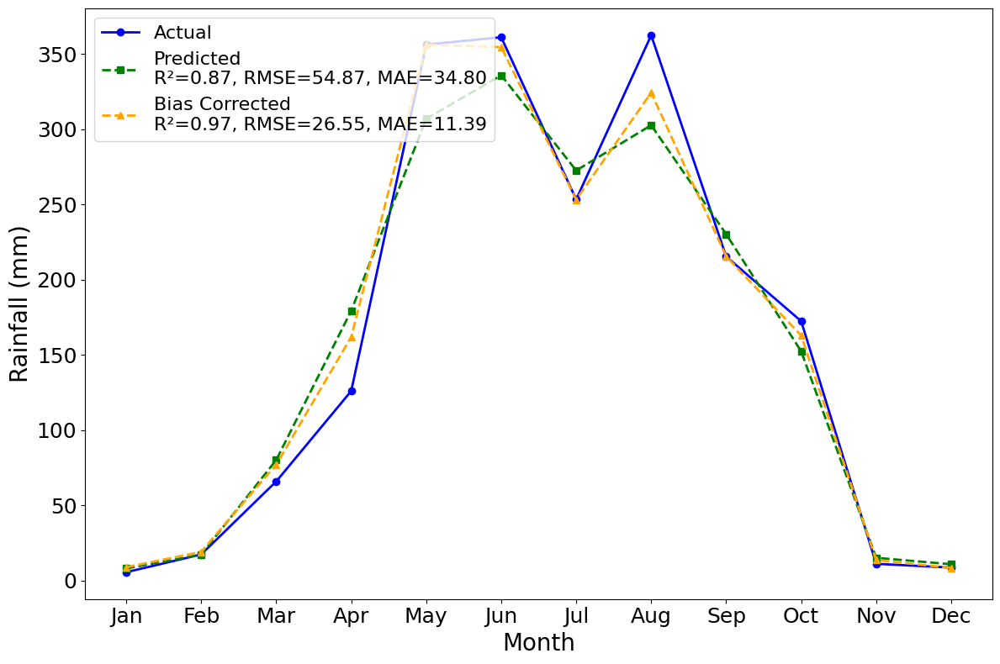

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Combine the actual data into a single series for plotting
full_actual = pd.concat([y_train, y_test])

# Create a NaN-filled array for predictions before 2011
train_nan = np.full(len(y_train), np.nan)

# Combine predictions with NaN for training period
pred_loaded_full = np.concatenate((train_nan, y_pred_loaded))  # Predictions without bias correction
pred_corrected_full = np.concatenate((train_nan, y_pred_corrected))  # Bias-corrected predictions

# Plot the full series
plt.figure(figsize=(14, 8))

# Plot actual data
plt.plot(
    full_actual.index,
    full_actual,
    label="Actual",
    color="blue",
    linewidth=2
)

# Plot predictions without bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_loaded,
    label=f"Predicted (Without Bias Correction)\nR²={r2_loaded:.2f}, RMSE={rmse_loaded:.2f}, MAE={mae_loaded:.2f}",
    color="green",
    linestyle="--",
    linewidth=2
)

# Plot predictions with bias correction (only for testing period)
plt.plot(
    y_test.index,
    y_pred_corrected,
    label=f"Predicted (With Bias Correction)\nR²={metrics_corrected['R² (Corrected)']:.2f}, RMSE={metrics_corrected['RMSE (Corrected)']:.2f}, MAE={metrics_corrected['MAE (Corrected)']:.2f}",
    color="orange",
    linestyle="--",
    linewidth=2
)

# # Highlight the training and testing periods
# plt.axvspan('1990-01-01', '2010-12-31', color="lightblue", alpha=0.3, label="Training Period (1990–2010)")
# plt.axvspan('2011-01-01', '2020-12-31', color="lightgreen", alpha=0.3, label="Testing Period (2011–2020)")

# Customize the plot

plt.xlabel("Time", fontsize=20)
plt.ylabel("Rainfall", fontsize=20)
plt.legend(loc="upper left", fontsize=16)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/monthly_rainfall_predictions (i).png", dpi=300)
# Show the plot
plt.show()



import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Prepare the data for averaging
# Combine actual, predicted, and bias-corrected values into a single DataFrame
comparison_df = pd.DataFrame({
    "Actual": y_test,
    "Predicted": y_pred_loaded,
    "Bias Corrected": y_pred_corrected
})
comparison_df["Month"] = comparison_df.index.month
comparison_df["Year"] = comparison_df.index.year

# Filter data for 2011–2020
comparison_df_filtered = comparison_df[(comparison_df["Year"] >= 2011) & (comparison_df["Year"] <= 2020)]

# Group by month and calculate the mean for each metric
monthly_avg = comparison_df_filtered.groupby("Month")[["Actual", "Predicted", "Bias Corrected"]].mean()

# Calculate metrics
r2_predicted = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])
rmse_predicted = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"]))
mae_predicted = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Predicted"])

r2_corrected = r2_score(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])
rmse_corrected = np.sqrt(mean_squared_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"]))
mae_corrected = mean_absolute_error(comparison_df_filtered["Actual"], comparison_df_filtered["Bias Corrected"])

# Plot the monthly averages
plt.figure(figsize=(12, 8))

# Plot actual values
plt.plot(
    monthly_avg.index,
    monthly_avg["Actual"],
    label="Actual",
    color="blue",
    marker="o",
    linewidth=2
)

# Plot predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Predicted"],
    label=f"Predicted\nR²={r2_predicted:.2f}, RMSE={rmse_predicted:.2f}, MAE={mae_predicted:.2f}",
    color="green",
    marker="s",
    linestyle="--",
    linewidth=2
)

# Plot bias-corrected predicted values
plt.plot(
    monthly_avg.index,
    monthly_avg["Bias Corrected"],
    label=f"Bias Corrected\nR²={r2_corrected:.2f}, RMSE={rmse_corrected:.2f}, MAE={mae_corrected:.2f}",
    color="orange",
    marker="^",
    linestyle="--",
    linewidth=2
)

# Customize the plot
plt.xlabel("Month", fontsize=20)
plt.ylabel("Rainfall (mm)", fontsize=20)
plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"], fontsize=18)
plt.yticks(fontsize=18)
plt.legend(loc="upper left", fontsize=16)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/Projects/OMON Rnn/ML/Data/seasonal_rainfall_predictions (i).png", dpi=300)

# Show the plot
plt.show()


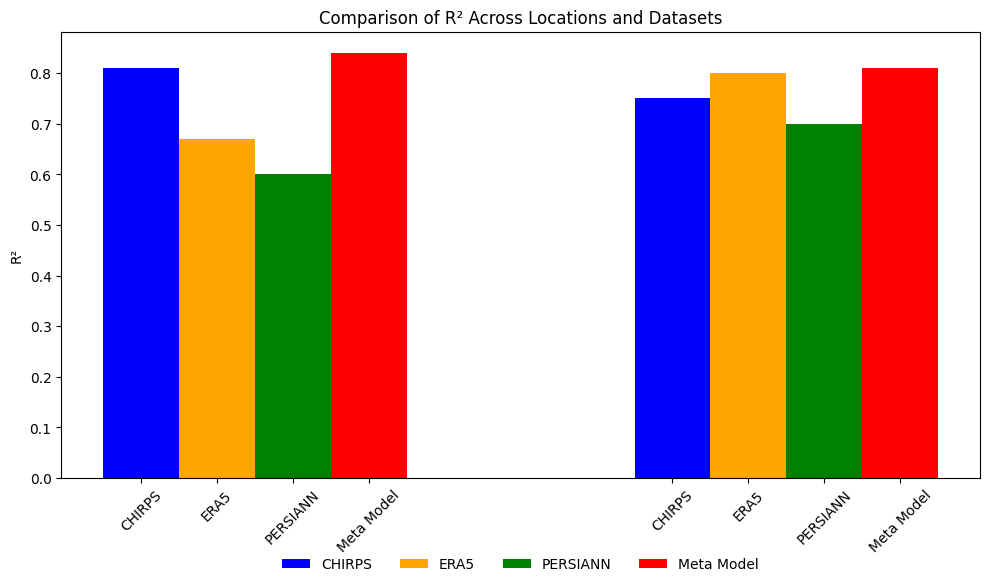

In [ ]:
# Data
locations = ["Chittagong", "Rangamati"]
methods = ["CHIRPS", "ERA5", "PERSIANN", "Meta Model"]

# Values for each location
values = {
    "Chittagong": [0.81, 0.67, 0.6, 0.84],
    "Rangamati": [0.75, 0.8, 0.7, 0.81]
}

# Define colors for each method
colors = ['blue', 'orange', 'green', 'red']

# Bar width
bar_width = 0.2
group_gap = 0.6

# X positions for each group
x_positions = []
current_position = 0
for loc in locations:
    x_positions.append([current_position + i * bar_width for i in range(len(methods))])
    current_position += len(methods) * bar_width + group_gap

# Plotting
fig, ax = plt.subplots(figsize=(10, 6))

for i, loc in enumerate(locations):
    for j, method in enumerate(methods):
        ax.bar(x_positions[i][j], values[loc][j], width=bar_width, color=colors[j], label=method if i == 0 else "")

# Customizing the plot
x_ticks = [pos for group in x_positions for pos in group]
x_labels = methods * len(locations)
ax.set_xticks(x_ticks)
ax.set_xticklabels(x_labels, rotation=45)
ax.set_ylabel("R²")
ax.set_title("Comparison of R² Across Locations and Datasets")

# Adding the legend below the x-axis without a title
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels, loc="upper center", bbox_to_anchor=(0.5, -0.15), ncol=len(methods), frameon=False)

plt.tight_layout()
plt.show()


In [ ]:
# %%shell
# jupyter nbconvert --to html /content/Updated_Last_Last_Remote_Sensing_Rainfall_Prediction_Using_Meta_ML.ipynb